In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import os,sys, gc, keras

dirpath = os.getcwd().split("code")[0]+"code/"
sys.path.append(dirpath)
from pre_process import clean_LC,generate_representation
from evaluation import calculate_metrics, evaluate_metadata, evaluate_metadata_raw

folder = "../../KOI_Data/"
folder_lc = "/work/work_teamEXOPLANET/KOI_LC/"

Using TensorFlow backend.
/home/casapanshop/anaconda2/envs/newpy3_tf1/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/casapanshop/anaconda2/envs/newpy3_tf1/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/casapanshop/anaconda2/envs/newpy3_tf1/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16

In [2]:
# NEW: metadata relacionada solo con el objetivo en transito
names_m = ['Period', 'Duration', 'Time of Transit Epoch', 'r/R', 'a/R',
       'Inclination', 'Impact Parameter', 'Fitted Stellar Density',
       'Limb Darkening Coeff1', 'Limb Darkening Coeff2']
metadata_transit = np.load("LC_features/MetadataLC.npy") #nans vienen imputados con mediana...
df_meta_obj = pd.DataFrame(metadata_transit, columns=names_m)

#maybe for scale---
df_meta_obj["Comp_I"] = 90-df_meta_obj["Inclination"]
df_meta_obj.drop("Inclination", axis=1,inplace=True)

df_meta_obj.head()

,Period,Duration,Time of Transit Epoch,r/R,a/R,Impact Parameter,Fitted Stellar Density,Limb Darkening Coeff1,Limb Darkening Coeff2,Comp_I
0,8.884923,0.086252,169.991686,0.114,36.466,0.069,11.62061,0.497,0.204,0.11
1,5.092465,0.152458,357.535940,0.014,10.670,0.161,0.88510,0.551,0.165,0.86
2,275.073650,0.140417,315.248600,0.014,512.000,0.595,33.55994,0.437,0.243,0.07
3,8.460439,0.197288,133.774490,0.478,14.087,1.061,0.73874,0.299,0.306,4.32
4,21.761298,0.051792,166.540438,0.032,137.070,0.123,102.86534,0.627,0.108,0.05


In [33]:
df_meta_obj["scale"] = np.std(X_fold_lc, axis=1)
df_meta_obj.head()

,Period,Duration,Time of Transit Epoch,r/R,a/R,Impact Parameter,Fitted Stellar Density,Limb Darkening Coeff1,Limb Darkening Coeff2,Comp_I,scale
0,8.884923,0.086252,169.991686,0.114,36.466,0.069,11.62061,0.497,0.204,0.11,822.329703
1,5.092465,0.152458,357.535940,0.014,10.670,0.161,0.88510,0.551,0.165,0.86,22302.640961
2,275.073650,0.140417,315.248600,0.014,512.000,0.595,33.55994,0.437,0.243,0.07,226628.752626
3,8.460439,0.197288,133.774490,0.478,14.087,1.061,0.73874,0.299,0.306,4.32,126.146973
4,21.761298,0.051792,166.540438,0.032,137.070,0.123,102.86534,0.627,0.108,0.05,85142.451689


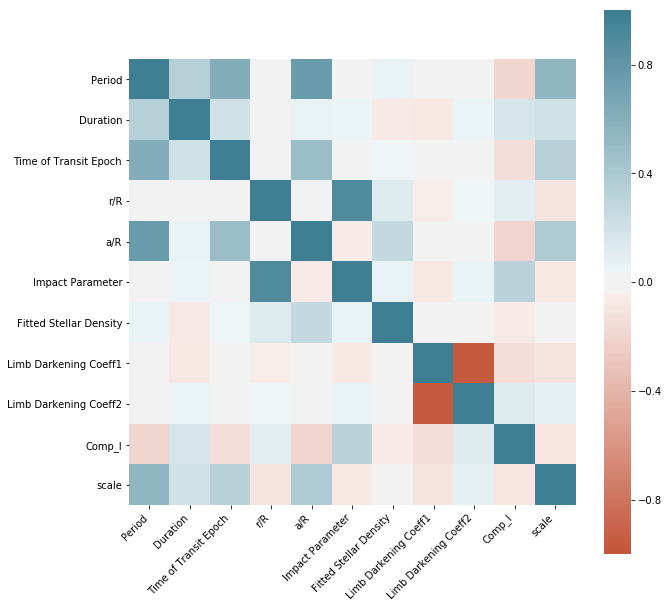

,Period,Duration,Time of Transit Epoch,r/R,a/R,Impact Parameter,Fitted Stellar Density,Limb Darkening Coeff1,Limb Darkening Coeff2,Comp_I,scale
Period,1.000000,0.348810,0.616285,-0.026363,0.755161,-0.035533,0.064883,-0.009254,0.002704,-0.189632,0.545399
Duration,0.348810,1.000000,0.203726,0.035540,0.076151,0.057384,-0.075392,-0.083328,0.060643,0.179257,0.190326
Time of Transit Epoch,0.616285,0.203726,1.000000,0.009443,0.492104,0.004544,0.042349,0.016909,-0.017102,-0.142615,0.335435
r/R,-0.026363,0.035540,0.009443,1.000000,-0.007253,0.885075,0.117543,-0.056985,0.045581,0.111103,-0.109596
a/R,0.755161,0.076151,0.492104,-0.007253,1.000000,-0.066939,0.278093,0.036486,-0.031602,-0.207773,0.385868
Impact Parameter,-0.035533,0.057384,0.004544,0.885075,-0.066939,1.000000,0.072279,-0.085154,0.069575,0.323748,-0.085911
Fitted Stellar Density,0.064883,-0.075392,0.042349,0.117543,0.278093,0.072279,1.000000,0.020224,-0.009556,-0.064735,0.025434
Limb Darkening Coeff1,-0.009254,-0.083328,0.016909,-0.056985,0.036486,-0.085154,0.020224,1.000000,-0.966689,-0.147522,-0.110480
Limb Darkening Coeff2,0.002704,0.060643,-0.017102,0.045581,-0.031602,0.069575,-0.009556,-0.966689,1.000000,0.120026,0.082050
Comp_I,-0.189632,0.179257,-0.142615,0.111103,-0.207773,0.323748,-0.064735,-0.147522,0.120026,1.000000,-0.107931


In [8]:
#df_meta_obj = impute_on_pandas(df_meta_obj)
corr = df_meta_obj.corr()

plt.figure(figsize=(10,10))
ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
)
plt.show()

corr

In [34]:
del_val = ["scale"]
#eliminar valores dependientes de otros
del_val += ["Impact Parameter"]
del_val += ["Fitted Stellar Density", "Duration"] 

Y_values = df_meta_obj.drop(del_val, axis=1).values 

Y_mu = np.mean(Y_values)
Y_std = np.std(Y_values)

Ylog_mu = np.mean(np.log(Y_values+1))
Ylog_std = np.std(np.log(Y_values+1))

from sklearn.preprocessing import StandardScaler, RobustScaler
std_metadata = StandardScaler()
Ystd_transit = std_metadata.fit_transform(Y_values)

In [ ]:
## visualizar boxplot de Y_values, luego con log, luego con log+1

In [35]:
S_data = df_meta_obj["scale"].values
S_mu = np.mean(S_data)
S_std = np.std(S_data)

Sinvlog_mu = np.mean(np.log(S_data))
Sinvlog_std = np.std(np.log(S_data))

def Norm(x,mu,std):
    return (x - mu)/std

def RevertNorm(x,mu,std):
    return std*x + mu

(array([7.775e+03, 1.640e+02, 7.200e+01, 2.700e+01, 8.000e+00, 6.000e+00,
        1.000e+00, 0.000e+00, 0.000e+00, 1.000e+00]),
 array([-0.24163441,  2.00775142,  4.25713726,  6.50652309,  8.75590892,
        11.00529475, 13.25468058, 15.50406642, 17.75345225, 20.00283808,
        22.25222391]),
 <a list of 10 Patch objects>)

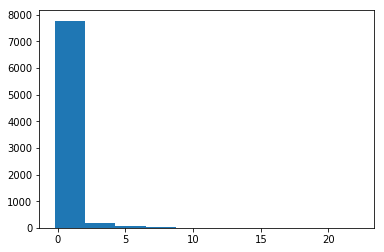

In [220]:
a = 1/Sinv_data
plt.hist((a-np.mean(a))/np.std(a))

In [36]:
from sklearn.metrics import mean_squared_error

model = Sequential()
model.add(InputLayer(input_shape=Y_values.shape[1:]))
model.add(Lambda(Norm_L, arguments={'mu':Ylog_mu,'std':Ylog_std})) #escala metadata <<< necesario
#model.add(Lambda(Norm, arguments={'mu':Y_mu,'std':Y_std})) #escala metadata

model.add(Dense(16, activation='relu'))
model.add(Dense(1, activation='tanh'))
model.add(Dense(1, activation='linear'))


#model.add(Lambda(RevertNorm_L, arguments={'mu':Sinvlog_mu,'std':Sinvlog_std})) #revert escala
#model.add(Lambda(RevertNorm, arguments={'mu':Sinv_mu,'std':Sinv_std})) #revert escala

def MSLE_scale(y_true, y_pred):
    mse_SCALE = K.mean(K.square( K.log(y_true) - K.log(y_pred) ), axis=-1)
    return mse_SCALE / (Sinvlog_std)**2 #divide in order to MSLE does not have scale

def MSE_scale(y_true, y_pred):
    mse_SCALE = K.mean(K.square(y_true - y_pred))
    return mse_SCALE / (Sinv_std)**2 #divide in order to not have scale

model.compile(loss='mse', optimizer='adam')

model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_7 (InputLayer)         (None, 7)                 0         
_________________________________________________________________
lambda_1 (Lambda)            (None, 7)                 0         
_________________________________________________________________
dense_19 (Dense)             (None, 16)                128       
_________________________________________________________________
dense_20 (Dense)             (None, 1)                 17        
_________________________________________________________________
dense_21 (Dense)             (None, 1)                 2         
Total params: 147
Trainable params: 147
Non-trainable params: 0
_________________________________________________________________


In [61]:
model.fit(Y_values, S_data, batch_size=batch_size, epochs=300, validation_split=0.25)

Train on 6040 samples, validate on 2014 samples
Epoch 1/300
6040/6040 [==============================] - 2s 283us/step - loss: 1.1289 - val_loss: 1.0618
Epoch 2/300
6040/6040 [==============================] - 0s 46us/step - loss: 0.8925 - val_loss: 0.9602
Epoch 3/300
6040/6040 [==============================] - 0s 49us/step - loss: 0.8217 - val_loss: 0.9143
Epoch 4/300
6040/6040 [==============================] - 0s 49us/step - loss: 0.7988 - val_loss: 0.9007
Epoch 5/300
6040/6040 [==============================] - 0s 49us/step - loss: 0.7853 - val_loss: 0.8882
Epoch 6/300
6040/6040 [==============================] - 0s 49us/step - loss: 0.7730 - val_loss: 0.8774
Epoch 7/300
6040/6040 [==============================] - 0s 48us/step - loss: 0.7632 - val_loss: 0.8639
Epoch 8/300
6040/6040 [==============================] - 0s 48us/step - loss: 0.7508 - val_loss: 0.8521
Epoch 9/300
6040/6040 [==============================] - 0s 50us/step - loss: 0.7413 - val_loss: 0.8447
Epoch 10/300
60

6040/6040 [==============================] - 0s 49us/step - loss: 0.5703 - val_loss: 0.6809
Epoch 156/300
6040/6040 [==============================] - 0s 49us/step - loss: 0.5673 - val_loss: 0.6851
Epoch 157/300
6040/6040 [==============================] - 0s 46us/step - loss: 0.5683 - val_loss: 0.6795
Epoch 158/300
6040/6040 [==============================] - 0s 49us/step - loss: 0.5666 - val_loss: 0.6798
Epoch 159/300
6040/6040 [==============================] - 0s 52us/step - loss: 0.5678 - val_loss: 0.6826
Epoch 160/300
6040/6040 [==============================] - 0s 49us/step - loss: 0.5699 - val_loss: 0.6788
Epoch 161/300
6040/6040 [==============================] - 0s 49us/step - loss: 0.5673 - val_loss: 0.6775
Epoch 162/300
6040/6040 [==============================] - 0s 47us/step - loss: 0.5649 - val_loss: 0.6791
Epoch 163/300
6040/6040 [==============================] - 0s 53us/step - loss: 0.5650 - val_loss: 0.6765
Epoch 164/300
6040/6040 [==============================] - 0

In [37]:
model.fit(Y_values, (S_data-S_mu)/S_std, batch_size=batch_size, epochs=300, validation_split=0.25)

Train on 6040 samples, validate on 2014 samples
Epoch 1/300
6040/6040 [==============================] - 2s 291us/step - loss: 0.9288 - val_loss: 0.9974
Epoch 2/300
6040/6040 [==============================] - 0s 48us/step - loss: 0.8587 - val_loss: 0.9682
Epoch 3/300
6040/6040 [==============================] - 0s 48us/step - loss: 0.8358 - val_loss: 0.9467
Epoch 4/300
6040/6040 [==============================] - 0s 45us/step - loss: 0.8192 - val_loss: 0.9314
Epoch 5/300
6040/6040 [==============================] - 0s 45us/step - loss: 0.8066 - val_loss: 0.9184
Epoch 6/300
6040/6040 [==============================] - 0s 47us/step - loss: 0.7937 - val_loss: 0.9041
Epoch 7/300
6040/6040 [==============================] - 0s 46us/step - loss: 0.7823 - val_loss: 0.8904
Epoch 8/300
6040/6040 [==============================] - 0s 46us/step - loss: 0.7688 - val_loss: 0.8740
Epoch 9/300
6040/6040 [==============================] - 0s 45us/step - loss: 0.7576 - val_loss: 0.8630
Epoch 10/300
60

6040/6040 [==============================] - 0s 44us/step - loss: 0.5547 - val_loss: 0.6643
Epoch 156/300
6040/6040 [==============================] - 0s 45us/step - loss: 0.5530 - val_loss: 0.6658
Epoch 157/300
6040/6040 [==============================] - 0s 45us/step - loss: 0.5549 - val_loss: 0.6637
Epoch 158/300
6040/6040 [==============================] - 0s 46us/step - loss: 0.5526 - val_loss: 0.6656
Epoch 159/300
6040/6040 [==============================] - 0s 55us/step - loss: 0.5582 - val_loss: 0.6665
Epoch 160/300
6040/6040 [==============================] - 0s 53us/step - loss: 0.5548 - val_loss: 0.6643
Epoch 161/300
6040/6040 [==============================] - 0s 51us/step - loss: 0.5578 - val_loss: 0.6663
Epoch 162/300
6040/6040 [==============================] - 0s 51us/step - loss: 0.5531 - val_loss: 0.6656
Epoch 163/300
6040/6040 [==============================] - 0s 44us/step - loss: 0.5548 - val_loss: 0.6722
Epoch 164/300
6040/6040 [==============================] - 0

In [209]:
S_data_hat = model.predict(Y_values)

print("MSE de escala escalado= ",mean_squared_error(S_data, S_data_hat)*(1/S_std)**2)

MSE de escala escalado=  0.5488727858673242


In [206]:
S_data_hat = model.predict(Y_values)

print("MSE de escala escalado= ",mean_squared_error(S_data, S_data_hat)*(1/S_std)**2)
#loss con log

MSE de escala escalado=  0.5745191337571472


In [56]:
S_data_hat = model.predict(Y_values)

print("MSE de escala escalado= ",mean_squared_error(S_data, S_data_hat)*(1/S_std)**2)
#as MA

MSE de escala escalado=  0.5733655208726693


In [59]:
S_data_hat = model.predict(Y_values)

print("MSE de escala escalado= ",mean_squared_error(S_data, S_data_hat)*(1/S_std)**2)
#as MA. loss con log

MSE de escala escalado=  0.6212452858087794


In [62]:
S_data_hat = model.predict(Y_values)

print("MSE de escala escalado= ",mean_squared_error(S_data, S_data_hat)*(1/S_std)**2)
#as MA+revertNorm (sinlog)

MSE de escala escalado=  0.5645860177648075


Reconstruir escala solo con metadata:
* Con log en la loss 
    * Normal: 5) 2.07 RMSE, 0.73 corr, 0.77 mse-s
* Sin log en la loss
    * Normal: 5) 2.93 RMSE, 0.76 corr, 0.70 mse-s
    * con RevertNorm 

Lo que funcione de arriba:
* Mejor =
* Sacar tanh en reconstruccion =

Lo que funcione de arriba -- solo si aprende a reconstruir:
* mejor = 
* Agregar $z$ en reconstrucción de escala =

Lo que funcione de arriba
* Mejor =
* Sin codificar escala = 

In [3]:
del_val = []

#eliminar valores dependientes de otros
del_val += ["Impact Parameter"]
del_val += ["Fitted Stellar Density", "Duration"] 

Y_values = df_meta_obj.drop(del_val, axis=1).values 
Y_values.shape

(8054, 7)

In [4]:
#mascara sobre curvas de luz que tienen comportamiento de transito Mandel-Agol
mask_transit = np.load("data/mask_transit_LC.npy") 
mask_transit
np.shape(mask_transit)

(8054,)

#### Etiquetas en datos entrenados/transitos

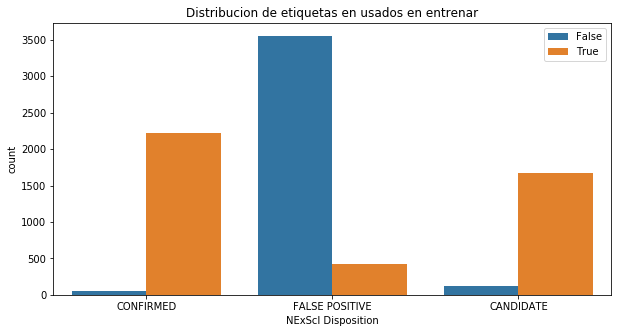

In [11]:
df_aux = pd.read_csv("../../KOI_Data/kepler_dataset.csv")

plt.figure(figsize=(10,5))
sns.countplot(df_aux["NExScI Disposition"],hue=mask_transit)
plt.title("Distribucion de etiquetas en usados en entrenar")
plt.show()

In [5]:
df_meta_transit = df_meta_obj[mask_transit]

Y_transit = Y_values[mask_transit] 

from sklearn.preprocessing import StandardScaler, RobustScaler
std_metadata = StandardScaler()
Ystd_transit = std_metadata.fit_transform(Y_transit)
Ystd_transit.shape

(4317, 7)

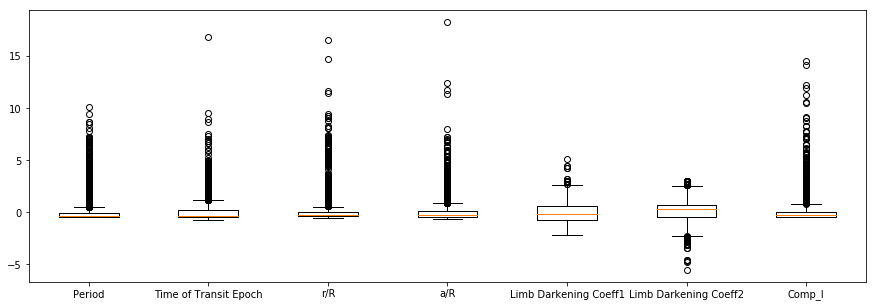

,Period,Time of Transit Epoch,r/R,a/R,Limb Darkening Coeff1,Limb Darkening Coeff2,Comp_I
count,4.317000e+03,4.317000e+03,4.317000e+03,4.317000e+03,4.317000e+03,4.317000e+03,4.317000e+03
mean,-1.221271e-15,1.357882e-16,-1.009565e-14,-1.107703e-15,-6.795666e-14,2.273342e-14,-1.759486e-15
std,1.000116e+00,1.000116e+00,1.000116e+00,1.000116e+00,1.000116e+00,1.000116e+00,1.000116e+00
min,-5.099800e-01,-7.408946e-01,-5.942639e-01,-6.773441e-01,-2.152509e+00,-5.511089e+00,-5.048422e-01
25%,-4.378714e-01,-4.702747e-01,-3.762669e-01,-4.956933e-01,-7.659136e-01,-5.118451e-01,-4.563009e-01
50%,-3.326228e-01,-3.798154e-01,-2.309356e-01,-3.150803e-01,-1.857072e-01,2.584311e-01,-3.009685e-01
75%,-5.882125e-02,1.718955e-01,-1.293854e-02,6.226389e-02,6.010135e-01,6.813278e-01,5.435417e-02
max,1.011195e+01,1.679164e+01,1.653061e+01,1.820062e+01,5.055819e+00,2.977053e+00,1.454880e+01


In [6]:
### boxplot de las variables..
aux_pl = df_meta_obj.drop(del_val, axis=1).columns
plt.figure(figsize=(15,5))
plt.boxplot(Ystd_transit)
plt.xticks(np.arange(Ystd_transit.shape[1])+1, aux_pl )
plt.show()
aux_df = pd.DataFrame(Ystd_transit)
aux_df.columns = aux_pl
aux_df.describe()

### Create dataset

#### Representación Global Folded ya está generada y guardada

In [6]:
!ls data/

LC_global_200T.npy   LC_globalA_300T.npy     Time_global_200T.npy
LC_global_300T.npy   LC_globalA_400T.npy     Time_global_300T.npy
LC_global_400T.npy   LC_globalA_500T.npy     Time_global_400T.npy
LC_global_500T.npy   LC_globalA_600T.npy     Time_global_500T.npy
LC_global_600T.npy   mask_transit_LC.npy     Time_global_600T.npy
LC_globalA_200T.npy  mask_transit_LC_v2.npy


In [7]:
T = 300 #elegir cantidad de puntos en curva de luz

In [8]:
X_fold_lc = np.load("data/LC_global_%dT.npy"%T)     # curva de luz
X_fold_lc_aug = np.load("data/LC_globalA_%dT.npy"%T)# curva de luz dada vuelta (como data augmented)
X_fold_time = np.load("data/Time_global_%dT.npy"%T) # delta de los tiempos en la representacion de la curva luz
X_fold_lc.shape

(8054, 300)

In [9]:
## NEW : set mask
X_fold_lc_tr = X_fold_lc[mask_transit]
X_fold_lc_aug_tr = X_fold_lc_aug[mask_transit]
X_fold_time_tr = X_fold_time[mask_transit]
N_trans, T = X_fold_lc_tr.shape
print(N_trans,T)

4317 300


In [10]:
## NEW : set mask
X_data_t = np.concatenate([X_fold_time_tr, X_fold_time_tr], axis=0)
X_data = np.concatenate([X_fold_lc_tr, X_fold_lc_aug_tr], axis=0)

if Ystd_transit.shape[0] != X_data.shape[0]:
    Ystd_transit = np.tile(Ystd_transit, (2,1)) #utilizando data augmentation
    Y_transit = np.tile(Y_transit, (2,1)) #utilizando data augmentation

X_data_t = np.expand_dims(X_data_t, axis=-1)
X_data = np.expand_dims(X_data, axis=-1)

print("X train shape: ",X_data.shape)
print("X train time shape: ",X_data_t.shape)
print("Y train shape: ",Ystd_transit.shape)

X train shape:  (8634, 300, 1)
X train time shape:  (8634, 300, 1)
Y train shape:  (8634, 7)


### Escalar

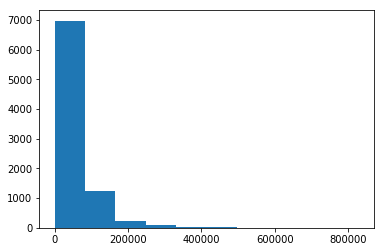

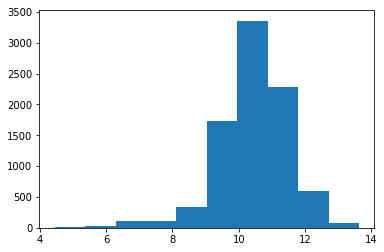

In [11]:
from sklearn.metrics import mean_squared_error

Sinv_data = 1/np.std(X_data, axis=1)

Sinv_mu = np.mean(Sinv_data)
Sinv_std = np.std(Sinv_data) 

plt.hist(Sinv_data)
plt.show()
plt.hist(np.log(Sinv_data))
plt.show()

### Keras models

In [12]:
from keras import backend as K
from keras.models import Sequential, Model
from keras.layers import *

from IPython.display import SVG
from keras.utils.vis_utils import model_to_dot

from autoencoder_utils import Recon_eval
Evaluate = Recon_eval()
def evaluate_reconst(x,xhat):
    print("----- EVALUANDO RECONSTRUCCION DE LA CURVA -----")
    res = Evaluate.get_res(x, xhat)
    plt.figure(figsize=(8,5))
    sns.distplot(res.flatten())
    plt.title("Distribucion de residuos promedio")
    plt.show()
    
    print("MSE      = ",Evaluate.MSE_LC(None,None, res))
    print("RMSE (+-)= ",Evaluate.RMSE_LC(None,None, res))
    print("MAE  (+-)= ",Evaluate.MAE_LC(None,None, res))
    
    print("--------- Smoothness ------------")
    xhat = np.squeeze(xhat)
    A = np.mean(np.apply_along_axis(Evaluate.autocorr_func, 1, xhat)[:,1])
    print("AutoCorr lag-one = ",A)
    M = np.mean(np.apply_along_axis(Evaluate.mean_diff, 1, xhat))
    print("Diff MEAN = ",M)
    S = np.mean(np.apply_along_axis(Evaluate.std_diff, 1, xhat))
    print("Diff STD = ",S)
    print("--------- Smoothness ------------")

def plot_n_lc(real_lc, decoded_lc, n = 10, s=None):
    for _ in range(n):
        n_sampled = np.random.randint(0, real_lc.shape[0])
        
        if s !=None:
            print("Real scale = %f\nPred scale = %f"%(s[0][n_sampled], s[1][n_sampled] ))
        f, (ax1, ax2) = plt.subplots(1, 2, sharex=True,figsize= (15,5))
        ax1.plot(real_lc[n_sampled], 'b.-')
        ax1.set_title("Real")
        ax2.plot(decoded_lc[n_sampled], 'b.-')
        ax2.set_title("Reconstructed")
        plt.show()  

        plt.figure(figsize=(15,5))
        plt.plot(real_lc[n_sampled], 'bo-', label="Real")
        plt.plot(decoded_lc[n_sampled], 'g*-', label="Reconstructed")
        plt.title("Over data "+str(n_sampled))
        plt.legend()
        plt.show()
        print("----------------------------------------------------------------")

In [13]:
l = 0.001

batch_size = 128

latent_dim = 32

_, T, channels = X_data.shape
D_dim = Ystd_transit.shape[1] #cantidad de valores en representacion condicional

In [18]:
from autoencoder_utils import define_samp_model

def KL_loss(z_mean,z_log_var):
    #the mean and log-var of the latent distribution
    def KL(y_true, y_pred):
        return - 0.5 * K.sum(1 + z_log_var - K.square(z_mean) - K.exp(z_log_var), axis=-1)
    return KL

def MSLE_scale_loss(sinv_true, sinv_hat): #Mean squared logarithm error
    #the true and predicted value of the scale^-1 of the data = 1/std
    def MSLE_scale(y_true, y_pred):
        mse_SCALE = K.mean(K.square( K.log(sinv_true+1) - K.log(sinv_hat+1) ), axis=-1)
        return mse_SCALE / (Sinvlog_std)**2 #divide in order to MSLE does not have scale
    return MSLE_scale

def MSE_scale_loss(sinv_true, sinv_hat): #Mean squared logarithm error
    #the true and predicted value of the scale^-1 of the data = 1/std
    def MSE_scale(y_true, y_pred):
        mse_SCALE = K.mean(K.square(sinv_true - sinv_hat), axis=-1)
        return mse_SCALE / (Sinv_mu)**2 #divide in order to MSLE does not have scale
    return MSE_scale

def SMSE_loss(sinv):
    #sinv is the inverse of scale of the data = 1/std
    def SMSE(y_true, y_pred):
        mse_LC = K.mean( K.square( y_true - y_pred ), axis=1) #on time axis..    
        mse_LC = K.flatten(mse_LC)
        weights = K.square(sinv)[:,0]
        return mse_LC * weights #both values has to be on same shape
    return SMSE

def Multiply_layer(args):
    x,s = args
    return x*s[:,None,:]
def Divide_layer(args):
    x,s = args
    s +=  K.epsilon()
    return x/s[:,None,:]

def Norm_L(x,mu,std):
    x = K.log(x+1) #para normalizar un poco valores gigantes
    return (x - mu)/std

def RevertNorm_L(x,mu,std):
    return K.exp(std*x + mu)-1
    
Sinv_mu = np.mean(Sinv_data)
Sinv_std = np.std(Sinv_data)

Sinvlog_mu = np.mean(np.log(Sinv_data+1))
Sinvlog_std = np.std(np.log(Sinv_data+1))

Ylog_mu = np.mean(np.log(Y_values+1))
Ylog_std = np.std(np.log(Y_values+1))

Sinvlog_mu

10.450747418519128

# Conditional VAE 
* https://github.com/nnormandin/Conditional_VAE
* https://wiseodd.github.io/techblog/2016/12/17/conditional-vae/

In [38]:
##### INPUTS ENCODER ######
x_lc = Input(shape = (T, channels) , name="LC_inp")
x_t = Input(shape = (T, channels) , name ="T_inp")
sinv_lc = Input(shape= (1,), name="invscale_inp") #para pesar loss
y_lc = Input(shape = (D_dim,) , name ="Meta_inp")

x_lc_s = Lambda(Multiply_layer, name="Multiply")([x_lc, sinv_lc]) #quitar escala del dato (o escalar a una version normal)

#como es recurrente es necesario repetir la metadata en cada instante de tiempo.. 
#y_rep = Dense(10, activation='tanh')(y_lc) 
y_rep = RepeatVector(T, name="Meta_rep")(y_lc)

##### CONCATENATE TIME + LC -> CODIFY ######
x = Concatenate(axis=-1)([x_t, x_lc_s, y_rep]) #has to be concatenate on axis -1
f1 = Bidirectional(CuDNNGRU(64, return_sequences=True))(x) #bidirectional
f1 = Bidirectional(CuDNNGRU(64, return_sequences=False))(f1) #bidirectional

##### CODIFY SCALE ######
f1_s = Lambda(Norm_L, arguments={'mu':Sinvlog_mu,'std':Sinvlog_std}, name="norm")(sinv_lc)
f1_s = Dense(1, activation='tanh')(f1_s) #o tanh

##### CONCATENATE CODIFY-LC + SCALE -> GET THE LATENT VARIABLE ######
f1 = Concatenate(axis=-1)([f1, f1_s]) #NEW: agregar escala a codificar -- y si agrego y_rep aca... con dense
z_mean = Dense(latent_dim,activation='linear')(f1)
z_log_var = Dense(latent_dim,activation='linear')(f1)
encoder = Model([x_t, x_lc, sinv_lc, y_lc], [z_mean,z_log_var], name="encoder")
samp_model = define_samp_model(latent_dim) #model to sample

##### INPUTS DECODER ######
decoder_input = Input(shape=(latent_dim,), name="latent_inp")
decoder_inp_rep = RepeatVector(T, name="Enc_rep")(decoder_input)

##### CONCATENATE TIME + LATENT VARIABLE + CONDITIONAL -> DECODIFY LIGHT CURVE ######
decode = Concatenate(axis=-1)([x_t, decoder_inp_rep, y_rep]) #add time and metadata to decode
decode = Bidirectional(CuDNNGRU(64, return_sequences=True))(decode) #bidirectional
#decode = Bidirectional(GRU(64, return_sequences=True))(decode) #bidirectional
decode = Bidirectional(CuDNNGRU(64, return_sequences=True))(decode) #bidirectional

##### RECONSTRCT SCALE ######
s_out = Dense(1, activation='tanh')(decoder_input)
s_out = Dense(1, activation='linear', name="reconsnorm")(s_out) #NEW: aprende s 
s_out = Lambda(RevertNorm_L, arguments={'mu':Sinvlog_mu,'std':Sinvlog_std},name="revertnorm")(s_out) #NEW: volver a escala normal 
sinv_hat = Model(decoder_input, s_out)( samp_model(encoder([x_t, x_lc, sinv_lc, y_lc]))) #para verificar reconstruccion
Sinv_model = Model([x_t, x_lc, sinv_lc, y_lc], sinv_hat)

#####  RECONSTRUCT LIGHT CURVE BY SCALE  ######
decode = TimeDistributed(Dense(1, activation='linear'))(decode)
decode = Lambda(Divide_layer, name="Divide")([decode, s_out]) #NEW: 
generator = Model([x_t, decoder_input, y_lc], decode, name="generator")

# instantiate VAE model
out = generator([x_t, samp_model(encoder([x_t, x_lc, sinv_lc, y_lc])), y_lc ])
Cvae = Model([x_t, x_lc, sinv_lc, y_lc], out)

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
T_inp (InputLayer)              (None, 300, 1)       0                                            
__________________________________________________________________________________________________
LC_inp (InputLayer)             (None, 300, 1)       0                                            
__________________________________________________________________________________________________
invscale_inp (InputLayer)       (None, 1)            0                                            
__________________________________________________________________________________________________
Meta_inp (InputLayer)           (None, 7)            0                                            
__________________________________________________________________________________________________
encoder (M

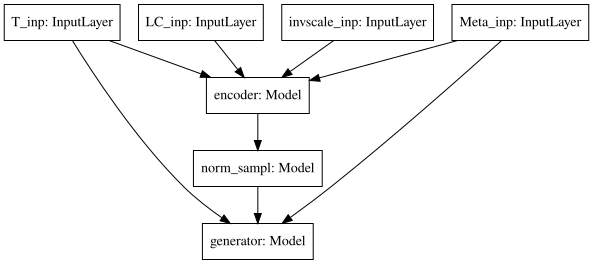

In [32]:
#define loss functions over model components
smse_LC = SMSE_loss(sinv_lc)
mse_S = MSLE_scale_loss(sinv_lc, sinv_hat) 
kl_loss = KL_loss(z_mean, z_log_var)

def Wvae_loss(y_true, y_pred):    
    return smse_LC(y_true, y_pred) + l*kl_loss(y_true, y_pred) + 0.1*mse_S(y_true, y_pred)

Cvae.compile(optimizer='adam', loss=Wvae_loss, metrics = [smse_LC,kl_loss,mse_S])
Cvae.summary()

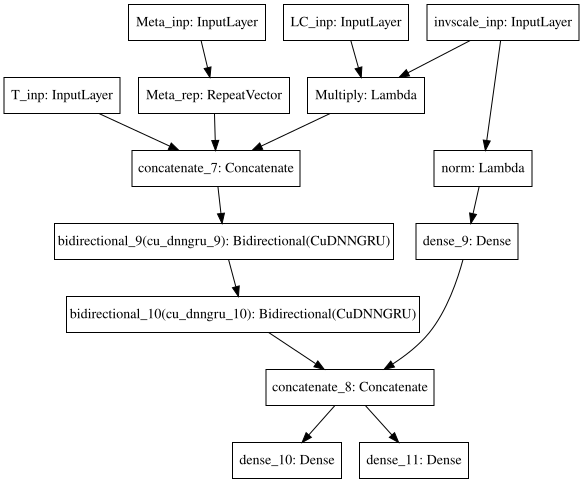

In [33]:
SVG(model_to_dot(Cvae.get_layer("encoder")).create(prog='dot', format='svg'))

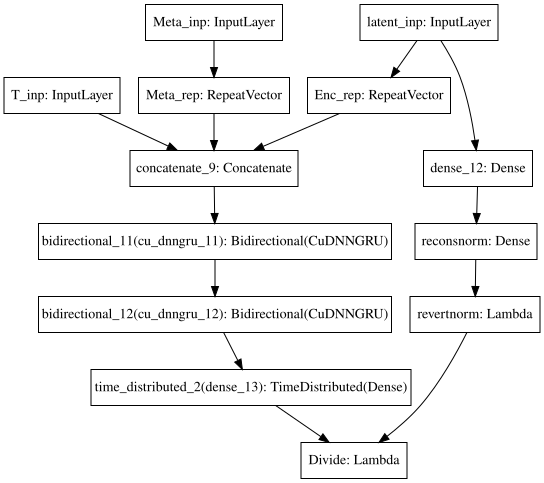

In [34]:
SVG(model_to_dot(Cvae.get_layer("generator")).create(prog='dot', format='svg'))

seria necesario hacer un esquema o dibujo para entender.. la metadata se repite por cada instante de tiempo para hacer las codificaciones y reconstrucciones necesarias.. (le da la información de la metadata a cada instante..)

### Despues GRU, con Dense, sin NormL

In [ ]:
##### INPUTS ENCODER ######
x_lc = Input(shape = (T, channels) , name="LC_inp")
x_t = Input(shape = (T, channels) , name ="T_inp")
sinv_lc = Input(shape= (1,), name="invscale_inp") #para pesar loss
y_lc = Input(shape = (D_dim,) , name ="Meta_inp")

x_lc_s = Lambda(Multiply_layer, name="Multiply")([x_lc, sinv_lc]) #quitar escala del dato (o escalar a una version normal)

##### CONCATENATE TIME + LC -> CODIFY ######
x = Concatenate(axis=-1)([x_t, x_lc_s]) #has to be concatenate on axis -1
f1 = Bidirectional(CuDNNGRU(64, return_sequences=True))(x) #bidirectional
f1 = Bidirectional(CuDNNGRU(64, return_sequences=False))(f1) #bidirectional

##### CODIFY SCALE and METADATA ######
f1_s = Lambda(Norm_L, arguments={'mu':Sinvlog_mu,'std':Sinvlog_std}, name="norm")(sinv_lc)
f1_s = Dense(1, activation='tanh')(f1_s)
y_rep = Dense(10, activation='tanh')(y_lc) 

##### CONCATENATE CODIFY-LC + SCALE + METADATA -> GET THE LATENT VARIABLE ######
f1 = Concatenate(axis=-1)([f1, f1_s, y_rep]) 
z_mean = Dense(latent_dim,activation='linear')(f1)
z_log_var = Dense(latent_dim,activation='linear')(f1)
encoder = Model([x_t, x_lc, sinv_lc, y_lc], [z_mean,z_log_var], name="encoder")
samp_model = define_samp_model(latent_dim) #model to sample

##### INPUTS DECODER ######
decoder_input = Input(shape=(latent_dim,), name="latent_inp")
decoder_inp_rep = RepeatVector(T, name="Enc_rep")(decoder_input)

##### CONCATENATE TIME + LATENT VARIABLE + CONDITIONAL -> DECODIFY LIGHT CURVE ######
y_rept = RepeatVector(T, name="Meta_rep")(y_rep)
decode = Concatenate(axis=-1)([x_t, decoder_inp_rep, y_rept]) #add time and metadata to decode
decode = Bidirectional(CuDNNGRU(64, return_sequences=True))(decode) #bidirectional
#decode = Bidirectional(GRU(64, return_sequences=True))(decode) #bidirectional
decode = Bidirectional(CuDNNGRU(64, return_sequences=True))(decode) #bidirectional

##### RECONSTRCT SCALE ######
s_out = Dense(1, activation='tanh')(decoder_input)
s_out = Dense(1, activation='linear', name="reconsnorm")(s_out) #
s_out = Lambda(RevertNorm_L, arguments={'mu':Sinvlog_mu,'std':Sinvlog_std},name="revertnorm")(s_out) #NEW: volver a escala normal 
sinv_hat = Model(decoder_input, s_out)( samp_model(encoder([x_t, x_lc, sinv_lc, y_lc]))) #para verificar reconstruccion
Sinv_model = Model([x_t, x_lc, sinv_lc, y_lc], sinv_hat)

#####  RECONSTRUCT LIGHT CURVE BY SCALE  ######
decode = TimeDistributed(Dense(1, activation='linear'))(decode)
decode = Lambda(Divide_layer, name="Divide")([decode, s_out]) #NEW: 
generator = Model([x_t, decoder_input, y_lc], decode, name="generator")

# instantiate VAE model
out = generator([x_t, samp_model(encoder([x_t, x_lc, sinv_lc, y_lc])), y_lc ])
Cvae = Model([x_t, x_lc, sinv_lc, y_lc], out)

#define loss functions over model components
smse_LC = SMSE_loss(sinv_lc)
mse_S = MSLE_scale_loss(sinv_lc, sinv_hat) 
kl_loss = KL_loss(z_mean, z_log_var)

def Wvae_loss(y_true, y_pred):    
    return smse_LC(y_true, y_pred) + l*kl_loss(y_true, y_pred) + 0.1*mse_S(y_true, y_pred)
Cvae.compile(optimizer='adam', loss=Wvae_loss, metrics = [smse_LC,kl_loss,mse_S])

Cvae.get_layer("encoder").load_weights("./models/C-VAEscale_MA2_%dT_%dD_%de_E.h5"%(T,latent_dim,400))
Cvae.get_layer("generator").load_weights("./models/C-VAEscale_MA2_%dT_%dD_%de_D.h5"%(T,latent_dim,400))

SVG(model_to_dot(Cvae.get_layer("encoder")).create(prog='dot', format='svg'))

----- EVALUANDO RECONSTRUCCION DE LA CURVA -----


/home/casapanshop/anaconda2/envs/py3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


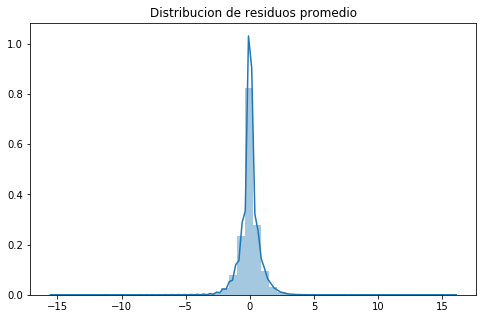

MSE      =  0.6238055572344736
RMSE (+-)=  0.7604291772880191
MAE  (+-)=  0.4945072268650123
--------- Smoothness ------------
AutoCorr lag-one =  0.6363892719122666
Diff MEAN =  0.06164052649257935
Diff STD =  0.36134808331338847
--------- Smoothness ------------
MSE de escala escalado=  0.061387690070402366


In [16]:
X_data_hat = Cvae.predict([X_data_t[:N_trans], X_data[:N_trans], Sinv_data[:N_trans], Ystd_transit[:N_trans]], batch_size=512)
evaluate_reconst(X_data[:N_trans]*Sinv_data[:N_trans,None,:], X_data_hat*Sinv_data[:N_trans,None,:])

#una vez verificado esto eliminar este modelo...
Sinv_data_hat = Sinv_model.predict([X_data_t[:N_trans],X_data[:N_trans], Sinv_data[:N_trans],Ystd_transit[:N_trans]], batch_size=512)
print("MSE de escala escalado= ",mean_squared_error((Sinv_data[:N_trans]-Sinv_mu)/Sinv_std, (Sinv_data_hat-Sinv_mu)/Sinv_std,1 ))

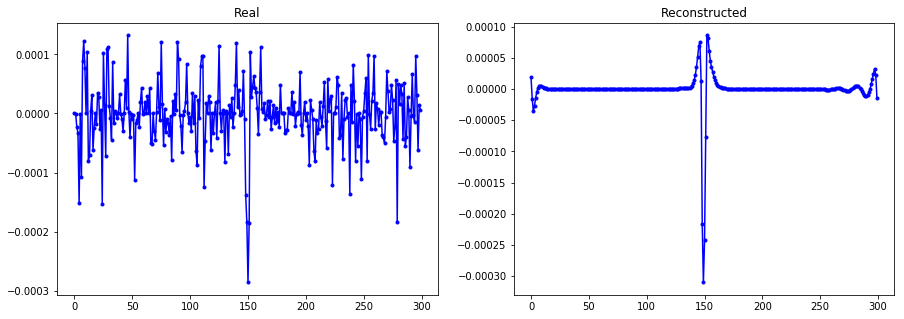

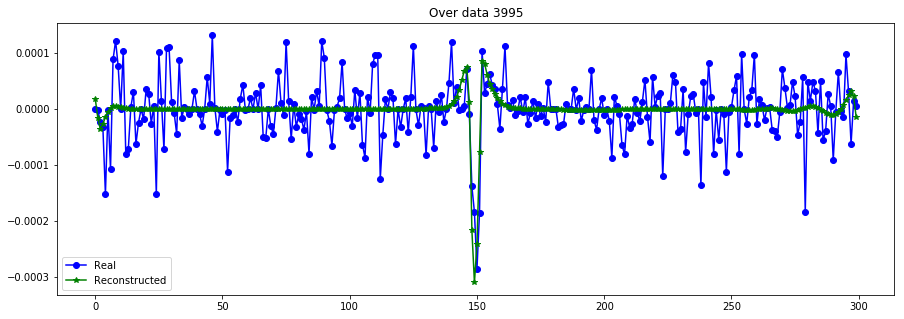

----------------------------------------------------------------


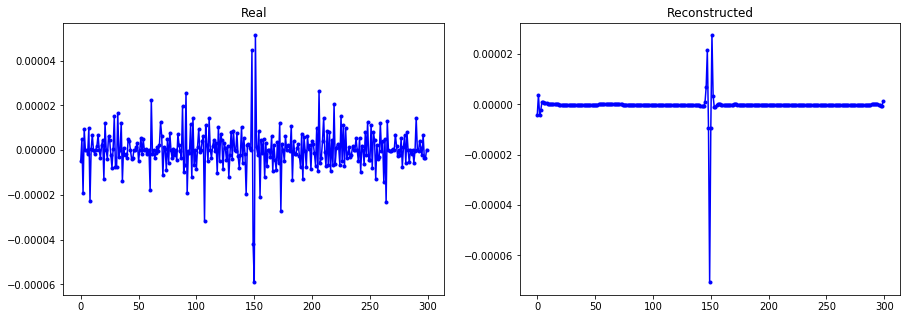

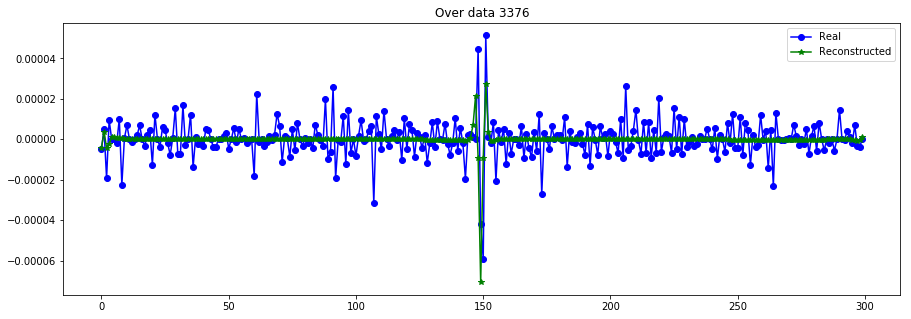

----------------------------------------------------------------


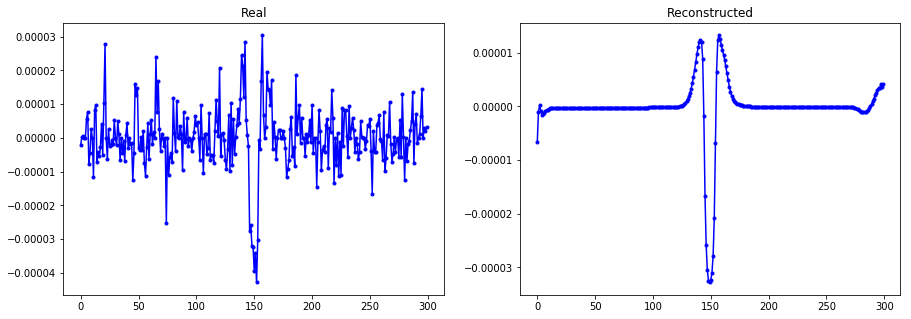

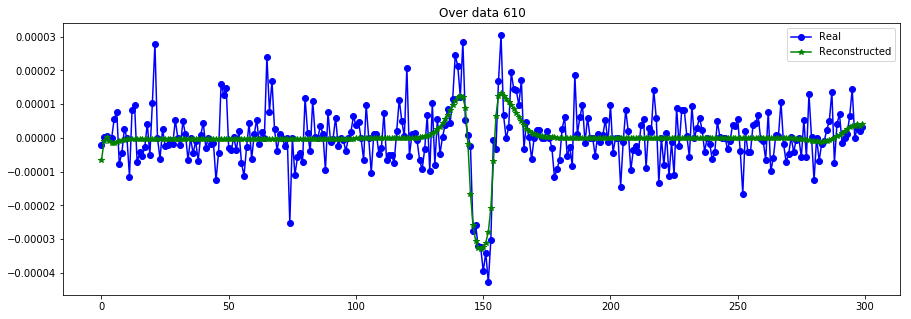

----------------------------------------------------------------


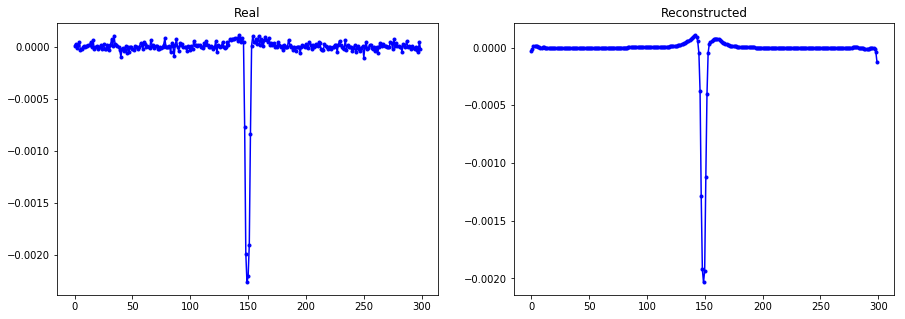

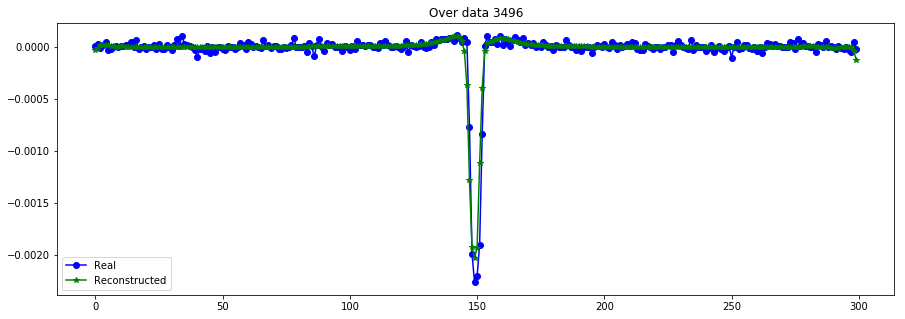

----------------------------------------------------------------


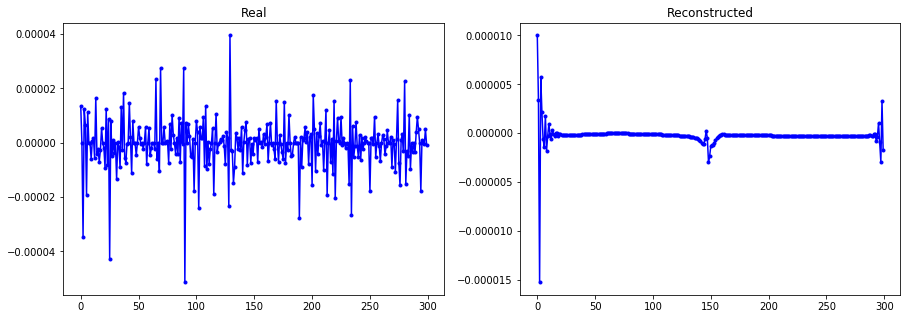

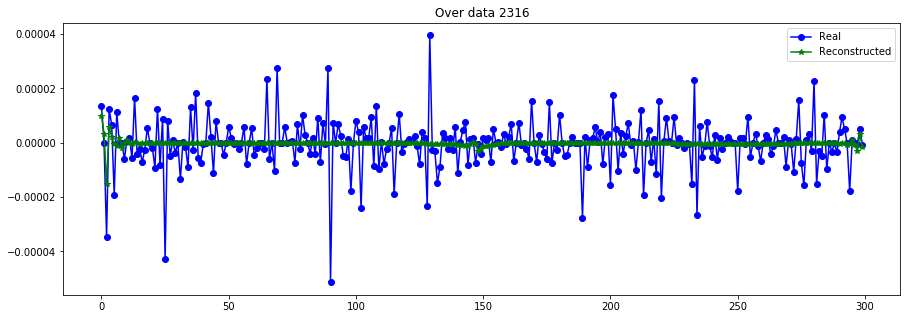

----------------------------------------------------------------


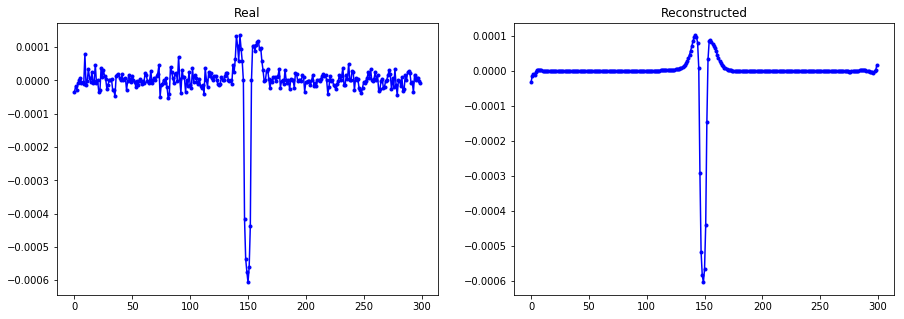

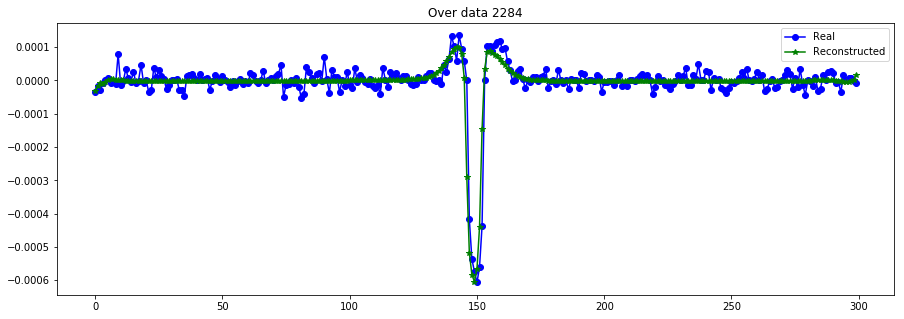

----------------------------------------------------------------


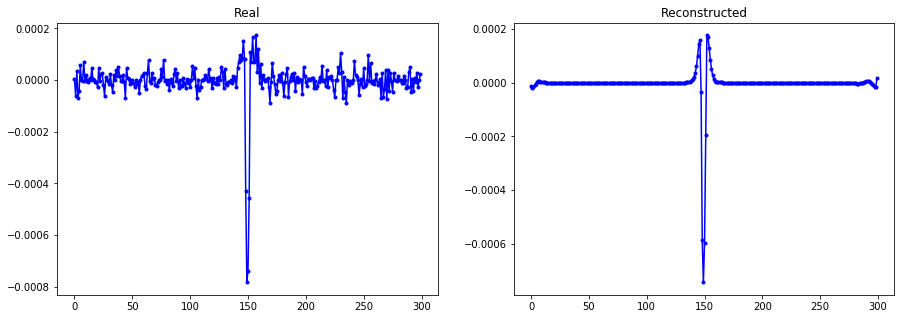

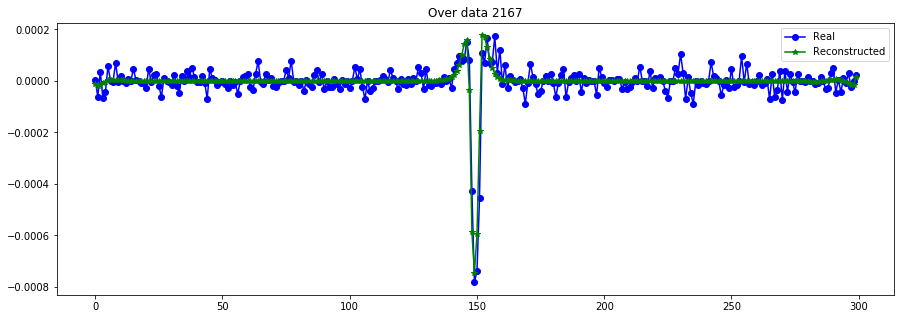

----------------------------------------------------------------


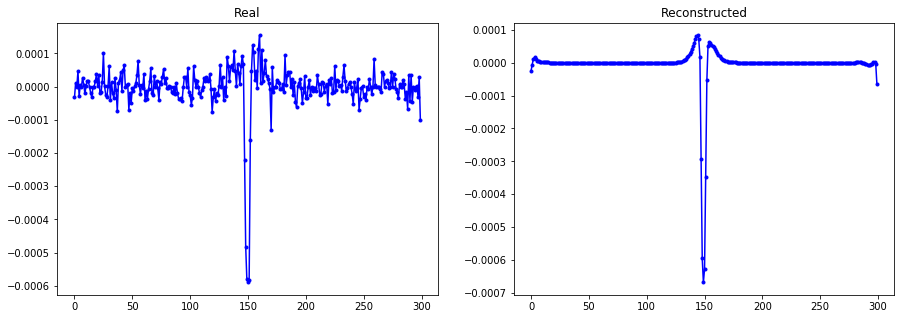

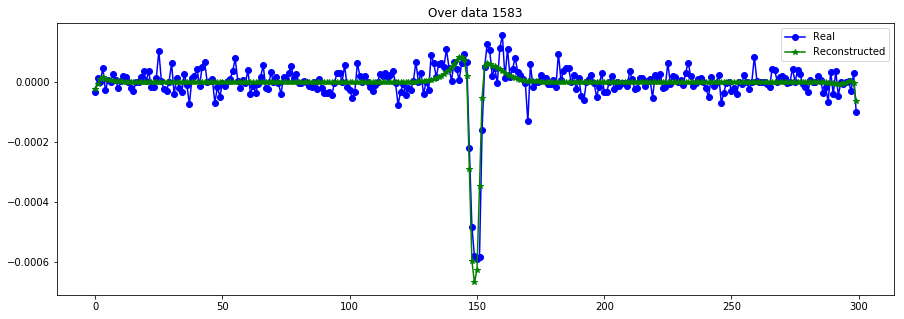

----------------------------------------------------------------


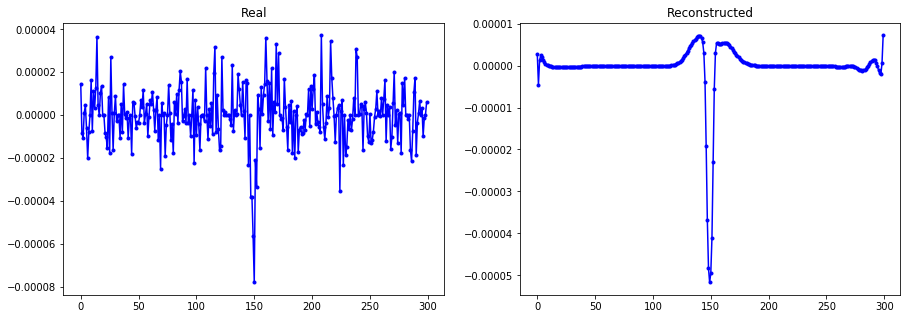

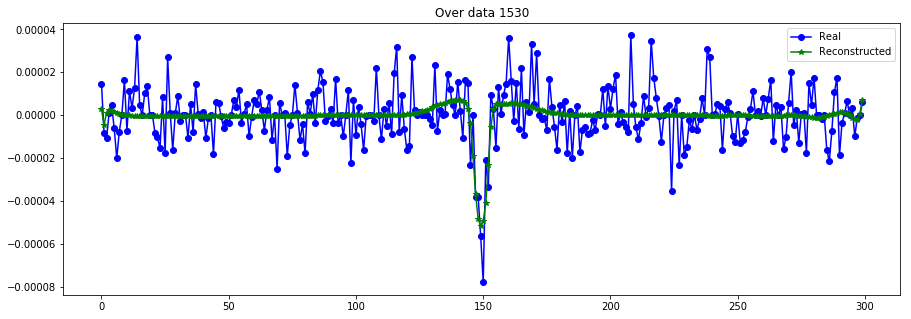

----------------------------------------------------------------


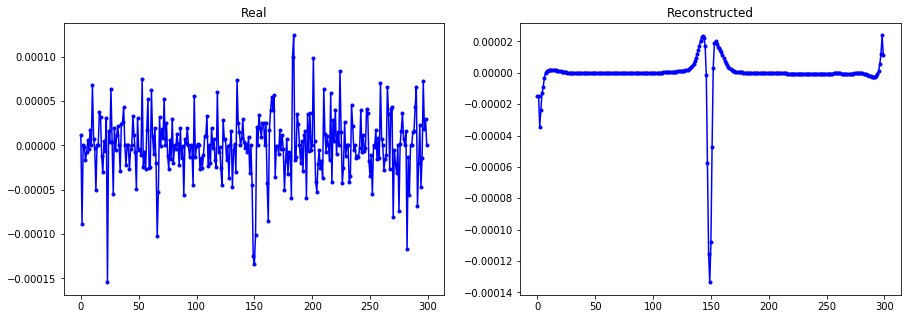

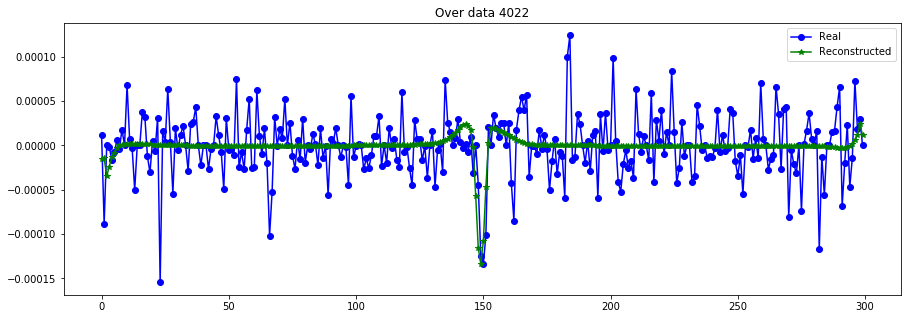

----------------------------------------------------------------


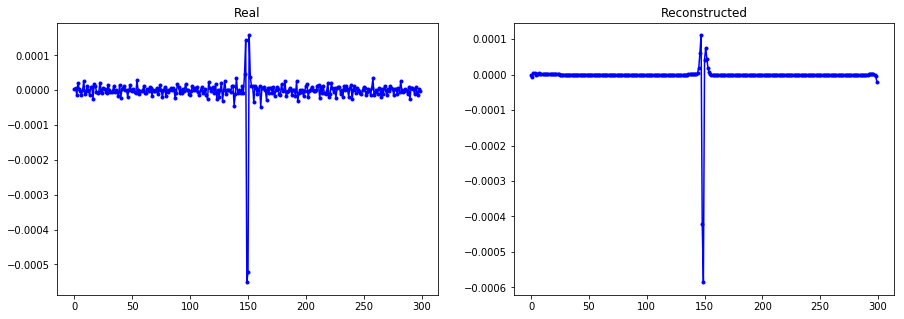

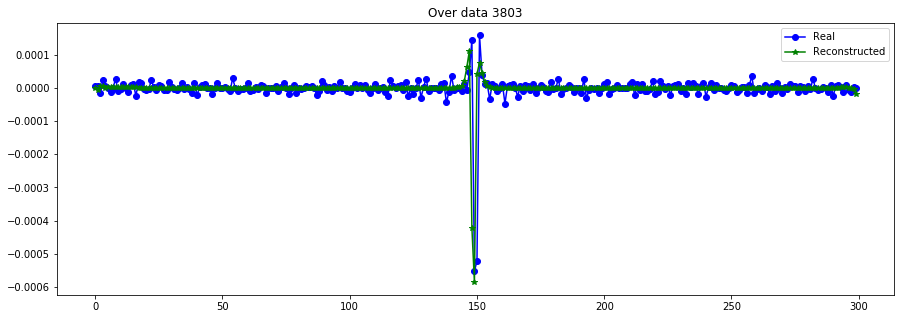

----------------------------------------------------------------


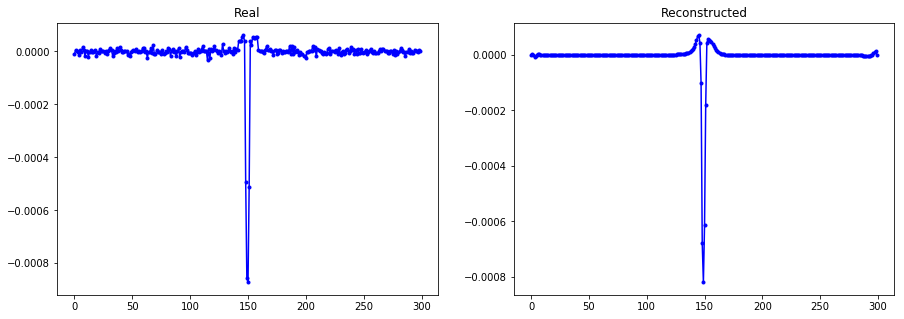

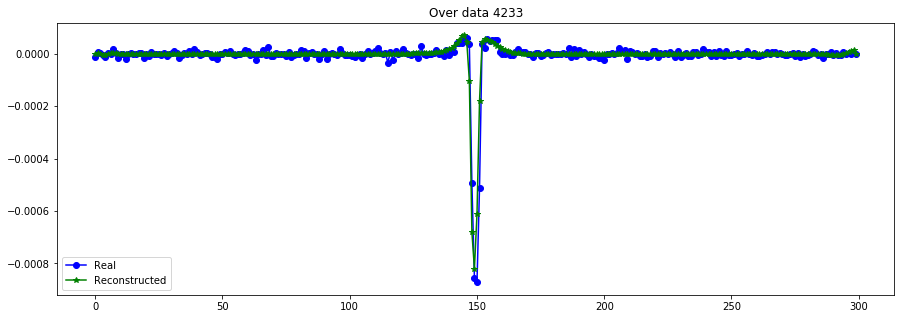

----------------------------------------------------------------


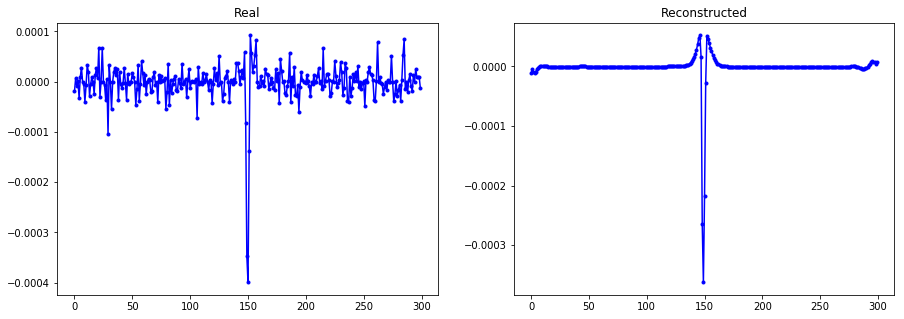

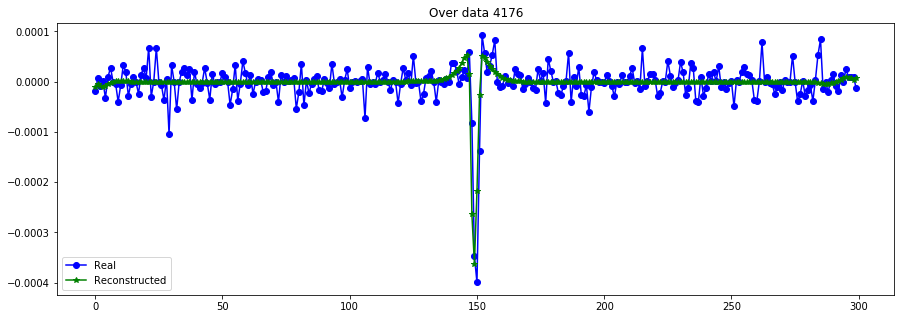

----------------------------------------------------------------


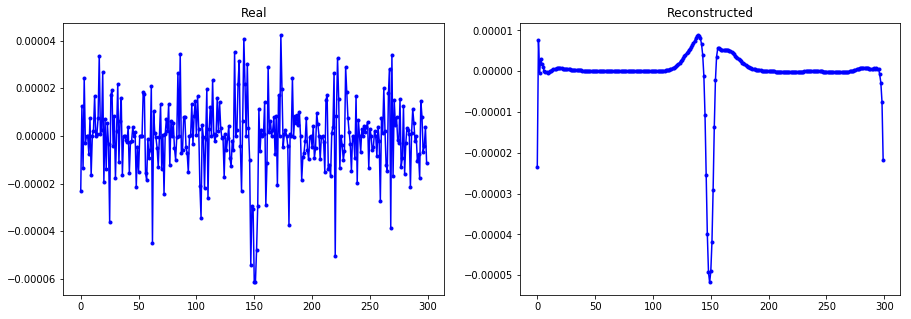

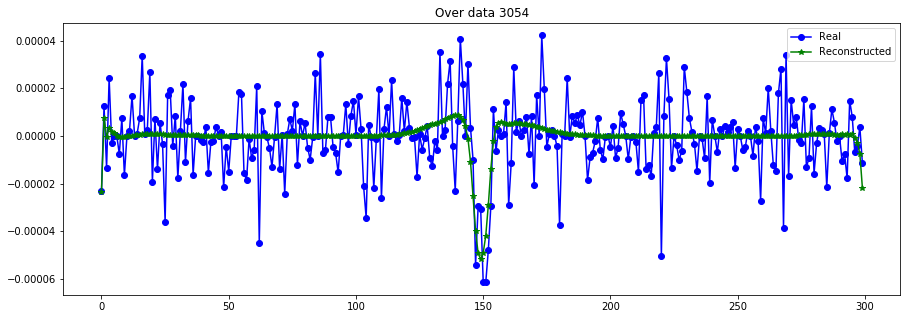

----------------------------------------------------------------


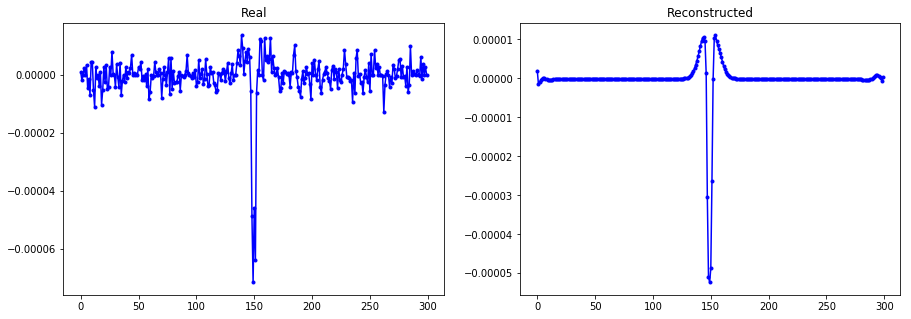

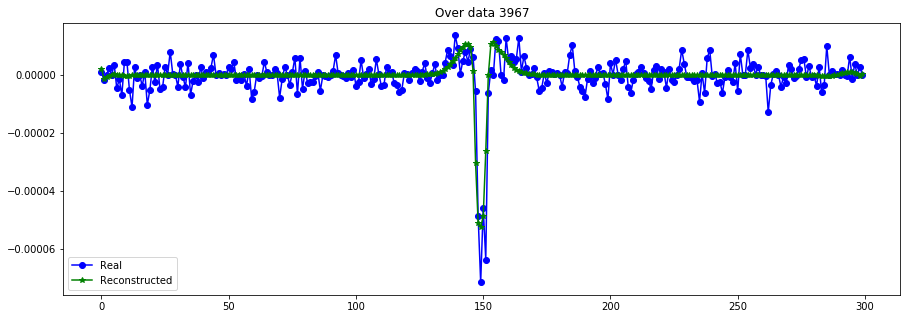

----------------------------------------------------------------


In [17]:
plot_n_lc(X_data[:N_trans,:,0], X_data_hat, n= 15)

### Antes GRU, con Dense, sin NormL

In [ ]:
##### INPUTS ENCODER ######
x_lc = Input(shape = (T, channels) , name="LC_inp")
x_t = Input(shape = (T, channels) , name ="T_inp")
sinv_lc = Input(shape= (1,), name="invscale_inp") #para pesar loss
y_lc = Input(shape = (D_dim,) , name ="Meta_inp")

x_lc_s = Lambda(Multiply_layer, name="Multiply")([x_lc, sinv_lc]) #quitar escala del dato (o escalar a una version normal)

##### CODIFY SCALE and METADATA  ######
f1_s = Lambda(Norm_L, arguments={'mu':Sinvlog_mu,'std':Sinvlog_std}, name="norm")(sinv_lc)
f1_s = Dense(1, activation='tanh')(f1_s) #o tanh
f1_s = RepeatVector(T, name="scale_rep")(f1_s)
y_rep = Dense(10, activation='tanh')(y_lc) 
y_rept = RepeatVector(T, name="Meta_rep")(y_rep)

##### CONCATENATE TIME + LC + META + SCALE -> CODIFY ######
x = Concatenate(axis=-1)([x_t, x_lc_s, y_rept, f1_s]) #has to be concatenate on axis -1
f1 = Bidirectional(CuDNNGRU(64, return_sequences=True))(x) #bidirectional
f1 = Bidirectional(CuDNNGRU(64, return_sequences=False))(f1) #bidirectional

##### GET THE LATENT VARIABLE ######
z_mean = Dense(latent_dim,activation='linear')(f1)
z_log_var = Dense(latent_dim,activation='linear')(f1)
encoder = Model([x_t, x_lc, sinv_lc, y_lc], [z_mean,z_log_var], name="encoder")
samp_model = define_samp_model(latent_dim) #model to sample

##### INPUTS DECODER ######
decoder_input = Input(shape=(latent_dim,), name="latent_inp")
decoder_inp_rep = RepeatVector(T, name="Enc_rep")(decoder_input)

##### CONCATENATE TIME + LATENT VARIABLE + CONDITIONAL -> DECODIFY LIGHT CURVE ######
decode = Concatenate(axis=-1)([x_t, decoder_inp_rep, y_rept]) #add time and metadata to decode
decode = Bidirectional(CuDNNGRU(64, return_sequences=True))(decode) #bidirectional
#decode = Bidirectional(GRU(64, return_sequences=True))(decode) #bidirectional
decode = Bidirectional(CuDNNGRU(64, return_sequences=True))(decode) #bidirectional

##### CONCATENATE LATENT VARIABLE + CONDITIONAL -> RECONSTRCT SCALE ######
decoder_inp_scal = Concatenate(axis=-1)([decoder_input, y_rep]) #add metadata to decode
s_out = Dense(1, activation='tanh')(decoder_inp_scal)
s_out = Dense(1, activation='linear', name="reconsnorm")(s_out) #NEW: aprende s 
s_out = Lambda(RevertNorm_L, arguments={'mu':Sinvlog_mu,'std':Sinvlog_std},name="revertnorm")(s_out) #NEW: volver a escala normal 
sinv_hat = Model([decoder_input,y_lc], s_out)([samp_model(encoder([x_t, x_lc, sinv_lc, y_lc])),y_lc]) #para verificar reconstruccion
Sinv_model = Model([x_t, x_lc, sinv_lc, y_lc], sinv_hat)

#####  RECONSTRUCT LIGHT CURVE BY SCALE  ######
decode = TimeDistributed(Dense(1, activation='linear'))(decode)
decode = Lambda(Divide_layer, name="Divide")([decode, s_out]) #NEW: 
generator = Model([x_t, decoder_input, y_lc], decode, name="generator")

# instantiate VAE model
out = generator([x_t, samp_model(encoder([x_t, x_lc, sinv_lc, y_lc])), y_lc ])
Cvae = Model([x_t, x_lc, sinv_lc, y_lc], out)

#define loss functions over model components
smse_LC = SMSE_loss(sinv_lc)
mse_S = MSLE_scale_loss(sinv_lc, sinv_hat) 
kl_loss = KL_loss(z_mean, z_log_var)

def Wvae_loss(y_true, y_pred):    
    return smse_LC(y_true, y_pred) + l*kl_loss(y_true, y_pred) + 0.1*mse_S(y_true, y_pred)
Cvae.compile(optimizer='adam', loss=Wvae_loss, metrics = [smse_LC,kl_loss,mse_S])

Cvae.get_layer("encoder").load_weights("./models/C-VAEscale_MA4_%dT_%dD_%de_E.h5"%(T,latent_dim,400))
Cvae.get_layer("generator").load_weights("./models/C-VAEscale_MA4_%dT_%dD_%de_D.h5"%(T,latent_dim,400))

SVG(model_to_dot(Cvae.get_layer("encoder")).create(prog='dot', format='svg'))

In [ ]:
Cvae.fit([X_data_t, X_data, Sinv_data, Ystd_transit], X_data, epochs=400, batch_size=batch_size)

In [ ]:
X_data_hat = Cvae.predict([X_data_t[:N_trans], X_data[:N_trans], Sinv_data[:N_trans], Ystd_transit[:N_trans]], batch_size=512)
evaluate_reconst(X_data[:N_trans]*Sinv_data[:N_trans,None,:], X_data_hat*Sinv_data[:N_trans,None,:])

#una vez verificado esto eliminar este modelo...
Sinv_data_hat = Sinv_model.predict([X_data_t[:N_trans],X_data[:N_trans], Sinv_data[:N_trans],Ystd_transit[:N_trans]], batch_size=512)
print("MSE de escala escalado= ",mean_squared_error((Sinv_data[:N_trans]-Sinv_mu)/Sinv_std, (Sinv_data_hat-Sinv_mu)/Sinv_std,1 ))

In [ ]:
plot_n_lc(X_data[:N_trans,:,0], X_data_hat, n= 15)

In [29]:
#Cvae.save_weights("./models/%dT_%dD_%de_C-VAE.h5"%(T,latent_dim,300))
Cvae.get_layer("encoder").save_weights("./models/C-VAEscale_MA4_%dT_%dD_%de_E.h5"%(T,latent_dim,400))
Cvae.get_layer("generator").save_weights("./models/C-VAEscale_MA4_%dT_%dD_%de_D.h5"%(T,latent_dim,400))

### Despues GRU, con Dense, con NormL
Dense de escala 2 valores?

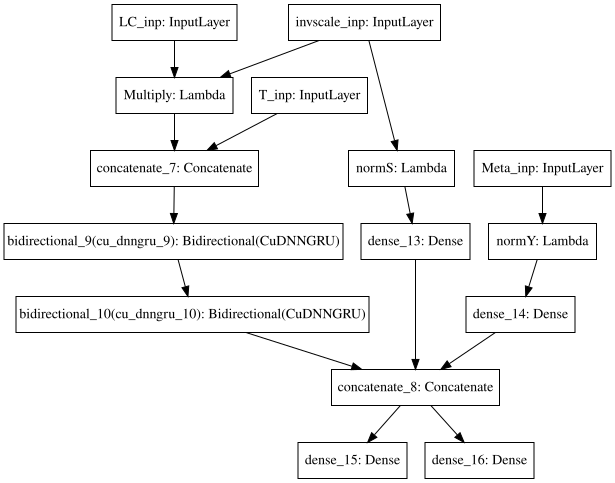

In [26]:
##### INPUTS ENCODER ######
x_lc = Input(shape = (T, channels) , name="LC_inp")
x_t = Input(shape = (T, channels) , name ="T_inp")
sinv_lc = Input(shape= (1,), name="invscale_inp") #para pesar loss
y_lc = Input(shape = (D_dim,) , name ="Meta_inp")

x_lc_s = Lambda(Multiply_layer, name="Multiply")([x_lc, sinv_lc]) #quitar escala del dato (o escalar a una version normal)

##### CONCATENATE TIME + LC -> CODIFY ######
x = Concatenate(axis=-1)([x_t, x_lc_s]) #has to be concatenate on axis -1
f1 = Bidirectional(CuDNNGRU(64, return_sequences=True))(x) #bidirectional
f1 = Bidirectional(CuDNNGRU(64, return_sequences=False))(f1) #bidirectional

##### CODIFY SCALE and METADATA ######
f1_s = Lambda(Norm_L, arguments={'mu':Sinvlog_mu,'std':Sinvlog_std}, name="normS")(sinv_lc)
f1_s = Dense(1, activation='tanh')(f1_s)
y_rep = Lambda(Norm_L, arguments={'mu':Ylog_mu,'std':Ylog_std}, name="normY")(y_lc)
y_rep = Dense(10, activation='tanh')(y_rep) 

##### CONCATENATE CODIFY-LC + SCALE + METADATA -> GET THE LATENT VARIABLE ######
f1 = Concatenate(axis=-1)([f1, f1_s, y_rep]) 
z_mean = Dense(latent_dim,activation='linear')(f1)
z_log_var = Dense(latent_dim,activation='linear')(f1)
encoder = Model([x_t, x_lc, sinv_lc, y_lc], [z_mean,z_log_var], name="encoder")
samp_model = define_samp_model(latent_dim) #model to sample

##### INPUTS DECODER ######
decoder_input = Input(shape=(latent_dim,), name="latent_inp")
decoder_inp_rep = RepeatVector(T, name="Enc_rep")(decoder_input)

##### CONCATENATE TIME + LATENT VARIABLE + CONDITIONAL -> DECODIFY LIGHT CURVE ######
y_rept = RepeatVector(T, name="Meta_rep")(y_rep)
decode = Concatenate(axis=-1)([x_t, decoder_inp_rep, y_rept]) #add time and metadata to decode
decode = Bidirectional(CuDNNGRU(64, return_sequences=True))(decode) #bidirectional
#decode = Bidirectional(GRU(64, return_sequences=True))(decode) #bidirectional
decode = Bidirectional(CuDNNGRU(64, return_sequences=True))(decode) #bidirectional

##### CONCATENATE LATENT VARIABLE + CONDITIONAL -> RECONSTRCT SCALE ######
#decoder_inp_scal = Concatenate(axis=-1)([decoder_input, y_rep]) #add metadata to decode
decoder_inp_scal = y_rep 

s_out = Dense(1, activation='tanh')(decoder_inp_scal)
s_out = Dense(1, activation='linear', name="reconsnorm")(s_out) #
s_out = Lambda(RevertNorm_L, arguments={'mu':Sinvlog_mu,'std':Sinvlog_std},name="revertnorm")(s_out) #NEW: volver a escala normal 
sinv_hat = Model([decoder_input, y_lc], s_out)([samp_model(encoder([x_t, x_lc, sinv_lc, y_lc])), y_lc]) #para verificar reconstruccion
Sinv_model = Model([x_t, x_lc, sinv_lc, y_lc], sinv_hat)

#####  RECONSTRUCT LIGHT CURVE BY SCALE  ######
decode = TimeDistributed(Dense(1, activation='linear'))(decode)
decode = Lambda(Divide_layer, name="Divide")([decode, s_out]) #NEW: 
generator = Model([x_t, decoder_input, y_lc], decode, name="generator")

# instantiate VAE model
out = generator([x_t, samp_model(encoder([x_t, x_lc, sinv_lc, y_lc])), y_lc ])
Cvae = Model([x_t, x_lc, sinv_lc, y_lc], out)

#define loss functions over model components
smse_LC = SMSE_loss(sinv_lc)
mse_S = MSE_scale_loss(sinv_lc, sinv_hat) 
kl_loss = KL_loss(z_mean, z_log_var)

def Wvae_loss(y_true, y_pred):    
    return smse_LC(y_true, y_pred) + l*kl_loss(y_true, y_pred) + 0.1*mse_S(y_true, y_pred)
Cvae.compile(optimizer='adam', loss=Wvae_loss, metrics = [smse_LC,kl_loss,mse_S])

#Cvae.get_layer("encoder").load_weights("./models/C-VAEscale_MA1_%dT_%dD_%de_E.h5"%(T,latent_dim,400))
#Cvae.get_layer("generator").load_weights("./models/C-VAEscale_MA1_%dT_%dD_%de_D.h5"%(T,latent_dim,400))

SVG(model_to_dot(Cvae.get_layer("encoder")).create(prog='dot', format='svg'))

In [27]:
Cvae.fit([X_data_t, X_data, Sinv_data, Y_transit], X_data, epochs=400, batch_size=batch_size)

Epoch 1/400
8634/8634 [==============================] - 22s 3ms/step - loss: 1.7360 - SMSE: 1.5897 - KL: 0.5672 - MSE_scale: 1.4573
Epoch 2/400
8634/8634 [==============================] - 17s 2ms/step - loss: 1.1768 - SMSE: 1.0298 - KL: 0.5616 - MSE_scale: 1.4642
Epoch 3/400
8634/8634 [==============================] - 17s 2ms/step - loss: 1.1613 - SMSE: 1.0172 - KL: 0.5486 - MSE_scale: 1.4348
Epoch 4/400
8634/8634 [==============================] - 17s 2ms/step - loss: 1.1541 - SMSE: 1.0134 - KL: 0.5372 - MSE_scale: 1.4011
Epoch 5/400
8634/8634 [==============================] - 17s 2ms/step - loss: 1.1508 - SMSE: 1.0129 - KL: 0.5336 - MSE_scale: 1.3738
Epoch 6/400
8634/8634 [==============================] - 17s 2ms/step - loss: 1.1464 - SMSE: 1.0106 - KL: 0.5370 - MSE_scale: 1.3526
Epoch 7/400
8634/8634 [==============================] - 17s 2ms/step - loss: 1.1439 - SMSE: 1.0101 - KL: 0.5390 - MSE_scale: 1.3327
Epoch 8/400
8634/8634 [==============================] - 17s 2ms/step

KeyboardInterrupt: 

In [ ]:
X_data_hat = Cvae.predict([X_data_t[:N_trans], X_data[:N_trans], Sinv_data[:N_trans], Y_transit[:N_trans]], batch_size=512)
evaluate_reconst(X_data[:N_trans]*Sinv_data[:N_trans,None,:], X_data_hat*Sinv_data[:N_trans,None,:])

#una vez verificado esto eliminar este modelo...
Sinv_data_hat = Sinv_model.predict([X_data_t[:N_trans],X_data[:N_trans], Sinv_data[:N_trans],Y_transit[:N_trans]], batch_size=512)
print("MSE de escala escalado= ",mean_squared_error((Sinv_data[:N_trans]-Sinv_mu)/Sinv_std, (Sinv_data_hat-Sinv_mu)/Sinv_std))

plot_n_lc(X_data[:N_trans,:,0], X_data_hat, n= 15)

In [ ]:
X_CVAE = simulate_CVAE(Cvae.get_layer("generator"), time_all, Y_values, batch_size=256)
X_data_CVAE = X_CVAE[mask_transit]

z_samp_all = np.random.normal(0, 1, size=(Y_values.shape[0], latent_dim))
Sinv_data_hat = Model([decoder_input,y_lc], s_out).predict([z_samp_all, Y_values])[mask_transit]

evaluate_reconst(X_data[:N_trans,:]*Sinv_data[:N_trans,None], X_data_CVAE*Sinv_data[:N_trans,None])
print("MSE de escala escalado= ",mean_squared_error(Sinv_data[:N_trans],Sinv_data_hat)*(1/Sinv_std)**2)

plot_n_lc(X_data[:N_trans], X_data_CVAE, n= 15, s=[Sinv_data[:N_trans],Sinv_data_hat]) #as MA-1

In [ ]:
Cvae.get_layer("encoder").save_weights("./models/C-VAEscale_MA1_%dT_%dD_%de_E.h5"%(T,latent_dim,400))
Cvae.get_layer("generator").save_weights("./models/C-VAEscale_MA1_%dT_%dD_%de_D.h5"%(T,latent_dim,400))

### Antes GRU, con Dense, con NormL

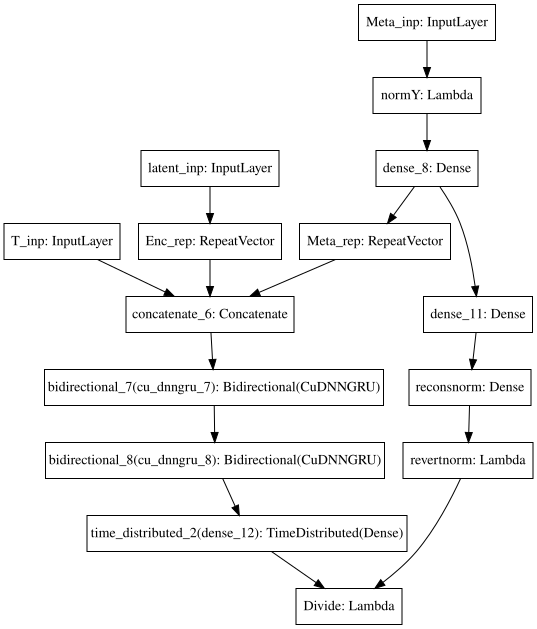

In [19]:
##### INPUTS ENCODER ######
x_lc = Input(shape = (T, channels) , name="LC_inp")
x_t = Input(shape = (T, channels) , name ="T_inp")
sinv_lc = Input(shape= (1,), name="invscale_inp") #para pesar loss
y_lc = Input(shape = (D_dim,) , name ="Meta_inp")

x_lc_s = Lambda(Multiply_layer, name="Multiply")([x_lc, sinv_lc]) #quitar escala del dato (o escalar a una version normal)

##### CODIFY SCALE and METADATA ######
f1_s = Lambda(Norm_L, arguments={'mu':Sinvlog_mu,'std':Sinvlog_std}, name="normS")(sinv_lc)
f1_s = Dense(1, activation='tanh')(f1_s)
y_rep = Lambda(Norm_L, arguments={'mu':Ylog_mu,'std':Ylog_std}, name="normY")(y_lc)
y_rep = Dense(10, activation='tanh')(y_rep)
y_rept = RepeatVector(T, name="Meta_rep")(y_rep)

##### CONCATENATE TIME + LC + METADATA-> CODIFY ######
x = Concatenate(axis=-1)([x_t, x_lc_s, y_rept]) #has to be concatenate on axis -1
f1 = Bidirectional(CuDNNGRU(64, return_sequences=True))(x) #bidirectional
f1 = Bidirectional(CuDNNGRU(64, return_sequences=False))(f1) #bidirectional

##### CONCATENATE CODIFY-LC + SCALE -> GET THE LATENT VARIABLE ######
f1 = Concatenate(axis=-1)([f1, f1_s]) 
z_mean = Dense(latent_dim,activation='linear')(f1)
z_log_var = Dense(latent_dim,activation='linear')(f1)
encoder = Model([x_t, x_lc, sinv_lc, y_lc], [z_mean,z_log_var], name="encoder")
samp_model = define_samp_model(latent_dim) #model to sample

##### INPUTS DECODER ######
decoder_input = Input(shape=(latent_dim,), name="latent_inp")
decoder_inp_rep = RepeatVector(T, name="Enc_rep")(decoder_input)

##### CONCATENATE TIME + LATENT VARIABLE + CONDITIONAL -> DECODIFY LIGHT CURVE ######
decode = Concatenate(axis=-1)([x_t, decoder_inp_rep, y_rept]) #add time and metadata to decode
decode = Bidirectional(CuDNNGRU(64, return_sequences=True))(decode) #bidirectional
#decode = Bidirectional(GRU(64, return_sequences=True))(decode) #bidirectional
decode = Bidirectional(CuDNNGRU(64, return_sequences=True))(decode) #bidirectional

##### CONCATENATE LATENT VARIABLE + CONDITIONAL -> RECONSTRCT SCALE ######
#decoder_inp_scal = Concatenate(axis=-1)([decoder_input, y_rep]) #add metadata to decode
decoder_inp_scal = y_rep #add metadata to decode
s_out = Dense(1, activation='tanh')(decoder_inp_scal) #
s_out = Dense(1, activation='linear', name="reconsnorm")(s_out) #
s_out = Lambda(RevertNorm_L, arguments={'mu':Sinvlog_mu,'std':Sinvlog_std},name="revertnorm")(s_out) #NEW: volver a escala normal 
sinv_hat = Model([decoder_input,y_lc], s_out)([samp_model(encoder([x_t, x_lc, sinv_lc, y_lc])),y_lc]) #para verificar reconstruccion
Sinv_model = Model([x_t, x_lc, sinv_lc, y_lc], sinv_hat)

#####  RECONSTRUCT LIGHT CURVE BY SCALE  ######
decode = TimeDistributed(Dense(1, activation='linear'))(decode)
decode = Lambda(Divide_layer, name="Divide")([decode, s_out]) #NEW: 
generator = Model([x_t, decoder_input, y_lc], decode, name="generator")

# instantiate VAE model
out = generator([x_t, samp_model(encoder([x_t, x_lc, sinv_lc, y_lc])), y_lc ])
Cvae = Model([x_t, x_lc, sinv_lc, y_lc], out)

#define loss functions over model components
smse_LC = SMSE_loss(sinv_lc)
mse_S = MSE_scale_loss(sinv_lc, sinv_hat) 
kl_loss = KL_loss(z_mean, z_log_var)

def Wvae_loss(y_true, y_pred):    
    return smse_LC(y_true, y_pred) + l*kl_loss(y_true, y_pred) + 0.1*mse_S(y_true, y_pred)
Cvae.compile(optimizer='adam', loss=Wvae_loss, metrics = [smse_LC,kl_loss,mse_S])

#Cvae.get_layer("encoder").load_weights("./models/C-VAEscale_MA5_%dT_%dD_%de_E.h5"%(T,latent_dim,400))
#Cvae.get_layer("generator").load_weights("./models/C-VAEscale_MA5_%dT_%dD_%de_D.h5"%(T,latent_dim,400))

SVG(model_to_dot(Cvae.get_layer("generator")).create(prog='dot', format='svg'))

In [20]:
Cvae.fit([X_data_t, X_data, Sinv_data, Y_transit], X_data, epochs=400, batch_size=batch_size)

Epoch 1/400
8634/8634 [==============================] - 22s 3ms/step - loss: 1.4901 - SMSE: 1.3561 - KL: 4.5777 - MSE_scale: 1.2947
Epoch 2/400
8634/8634 [==============================] - 18s 2ms/step - loss: 1.3021 - SMSE: 1.1573 - KL: 4.8173 - MSE_scale: 1.3998
Epoch 3/400
8634/8634 [==============================] - 18s 2ms/step - loss: 1.1465 - SMSE: 1.0107 - KL: 4.8298 - MSE_scale: 1.3096
Epoch 4/400
8634/8634 [==============================] - 17s 2ms/step - loss: 1.1350 - SMSE: 1.0087 - KL: 3.9621 - MSE_scale: 1.2236
Epoch 5/400
8634/8634 [==============================] - 17s 2ms/step - loss: 1.1312 - SMSE: 1.0077 - KL: 3.2806 - MSE_scale: 1.2022
Epoch 6/400
8634/8634 [==============================] - 18s 2ms/step - loss: 1.1315 - SMSE: 1.0094 - KL: 2.8169 - MSE_scale: 1.1933
Epoch 7/400
8634/8634 [==============================] - 17s 2ms/step - loss: 1.1276 - SMSE: 1.0066 - KL: 2.4697 - MSE_scale: 1.1856
Epoch 8/400
8634/8634 [==============================] - 17s 2ms/step

8634/8634 [==============================] - 17s 2ms/step - loss: 0.9191 - SMSE: 0.8113 - KL: 17.6122 - MSE_scale: 0.9016
Epoch 123/400
8634/8634 [==============================] - 17s 2ms/step - loss: 0.9159 - SMSE: 0.8082 - KL: 17.3605 - MSE_scale: 0.9028
Epoch 124/400
8634/8634 [==============================] - 17s 2ms/step - loss: 0.9138 - SMSE: 0.8063 - KL: 17.6479 - MSE_scale: 0.8989
Epoch 125/400
8634/8634 [==============================] - 17s 2ms/step - loss: 0.9170 - SMSE: 0.8103 - KL: 16.6261 - MSE_scale: 0.9009
Epoch 126/400
8634/8634 [==============================] - 17s 2ms/step - loss: 0.9452 - SMSE: 0.8422 - KL: 13.7900 - MSE_scale: 0.8924
Epoch 127/400
8634/8634 [==============================] - 17s 2ms/step - loss: 0.9211 - SMSE: 0.8159 - KL: 15.8494 - MSE_scale: 0.8933
Epoch 128/400
8634/8634 [==============================] - 17s 2ms/step - loss: 0.9090 - SMSE: 0.8026 - KL: 16.5652 - MSE_scale: 0.8983
Epoch 129/400
8634/8634 [==============================] - 17s

8634/8634 [==============================] - 17s 2ms/step - loss: 0.8507 - SMSE: 0.7468 - KL: 16.7993 - MSE_scale: 0.8705
Epoch 243/400
8634/8634 [==============================] - 17s 2ms/step - loss: 0.8377 - SMSE: 0.7340 - KL: 16.4921 - MSE_scale: 0.8719
Epoch 244/400
8634/8634 [==============================] - 17s 2ms/step - loss: 0.8520 - SMSE: 0.7482 - KL: 16.6447 - MSE_scale: 0.8717
Epoch 245/400
8634/8634 [==============================] - 17s 2ms/step - loss: 0.8441 - SMSE: 0.7410 - KL: 16.1282 - MSE_scale: 0.8704
Epoch 246/400
8634/8634 [==============================] - 17s 2ms/step - loss: 0.8494 - SMSE: 0.7466 - KL: 15.9030 - MSE_scale: 0.8691
Epoch 247/400
8634/8634 [==============================] - 17s 2ms/step - loss: 0.8383 - SMSE: 0.7345 - KL: 16.8273 - MSE_scale: 0.8696
Epoch 248/400
8634/8634 [==============================] - 17s 2ms/step - loss: 0.8638 - SMSE: 0.7606 - KL: 16.4002 - MSE_scale: 0.8684
Epoch 249/400
8634/8634 [==============================] - 17s

8634/8634 [==============================] - 17s 2ms/step - loss: 0.8113 - SMSE: 0.7083 - KL: 17.0327 - MSE_scale: 0.8601
Epoch 363/400
8634/8634 [==============================] - 17s 2ms/step - loss: 0.7997 - SMSE: 0.6967 - KL: 17.8216 - MSE_scale: 0.8522
Epoch 364/400
8634/8634 [==============================] - 17s 2ms/step - loss: 0.8156 - SMSE: 0.7128 - KL: 17.3906 - MSE_scale: 0.8542
Epoch 365/400
8634/8634 [==============================] - 17s 2ms/step - loss: 0.8306 - SMSE: 0.7285 - KL: 16.8738 - MSE_scale: 0.8517
Epoch 366/400
8634/8634 [==============================] - 17s 2ms/step - loss: 0.8008 - SMSE: 0.6981 - KL: 17.1901 - MSE_scale: 0.8557
Epoch 367/400
8634/8634 [==============================] - 17s 2ms/step - loss: 0.8183 - SMSE: 0.7161 - KL: 16.9169 - MSE_scale: 0.8531
Epoch 368/400
8634/8634 [==============================] - 17s 2ms/step - loss: 0.8016 - SMSE: 0.6987 - KL: 17.1013 - MSE_scale: 0.8578
Epoch 369/400
8634/8634 [==============================] - 17s

----- EVALUANDO RECONSTRUCCION DE LA CURVA -----


/home/casapanshop/anaconda2/envs/py3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


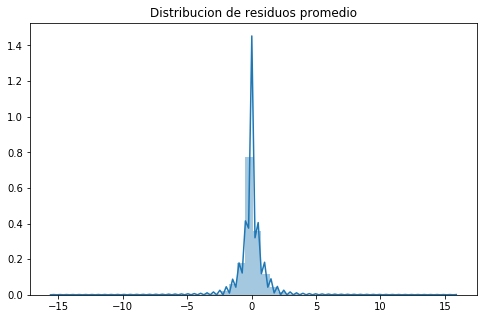

MSE      =  0.7674801942862853
RMSE (+-)=  0.8532307888360573
MAE  (+-)=  0.5174149130543884
--------- Smoothness ------------
AutoCorr lag-one =  0.6806002566443349
Diff MEAN =  0.05184425166039271
Diff STD =  0.307221806239355
--------- Smoothness ------------
MSE de escala escalado=  0.7052095444064792


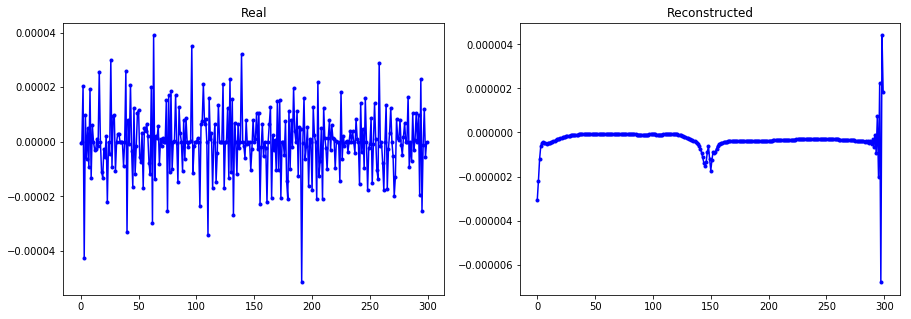

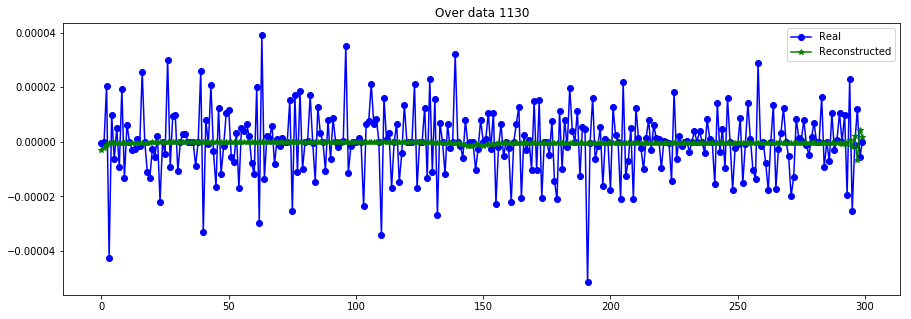

----------------------------------------------------------------


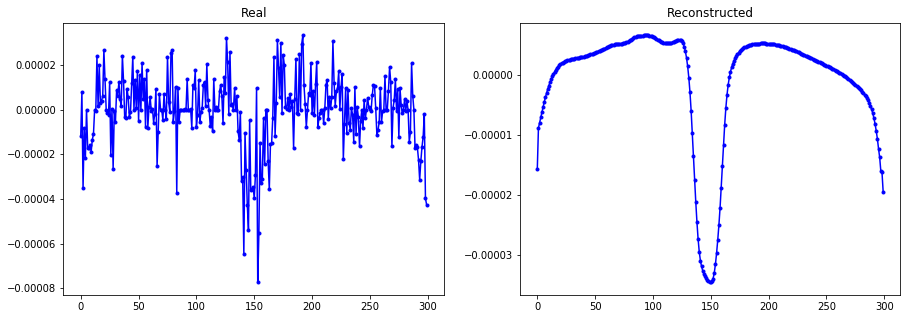

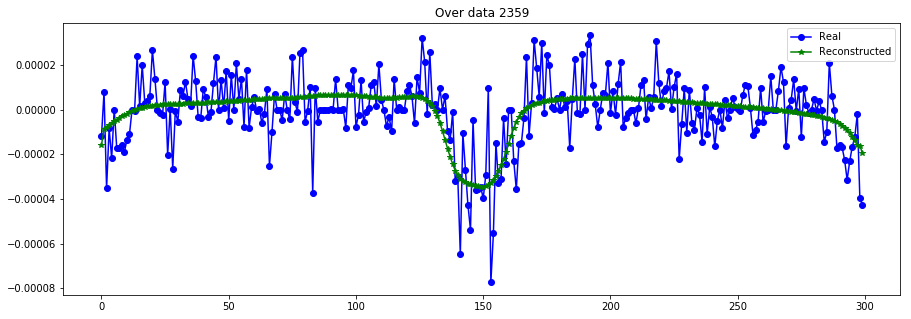

----------------------------------------------------------------


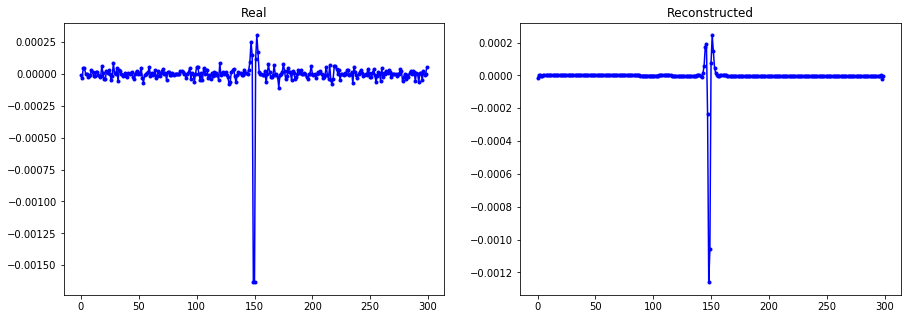

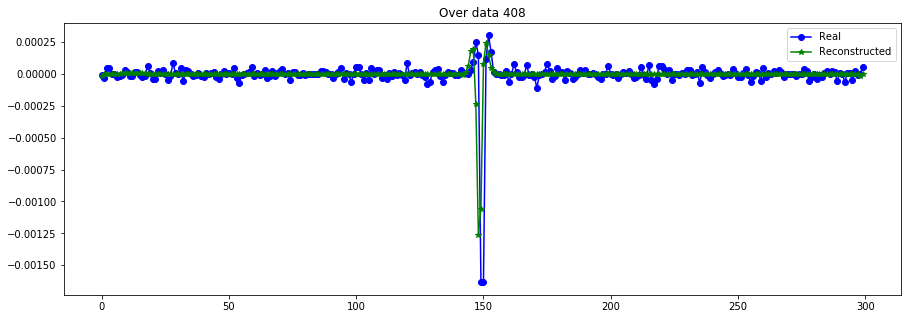

----------------------------------------------------------------


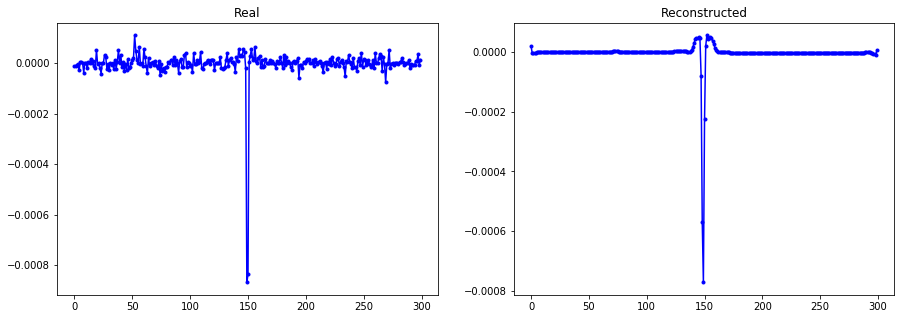

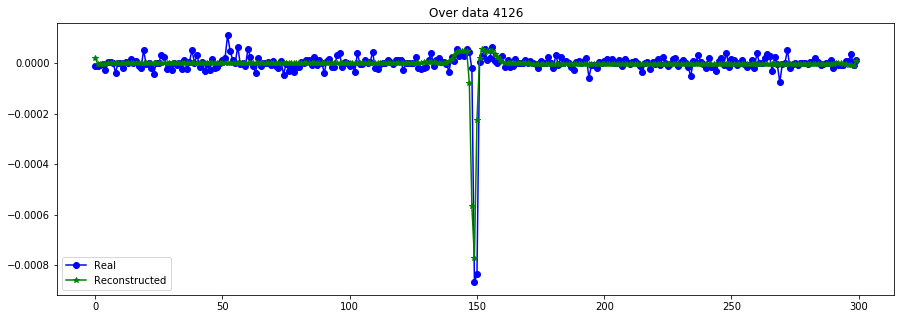

----------------------------------------------------------------


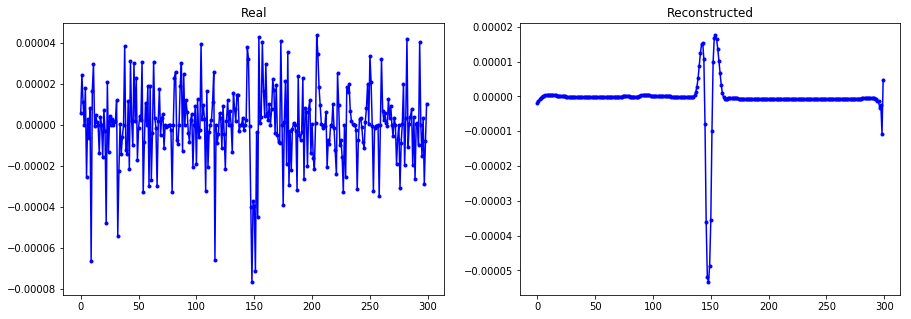

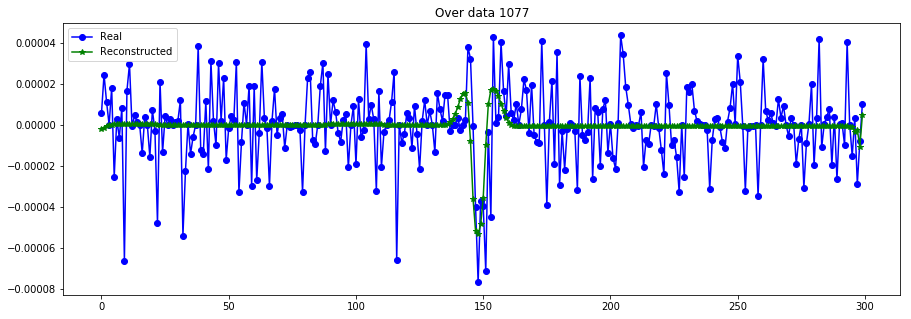

----------------------------------------------------------------


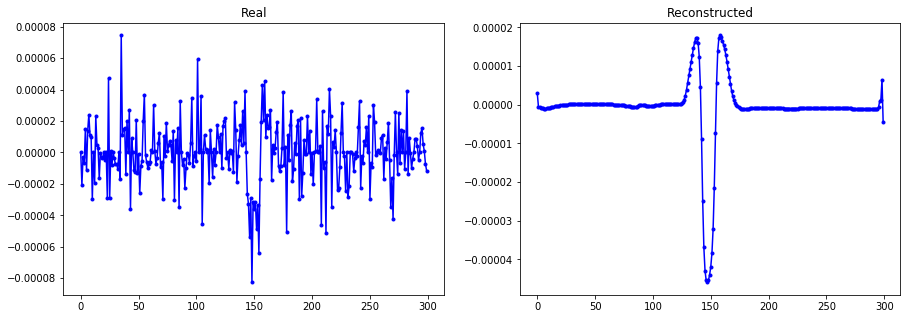

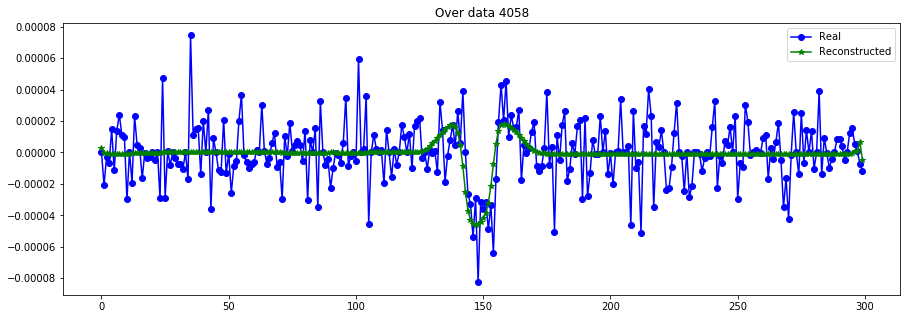

----------------------------------------------------------------


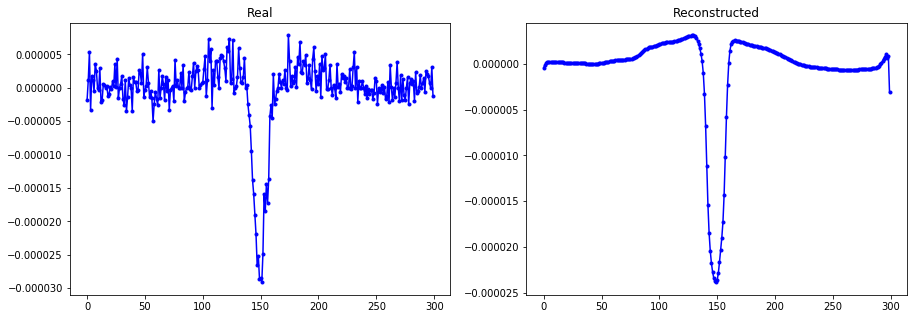

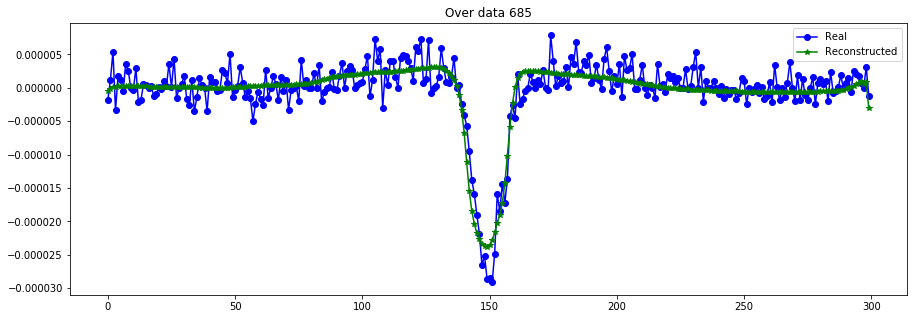

----------------------------------------------------------------


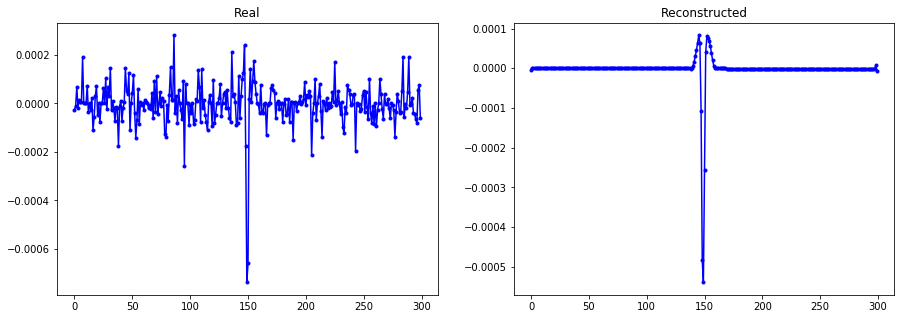

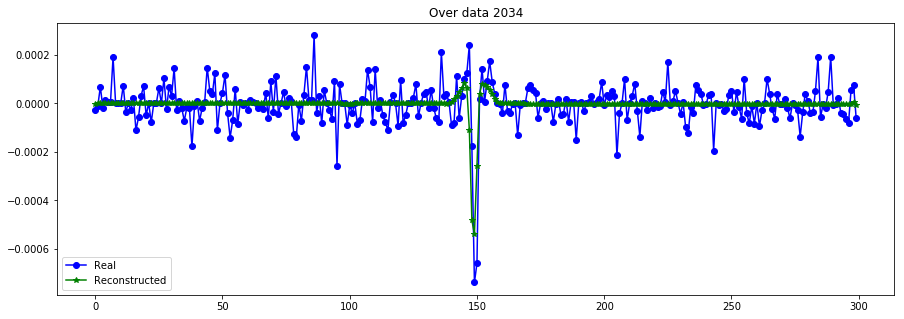

----------------------------------------------------------------


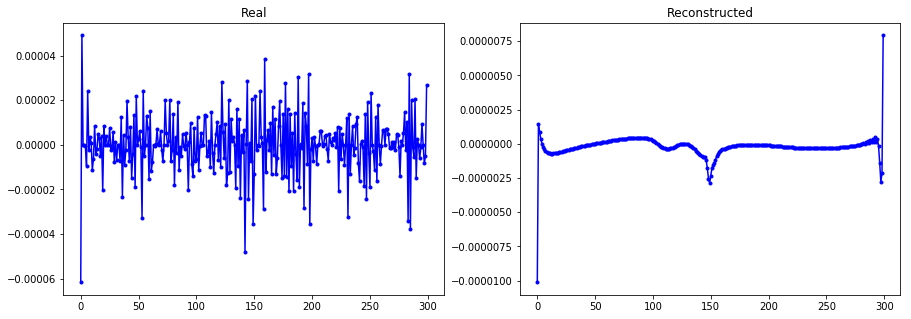

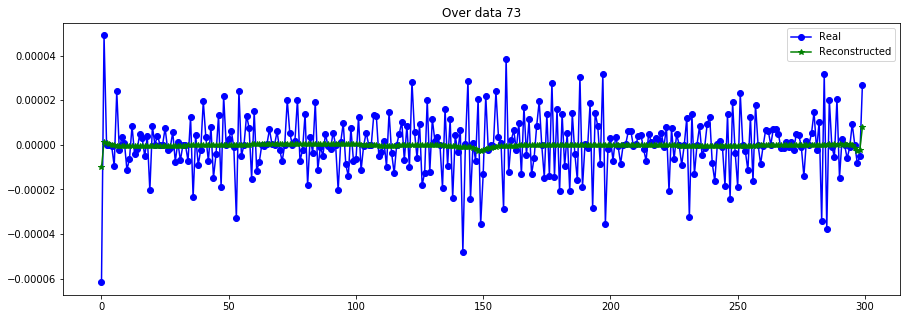

----------------------------------------------------------------


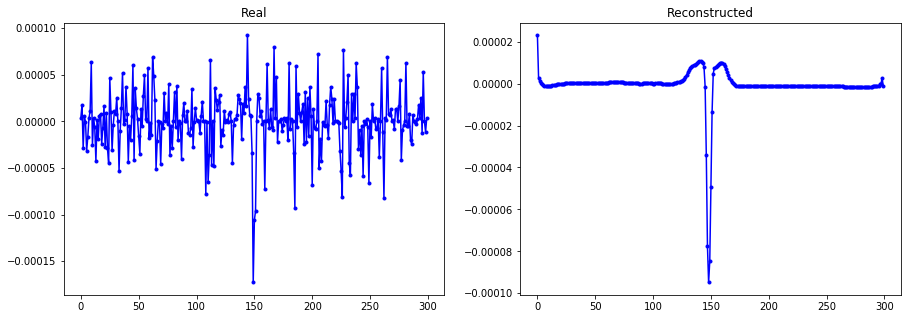

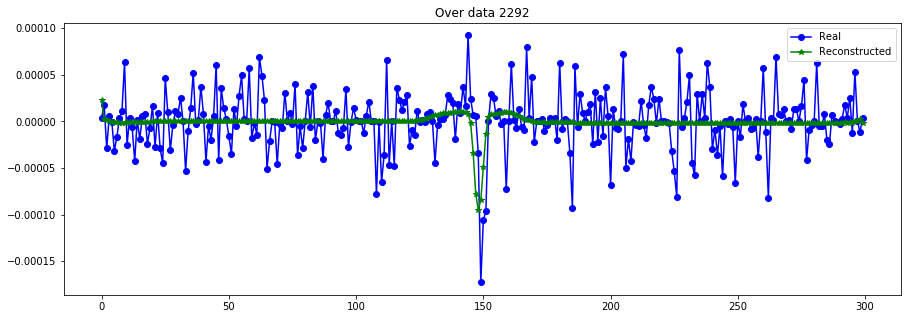

----------------------------------------------------------------


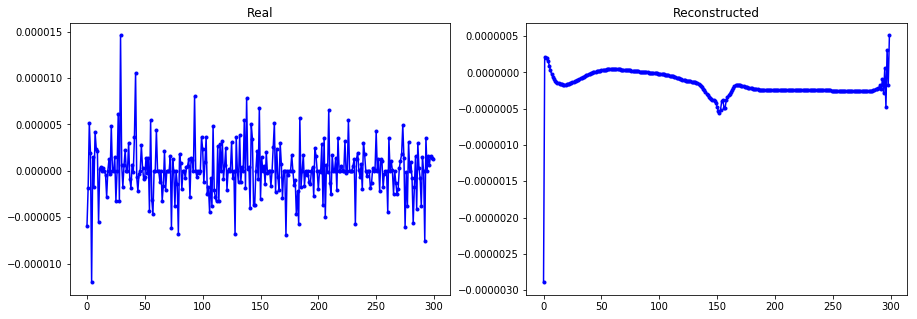

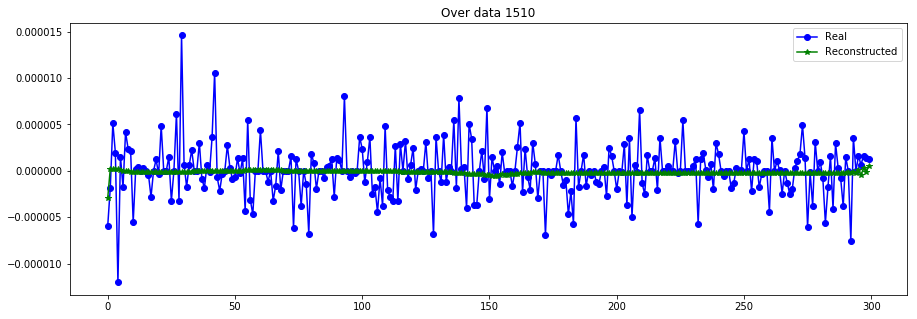

----------------------------------------------------------------


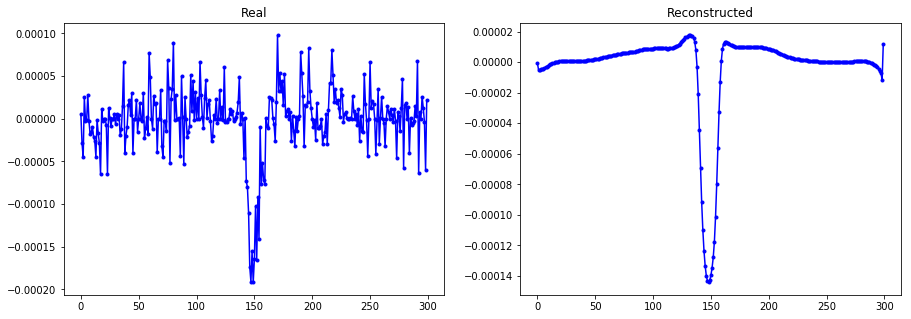

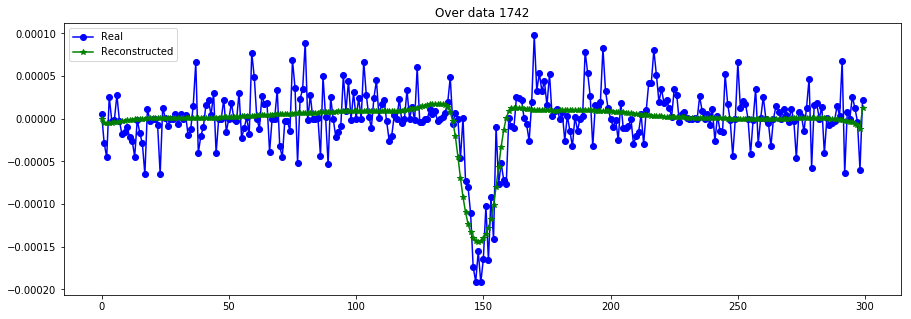

----------------------------------------------------------------


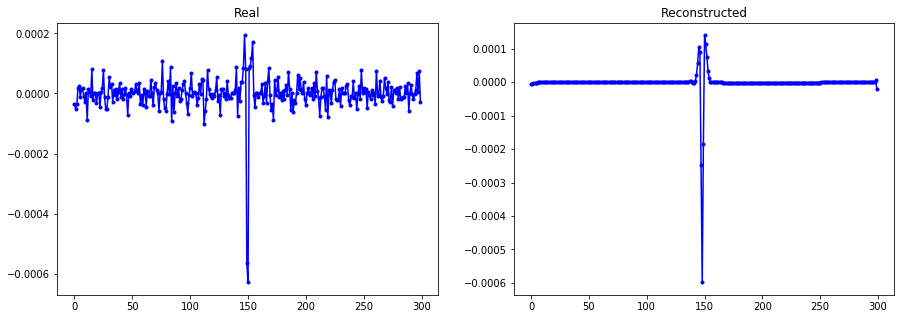

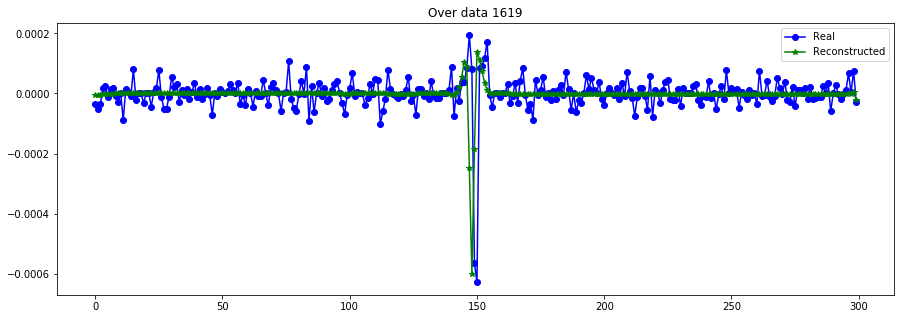

----------------------------------------------------------------


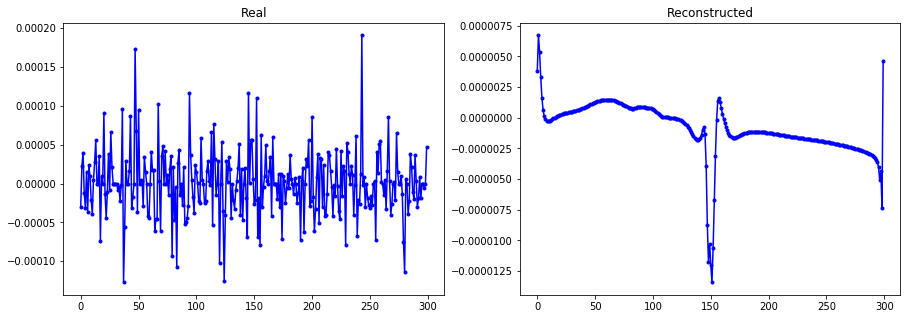

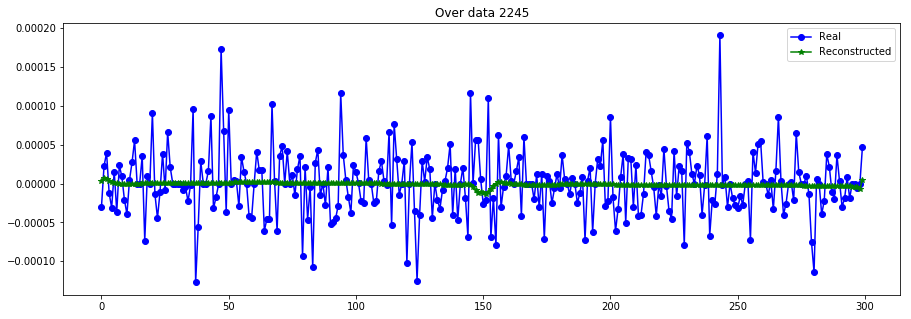

----------------------------------------------------------------


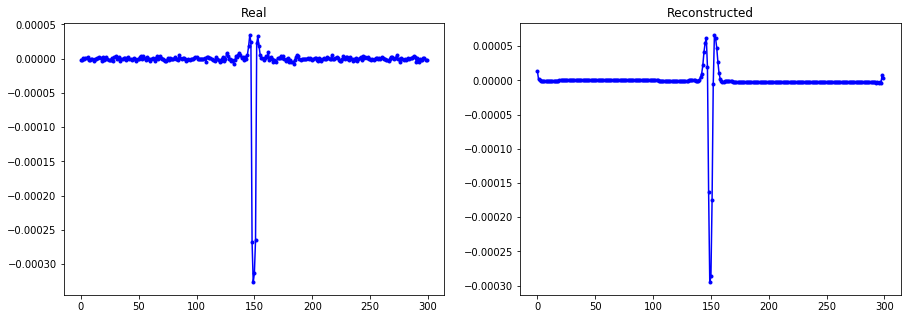

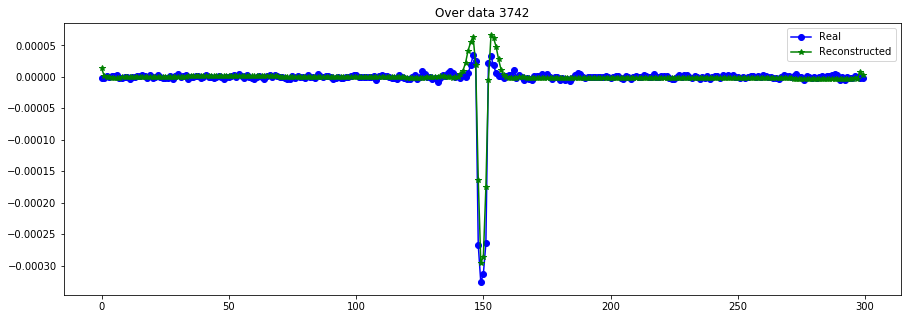

----------------------------------------------------------------


In [21]:
X_data_hat = Cvae.predict([X_data_t[:N_trans], X_data[:N_trans], Sinv_data[:N_trans], Y_transit[:N_trans]], batch_size=512)
evaluate_reconst(X_data[:N_trans]*Sinv_data[:N_trans,None,:], X_data_hat*Sinv_data[:N_trans,None,:])

#una vez verificado esto eliminar este modelo...
Sinv_data_hat = Sinv_model.predict([X_data_t[:N_trans],X_data[:N_trans], Sinv_data[:N_trans],Y_transit[:N_trans]], batch_size=512)
print("MSE de escala escalado= ",mean_squared_error((Sinv_data[:N_trans]-Sinv_mu)/Sinv_std, (Sinv_data_hat-Sinv_mu)/Sinv_std))

plot_n_lc(X_data[:N_trans,:,0], X_data_hat, n= 15)

----- EVALUANDO RECONSTRUCCION DE LA CURVA -----


/home/casapanshop/anaconda2/envs/py3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


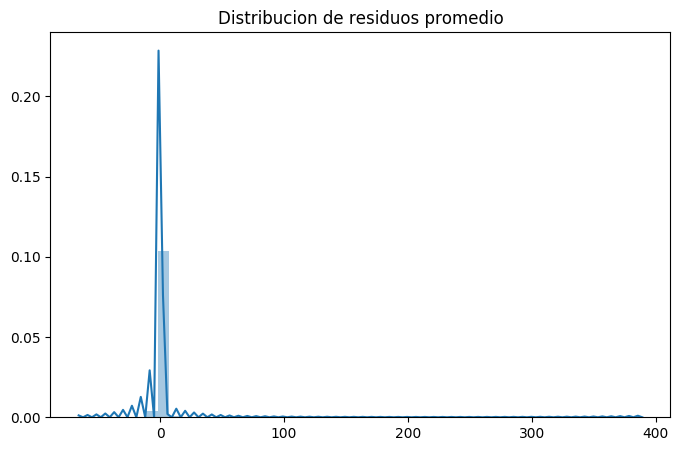

MSE      =  34.54725097686877
RMSE (+-)=  2.934427957369427
MAE  (+-)=  1.2013589153524808
--------- Smoothness ------------
AutoCorr lag-one =  0.7568032698582612
Diff MEAN =  0.21871302406978407
Diff STD =  0.908257968850538
--------- Smoothness ------------
MSE de escala escalado=  0.7052095450502919
Real scale = 24596.939525
Pred scale = 37136.367188


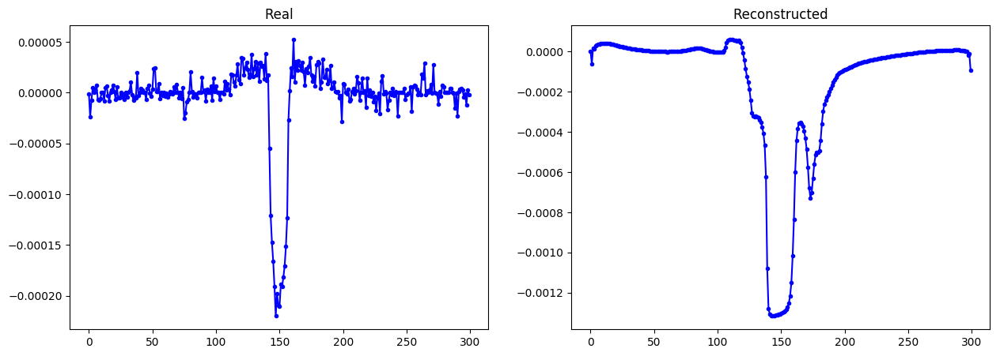

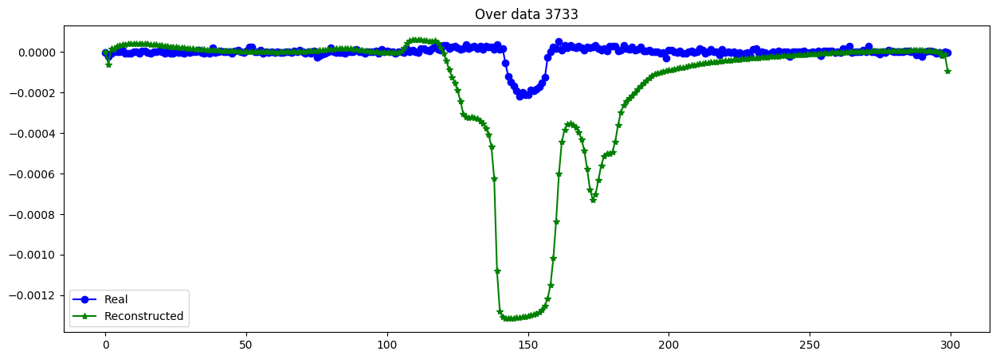

----------------------------------------------------------------
Real scale = 3488.629043
Pred scale = 63703.152344


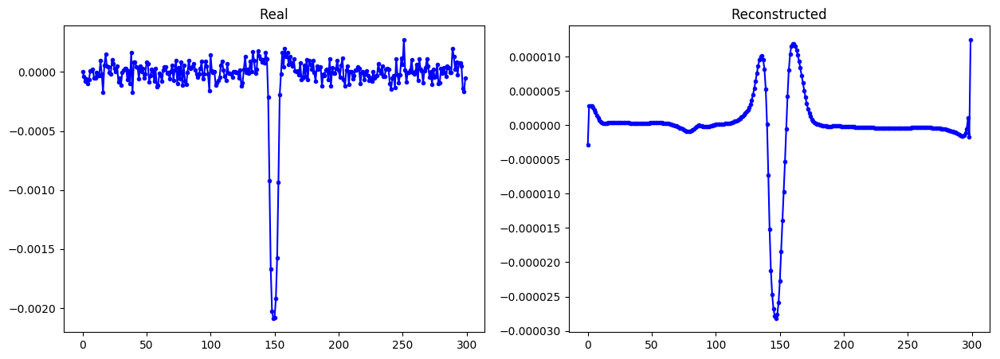

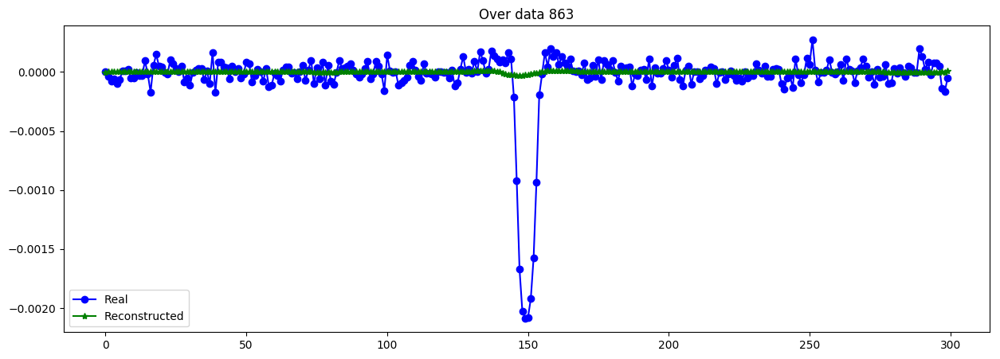

----------------------------------------------------------------
Real scale = 84724.496996
Pred scale = 43246.101562


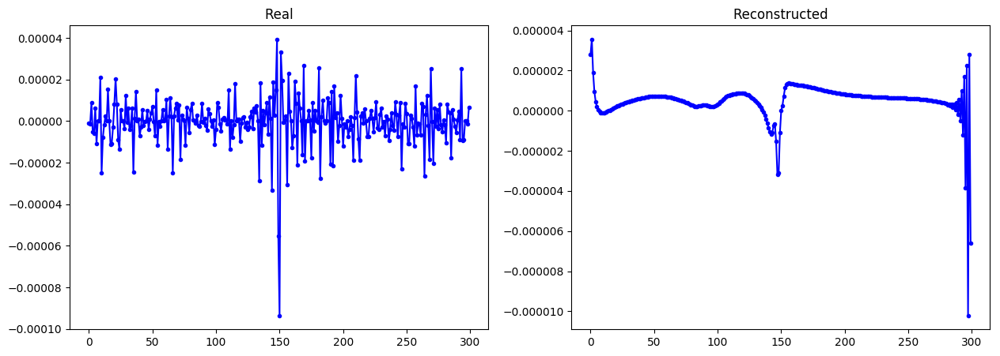

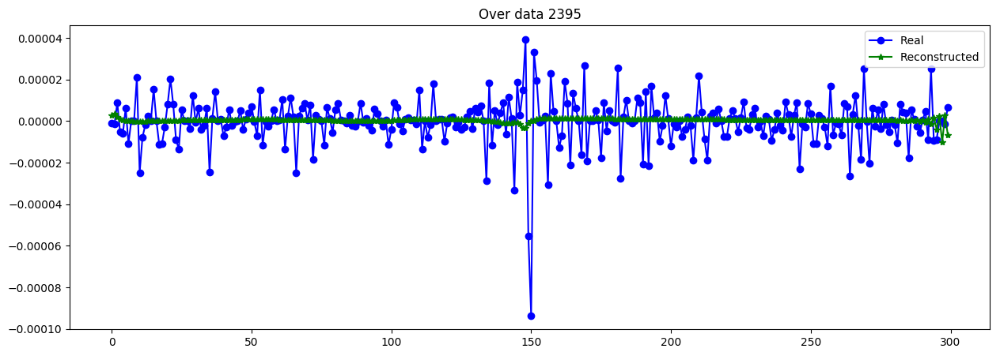

----------------------------------------------------------------
Real scale = 78583.186916
Pred scale = 59135.417969


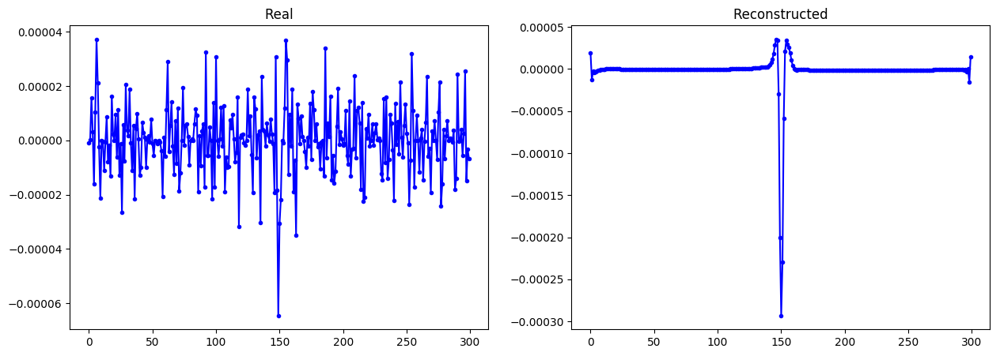

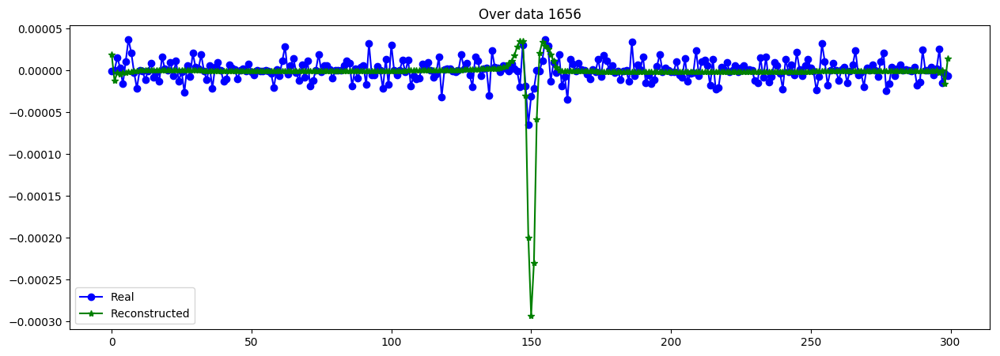

----------------------------------------------------------------
Real scale = 75401.470175
Pred scale = 61514.078125


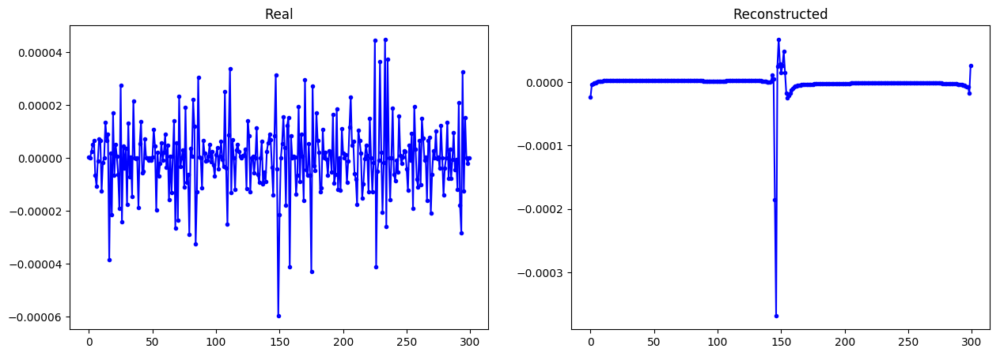

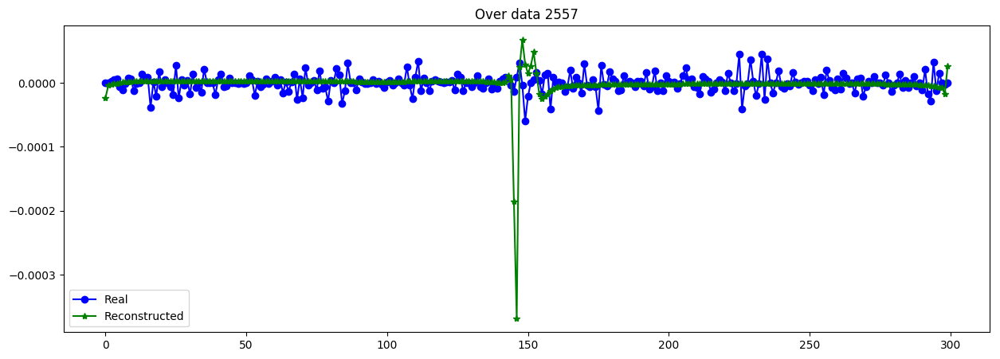

----------------------------------------------------------------
Real scale = 30057.566566
Pred scale = 47000.941406


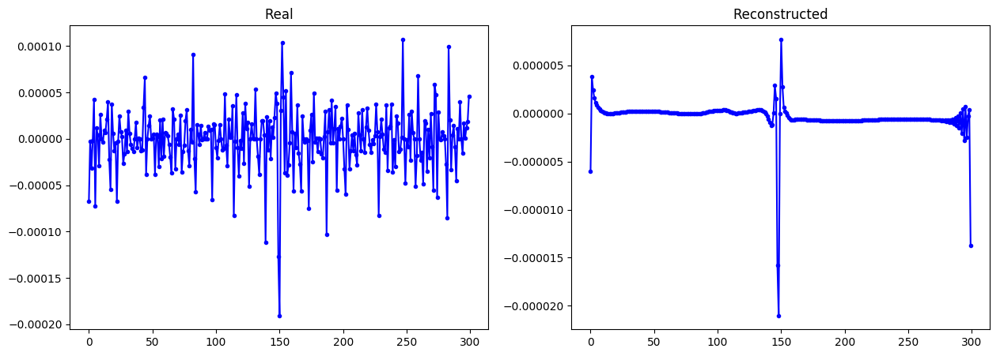

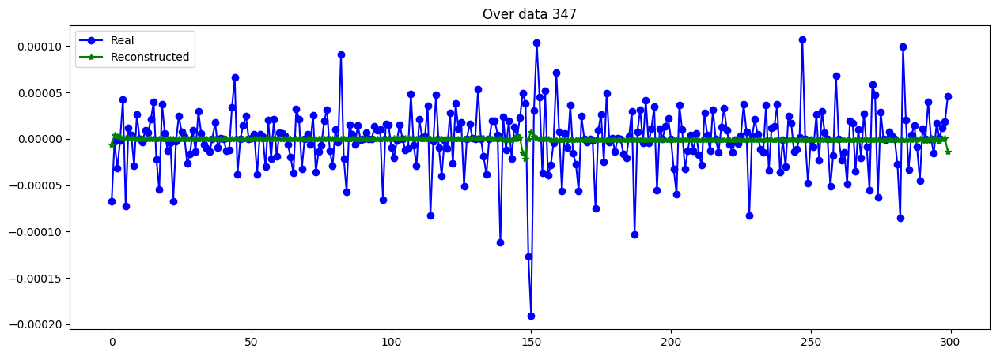

----------------------------------------------------------------
Real scale = 20796.816989
Pred scale = 40688.863281


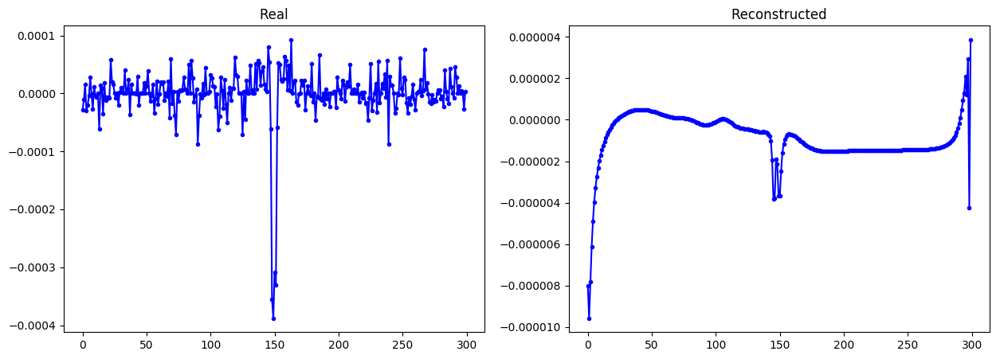

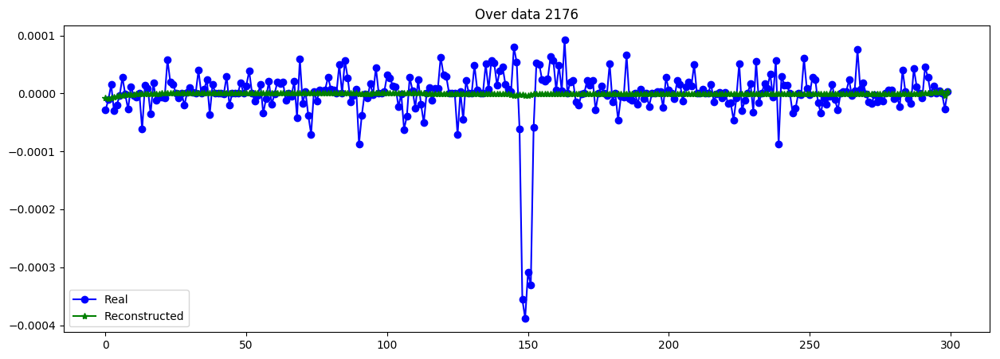

----------------------------------------------------------------
Real scale = 27884.949410
Pred scale = 53157.226562


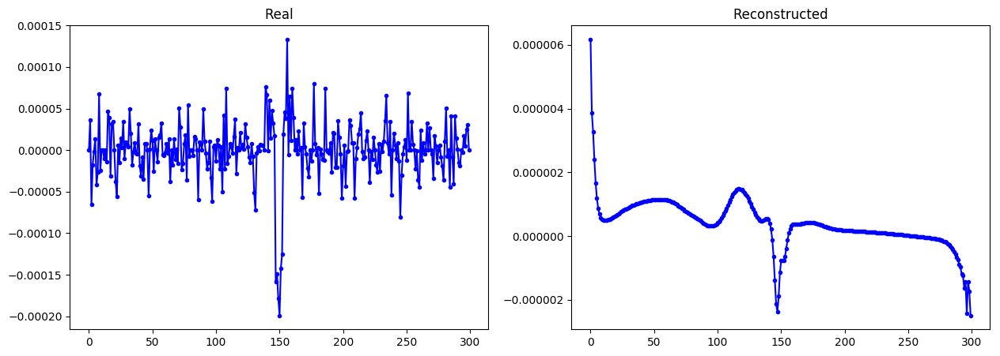

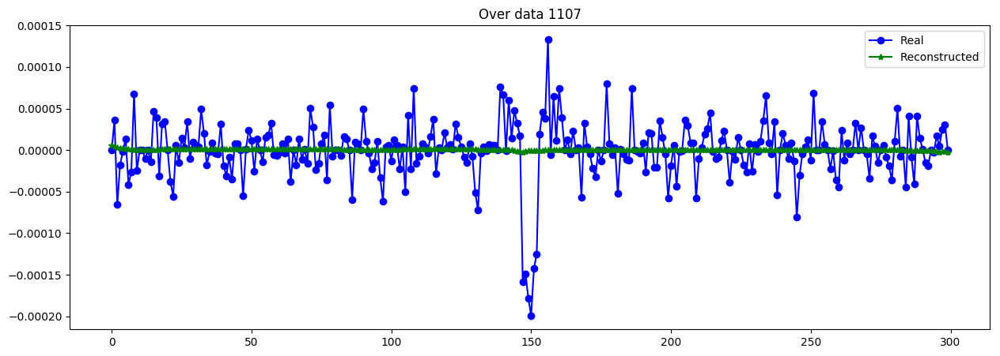

----------------------------------------------------------------
Real scale = 32141.718397
Pred scale = 43814.261719


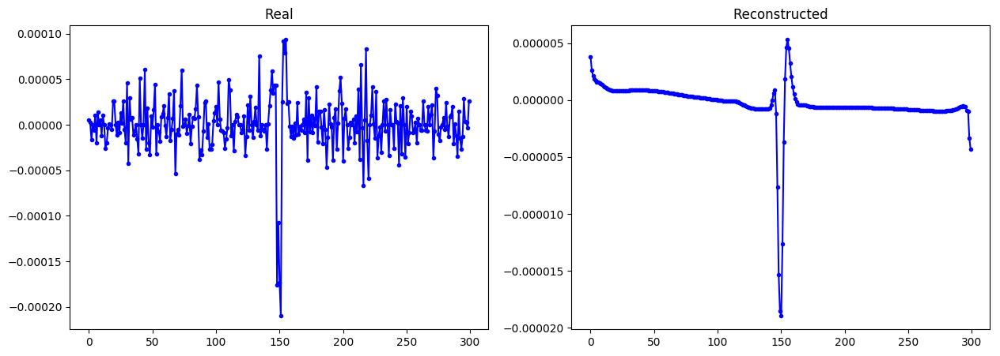

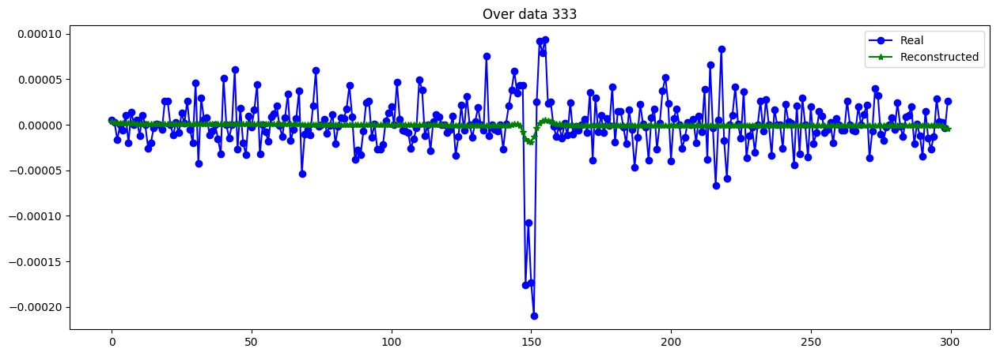

----------------------------------------------------------------
Real scale = 47421.397780
Pred scale = 59165.257812


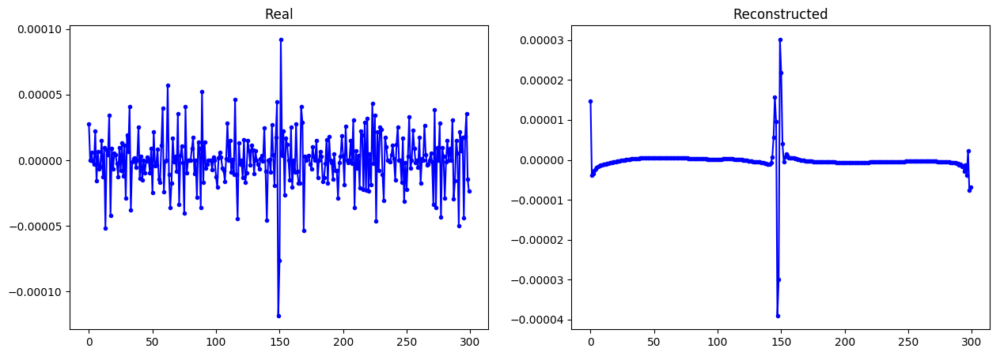

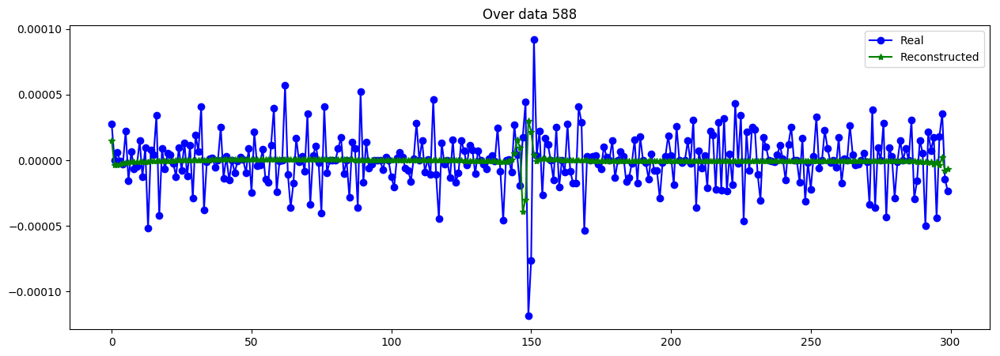

----------------------------------------------------------------
Real scale = 109492.951935
Pred scale = 57793.183594


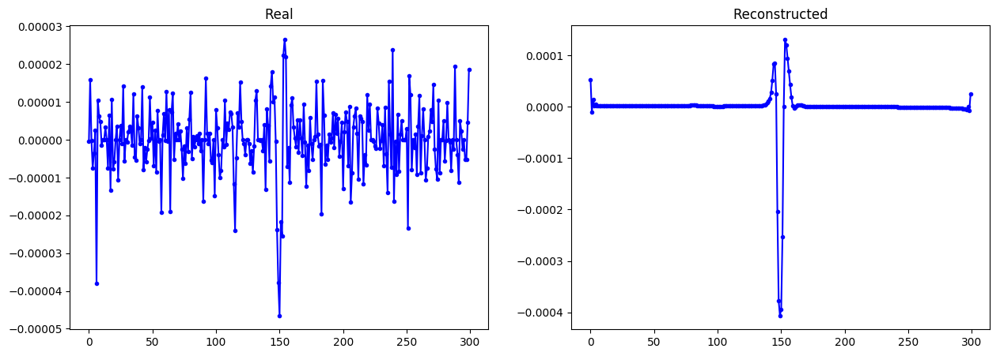

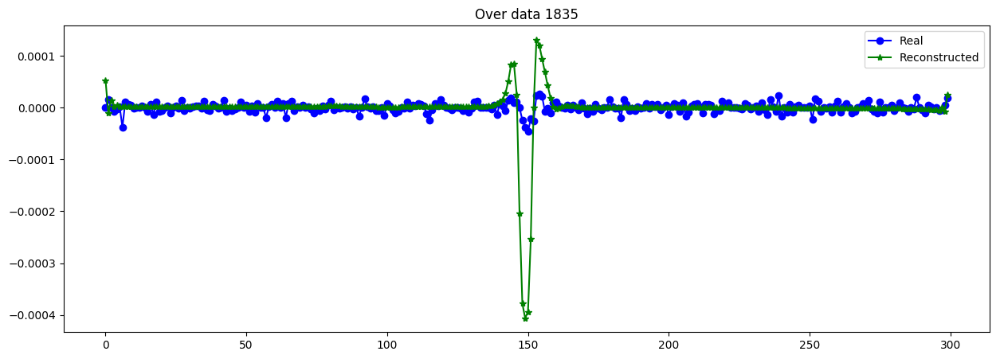

----------------------------------------------------------------
Real scale = 89266.960334
Pred scale = 37118.097656


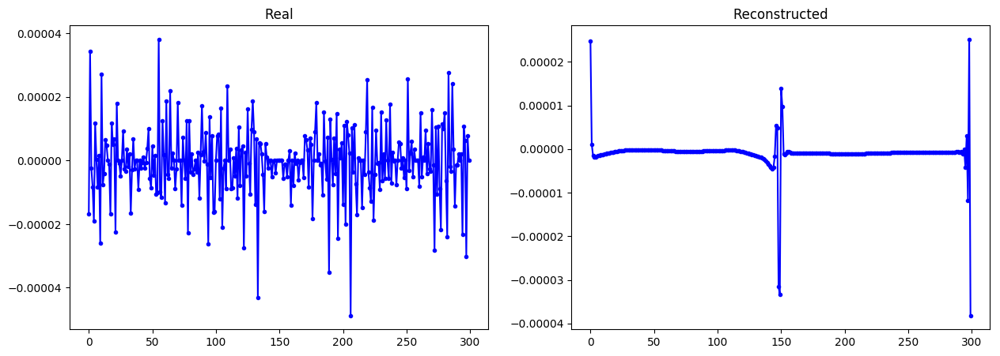

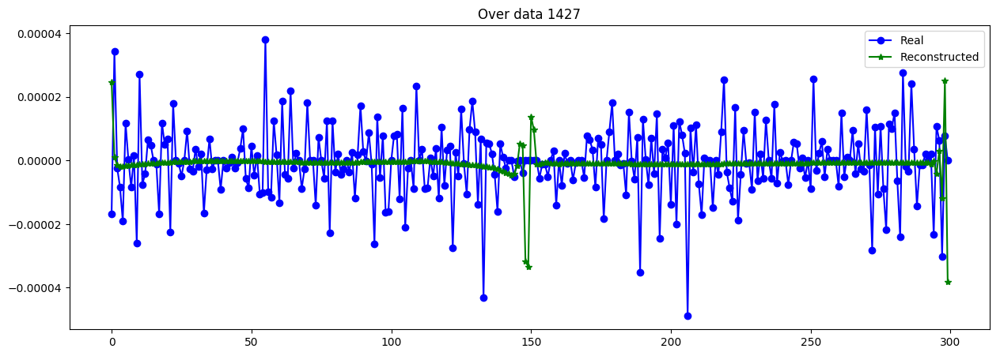

----------------------------------------------------------------
Real scale = 68619.269363
Pred scale = 105302.898438


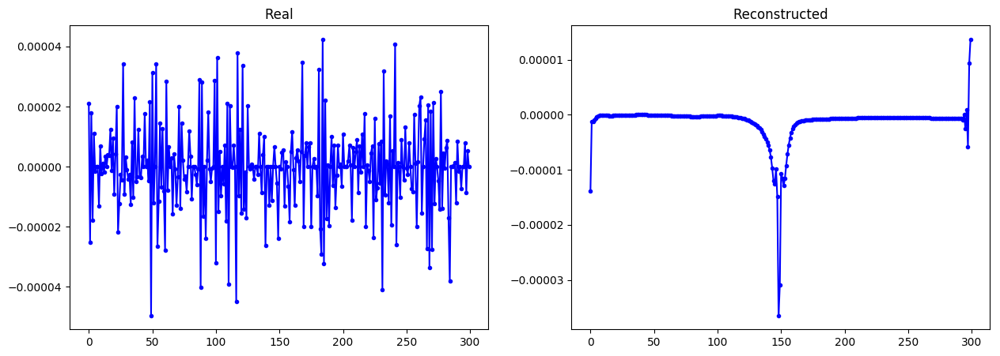

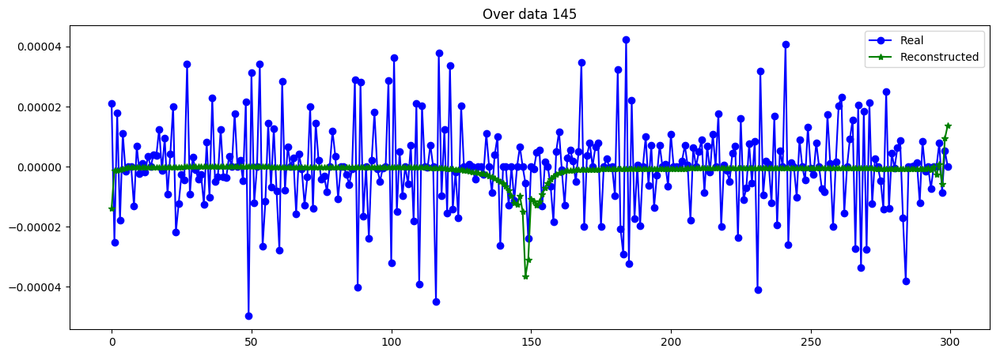

----------------------------------------------------------------
Real scale = 21760.682757
Pred scale = 64114.253906


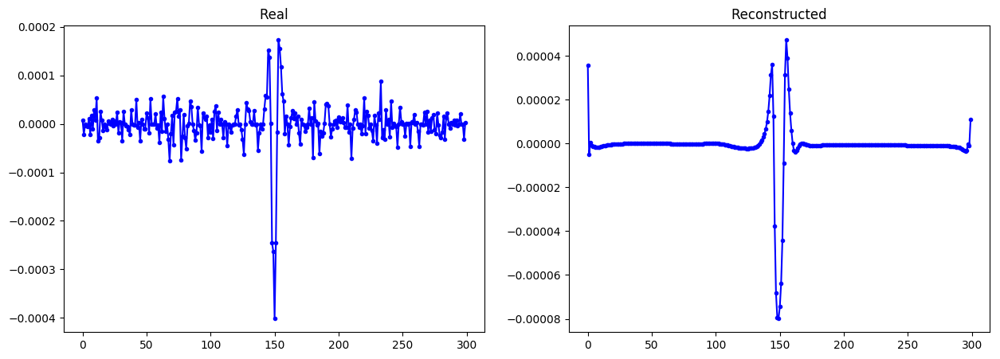

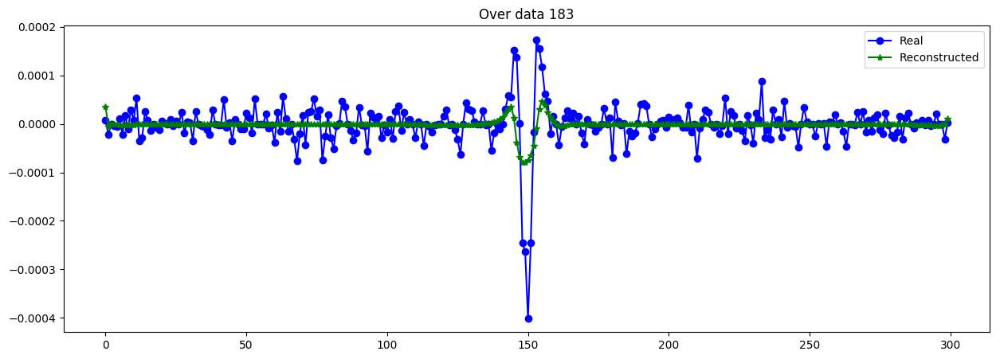

----------------------------------------------------------------
Real scale = 39422.035006
Pred scale = 39591.960938


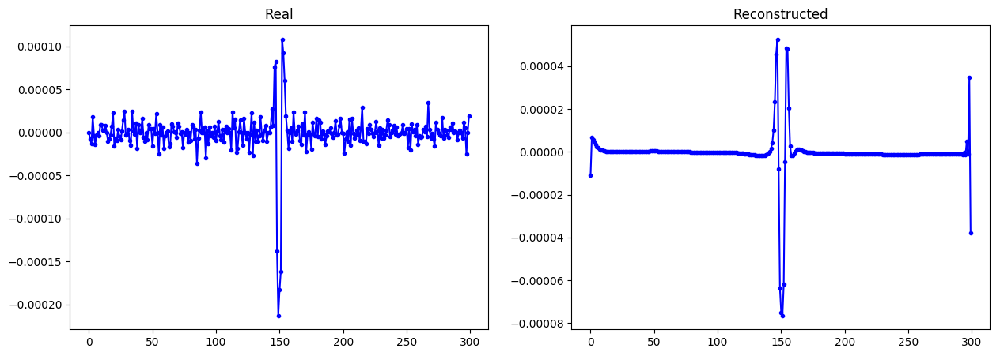

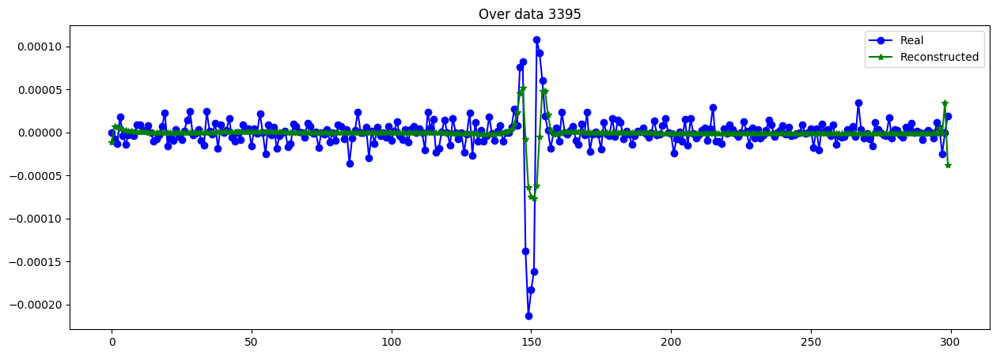

----------------------------------------------------------------


In [24]:
X_CVAE = simulate_CVAE(Cvae.get_layer("generator"), time_all, Y_values, batch_size=256)
X_data_CVAE = X_CVAE[mask_transit]

z_samp_all = np.random.normal(0, 1, size=(Y_values.shape[0], latent_dim))
Sinv_data_hat = Model([decoder_input,y_lc], s_out).predict([z_samp_all, Y_values])[mask_transit]

evaluate_reconst(X_data[:N_trans,:]*Sinv_data[:N_trans,None], X_data_CVAE*Sinv_data[:N_trans,None])
print("MSE de escala escalado= ",mean_squared_error(Sinv_data[:N_trans],Sinv_data_hat)*(1/Sinv_std)**2)

plot_n_lc(X_data[:N_trans], X_data_CVAE, n= 15, s=[Sinv_data[:N_trans],Sinv_data_hat]) #as MA-1

In [25]:
Cvae.get_layer("encoder").save_weights("./models/C-VAEscale_MA5_%dT_%dD_%de_E.h5"%(T,latent_dim,400))
Cvae.get_layer("generator").save_weights("./models/C-VAEscale_MA5_%dT_%dD_%de_D.h5"%(T,latent_dim,400))

## Generar:
* ver los casos en que muere MA (depende del a libreria)

In [22]:
def transform_delta(t):
    return np.hstack([[0],np.diff(t)])

def set_time_T(t,T):
    return np.interp(np.linspace(0, len(t),T), np.arange(len(t)), t)

from mandelagol_sim import simulate_MA, get_MA_sim_names
        
MA_sim_names = get_MA_sim_names()

Cannot import pytransit library 


/home/casapanshop/anaconda2/envs/py3/lib/python3.5/site-packages/pylightcurve/_0imports.py:20: UserWarning: 
This call to matplotlib.use() has no effect because the backend has already
been chosen; matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

The backend was *originally* set to 'module://ipykernel.pylab.backend_inline' by the following code:
  File "/home/casapanshop/anaconda2/envs/py3/lib/python3.5/runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "/home/casapanshop/anaconda2/envs/py3/lib/python3.5/runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "/home/casapanshop/anaconda2/envs/py3/lib/python3.5/site-packages/ipykernel/__main__.py", line 3, in <module>
    app.launch_new_instance()
  File "/home/casapanshop/anaconda2/envs/py3/lib/python3.5/site-packages/traitlets/config/application.py", line 658, in launch_instance
    app.start()
  File "/home/casapanshop/anac

In [23]:
def simulate_CVAE(generator, time, Y, batch_size=128):
    #checek shapes of time and Y
    
    latent_dim = generator.get_layer("latent_inp").input_shape[-1]
    N_all = Y.shape[0]
        
    #Simular con C_VAE
    Dtime_all  = np.apply_along_axis(transform_delta, 1, time)[:,:,None]
    z_samp_all = np.random.normal(0, 1, size=(N_all, latent_dim))
    
    #Y_all = std_metadata.transform(Y_all) #only mdoel 4
    return generator.predict([Dtime_all, z_samp_all, Y], batch_size=batch_size)

time_all = np.cumsum(np.squeeze(X_fold_time), axis=-1)

/home/casapanshop/anaconda2/envs/py3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


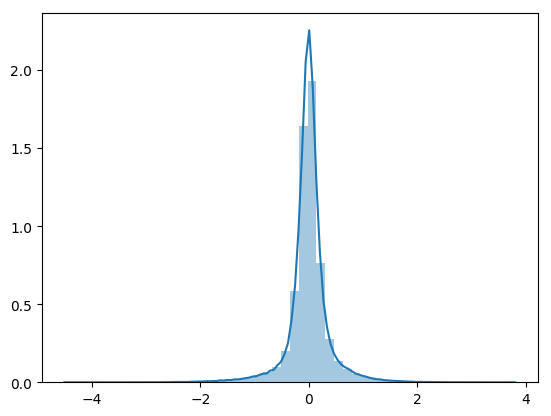

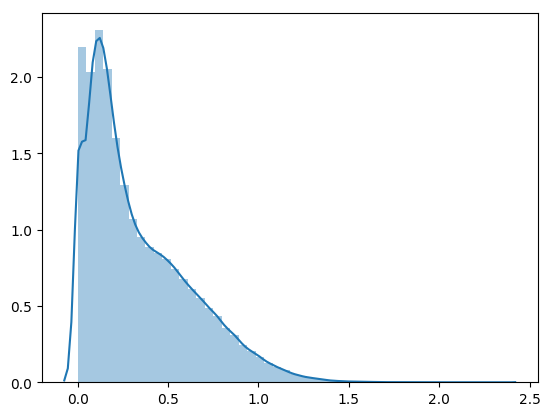

In [96]:
#z_aux, z_var_aux = encoder.predict([X_data_t, X_data, Sinv_data, Ystd_transit], batch_size=512)
z_aux, z_var_aux = encoder.predict([X_data_t, X_data, Sinv_data, Y_transit], batch_size=512)

sns.distplot(z_aux.flatten())
plt.show()
sns.distplot(np.exp(z_var_aux.flatten()))
plt.show()

In [32]:
%%time 
N_all = df_meta_obj.shape[0]
time_all = np.cumsum(np.squeeze(X_fold_time), axis=-1)

#Simular con C_VAE
Dtime_all  = np.apply_along_axis(transform_delta, 1, time_all)[:,:,None]
z_samp_all = np.random.normal(0, 1, size=(N_all, latent_dim))
Y_all      = df_meta_obj.drop(del_val, axis=1).values  
#Y_all = std_metadata.transform(Y_all) #only mdoel 4

X_CVAE = generator.predict([Dtime_all, z_samp_all, Y_all], batch_size=128)

CPU times: user 3.28 s, sys: 75.8 ms, total: 3.36 s
Wall time: 3.28 s


In [33]:
Sinv_data_hat = Model([decoder_input,y_lc], s_out).predict([z_samp_all, Y_all])[mask_transit]

X_data_CVAE = X_CVAE[mask_transit]
X_data_CVAE.shape

(4317, 300, 1)

----- EVALUANDO RECONSTRUCCION DE LA CURVA -----


/home/casapanshop/anaconda2/envs/py3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


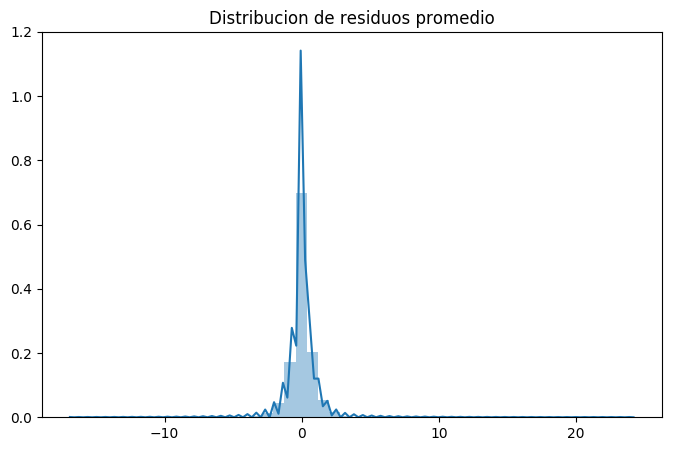

MSE      =  1.0204891043314848
RMSE (+-)=  0.9711064154096537
MAE  (+-)=  0.5701602520704154
--------- Smoothness ------------
AutoCorr lag-one =  0.6745479
Diff MEAN =  0.058970563
Diff STD =  0.3172032
--------- Smoothness ------------
----- EVALUANDO RECONSTRUCCION DE LA CURVA -----


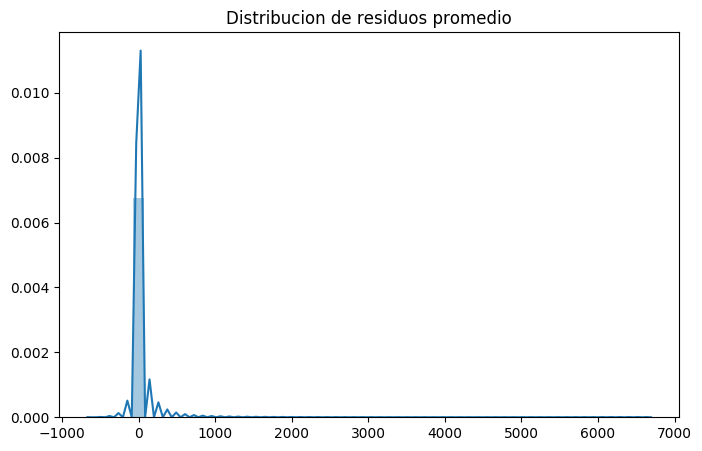

MSE      =  3424.54226865883
RMSE (+-)=  11.392790287477265
MAE  (+-)=  3.7419699138839975
--------- Smoothness ------------
AutoCorr lag-one =  0.6745479428687777
Diff MEAN =  0.917722052284094
Diff STD =  4.005358051767429
--------- Smoothness ------------
MSE de escala escalado=  6.877371114426709
Real scale = 62970.365955
Pred scale = 51759.101562


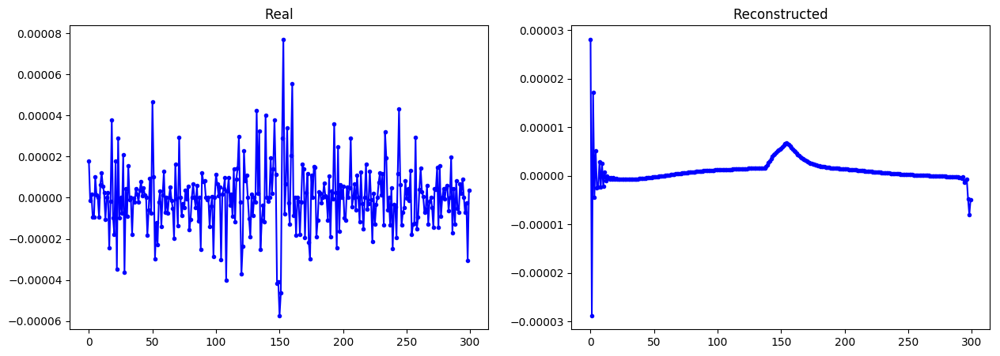

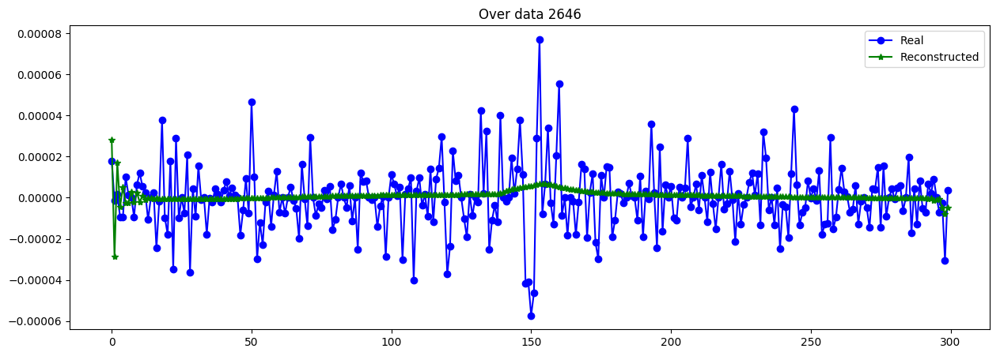

----------------------------------------------------------------
Real scale = 6320.653030
Pred scale = 13057.117188


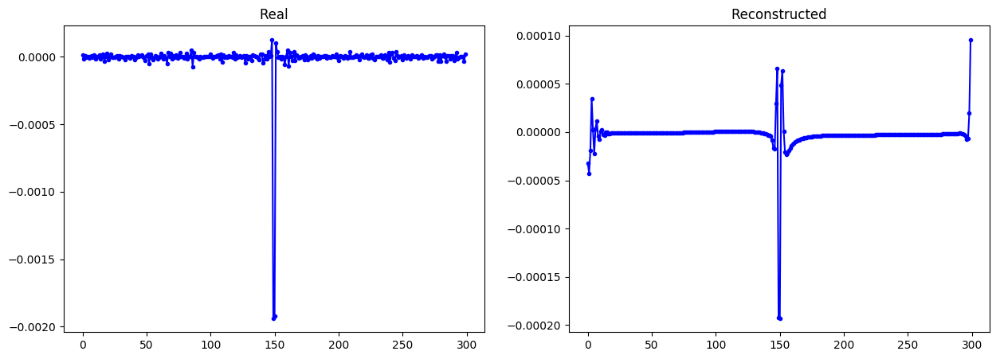

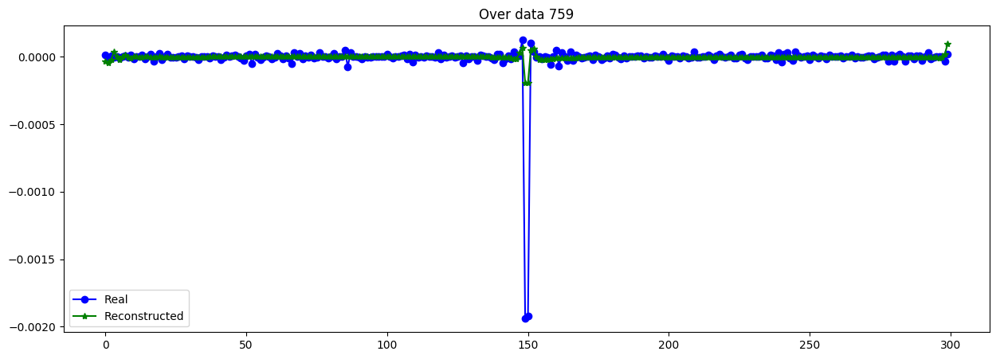

----------------------------------------------------------------
Real scale = 24134.300433
Pred scale = 30076.910156


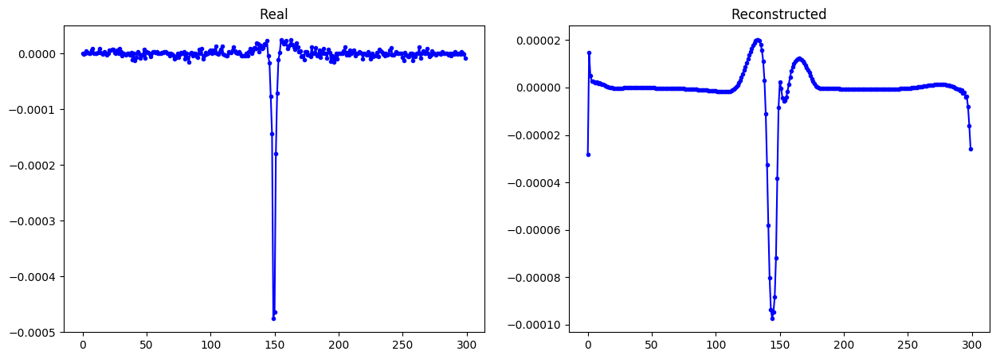

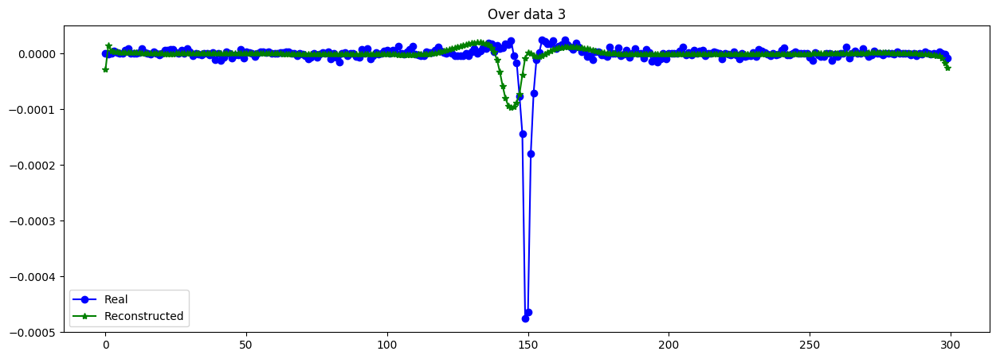

----------------------------------------------------------------
Real scale = 133340.115687
Pred scale = 71799.062500


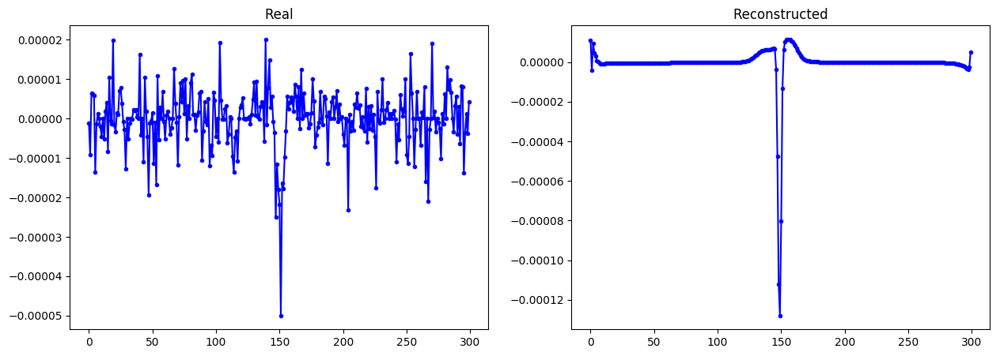

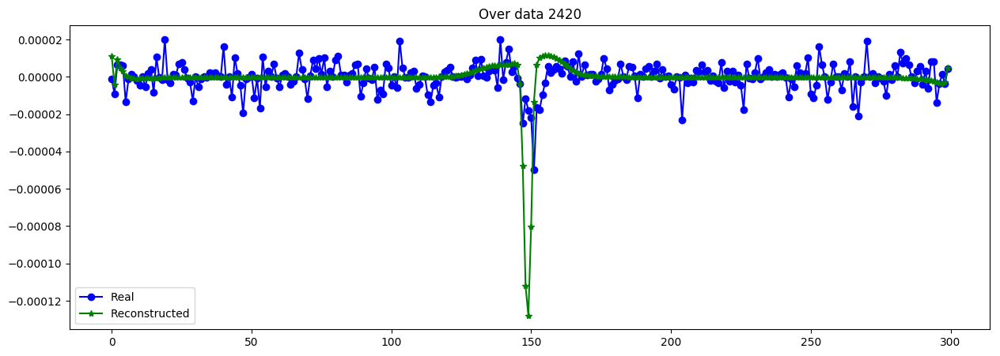

----------------------------------------------------------------
Real scale = 20424.122611
Pred scale = 2608.849365


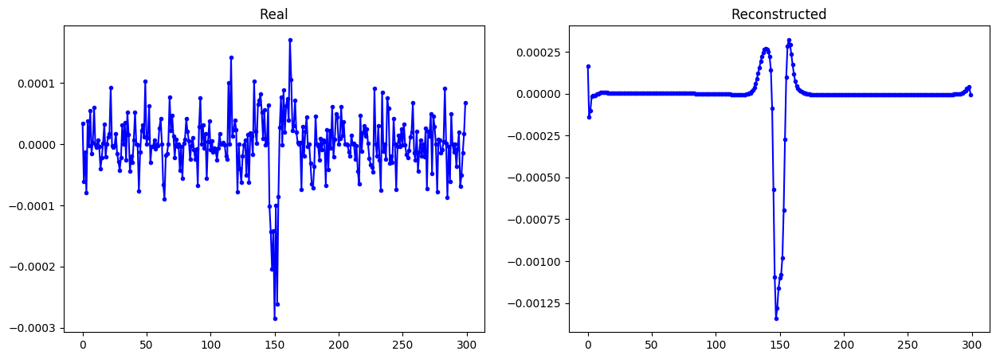

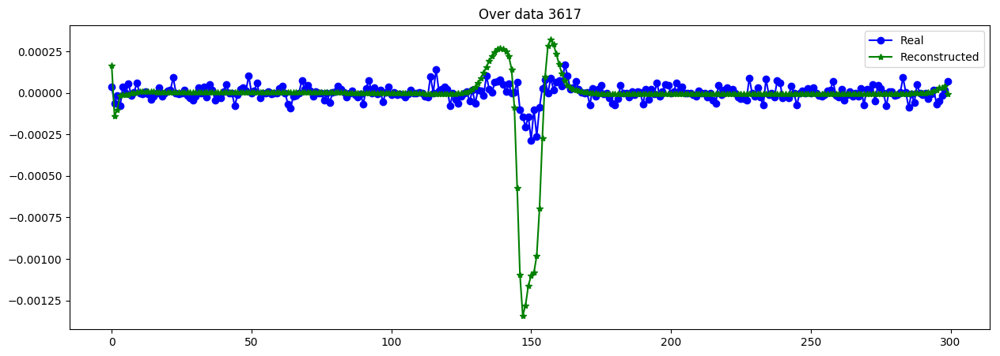

----------------------------------------------------------------
Real scale = 59557.145754
Pred scale = 22492.351562


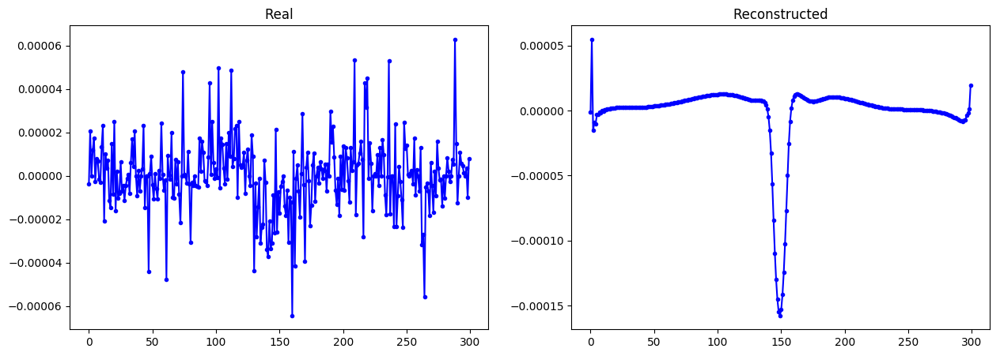

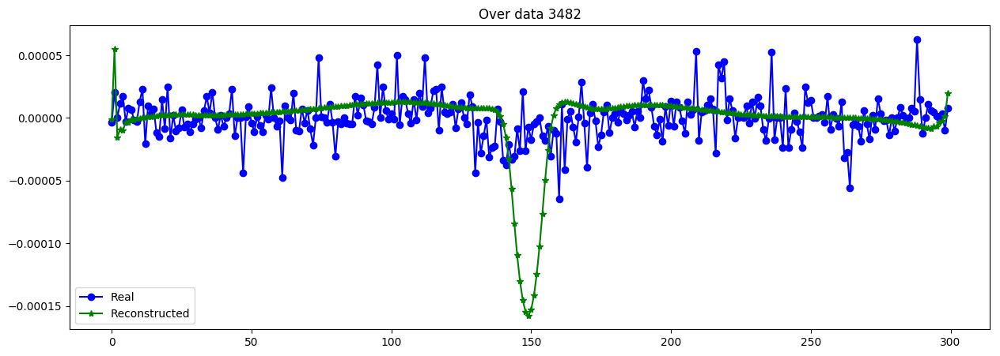

----------------------------------------------------------------
Real scale = 37615.098158
Pred scale = 128841.867188


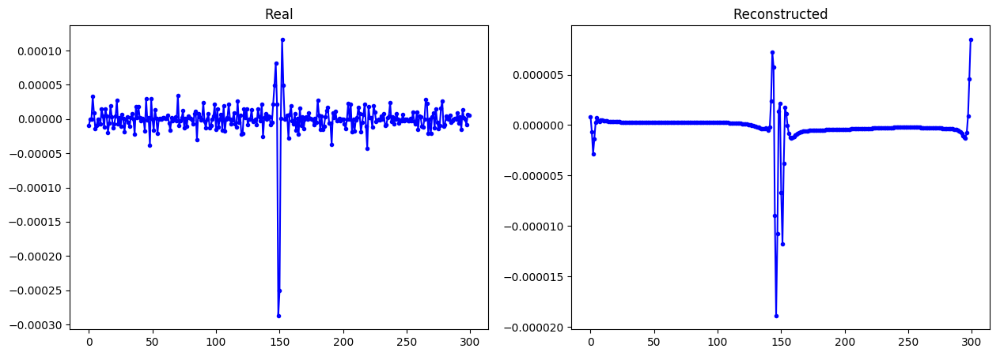

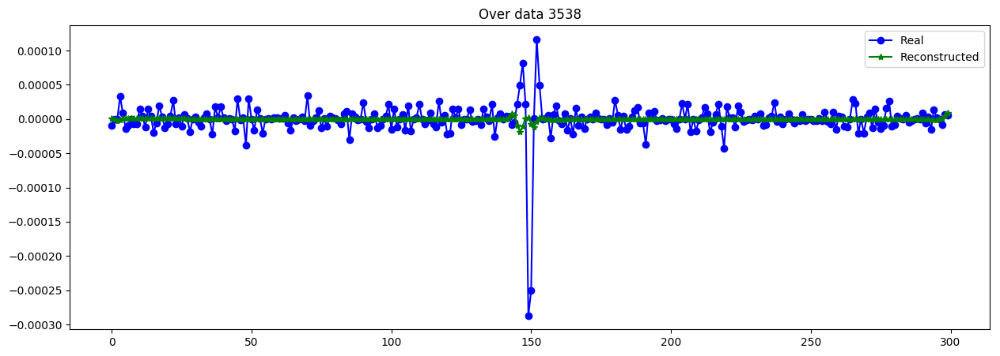

----------------------------------------------------------------
Real scale = 19080.657226
Pred scale = 19545.925781


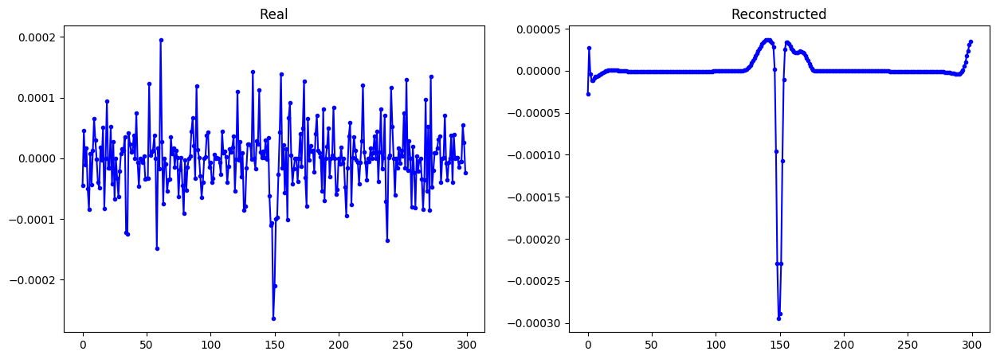

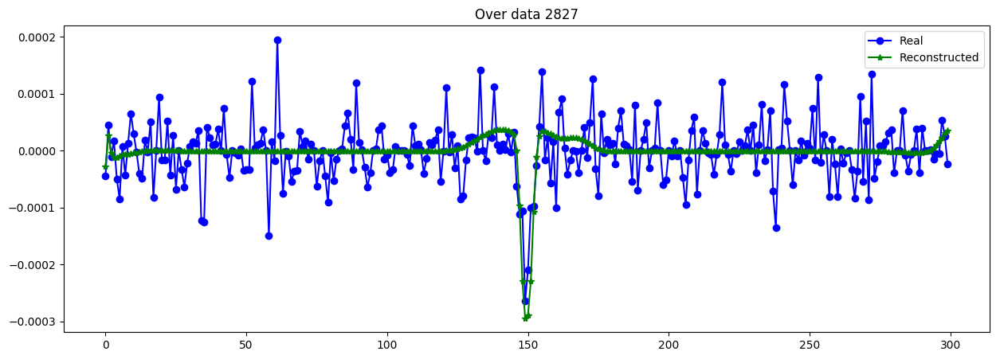

----------------------------------------------------------------
Real scale = 92414.291370
Pred scale = 1282.988159


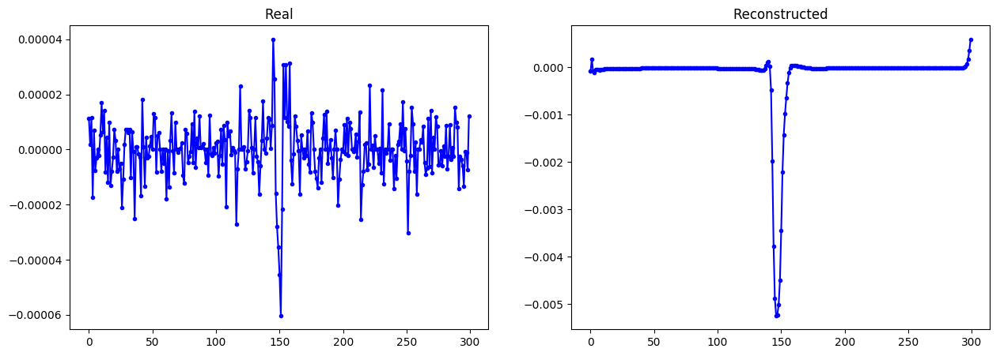

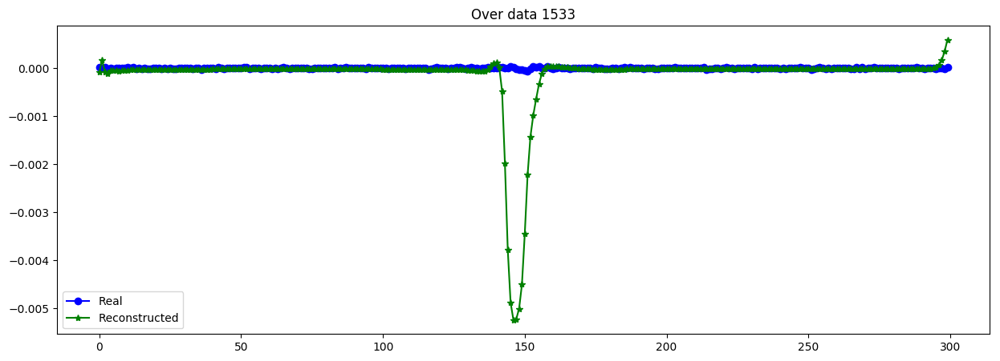

----------------------------------------------------------------
Real scale = 4896.937444
Pred scale = 528.288147


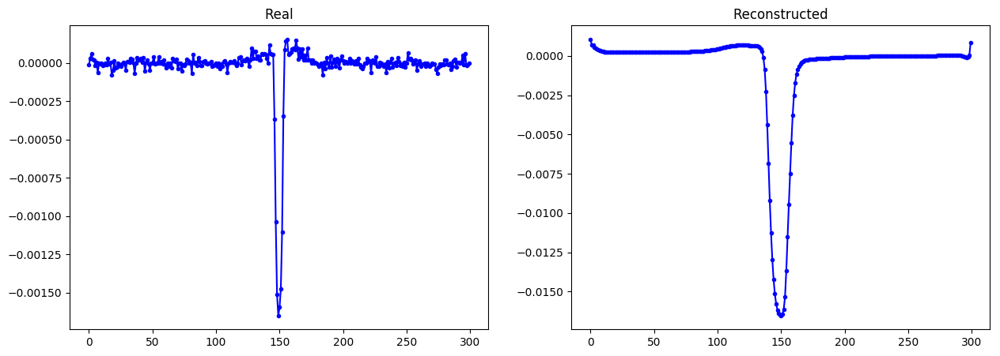

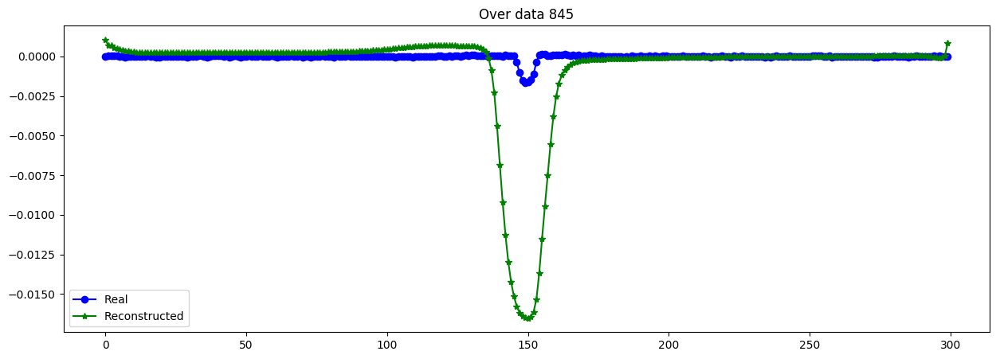

----------------------------------------------------------------
Real scale = 73220.212151
Pred scale = 6905.238281


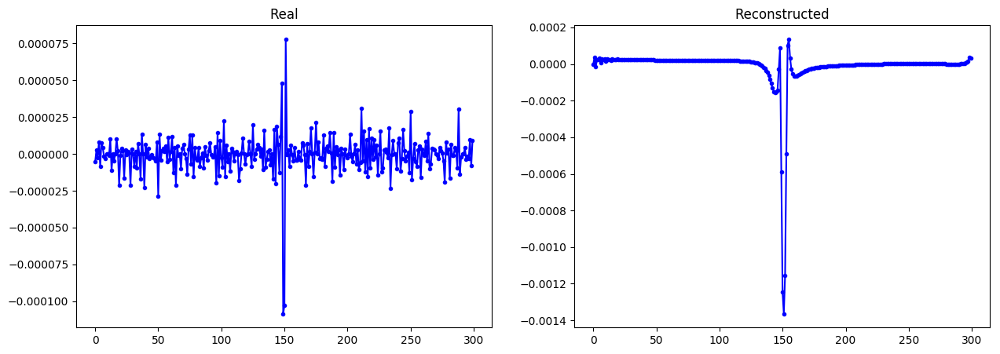

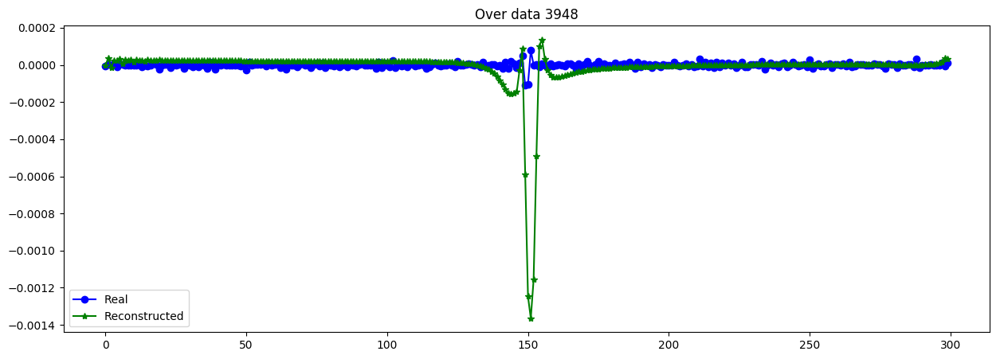

----------------------------------------------------------------
Real scale = 41896.815603
Pred scale = 26499.386719


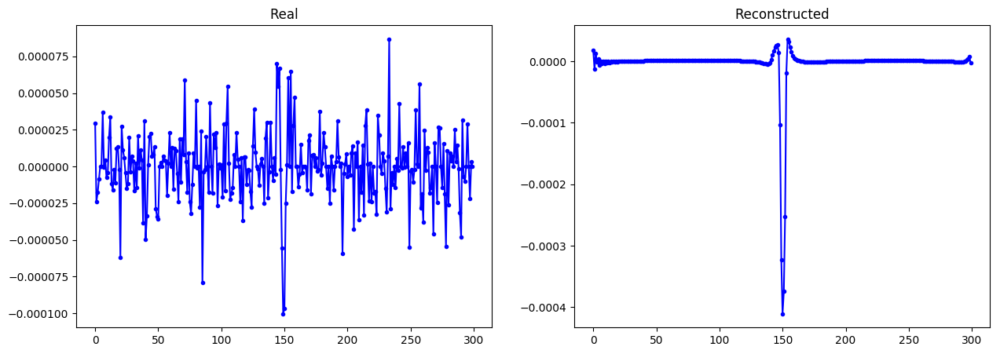

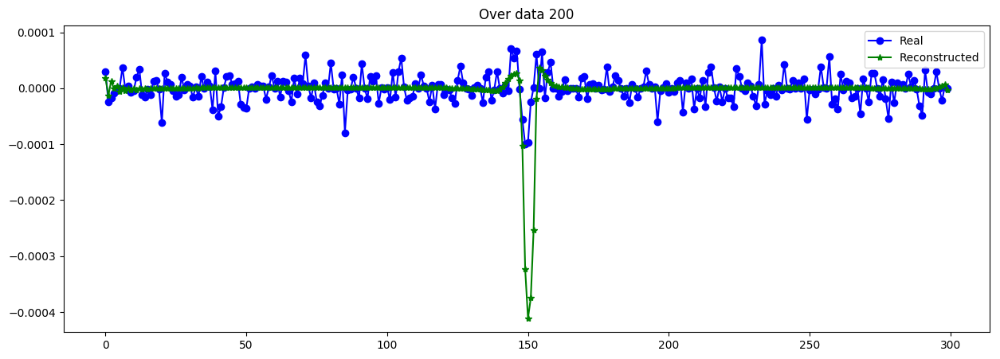

----------------------------------------------------------------
Real scale = 28678.851326
Pred scale = 18493.199219


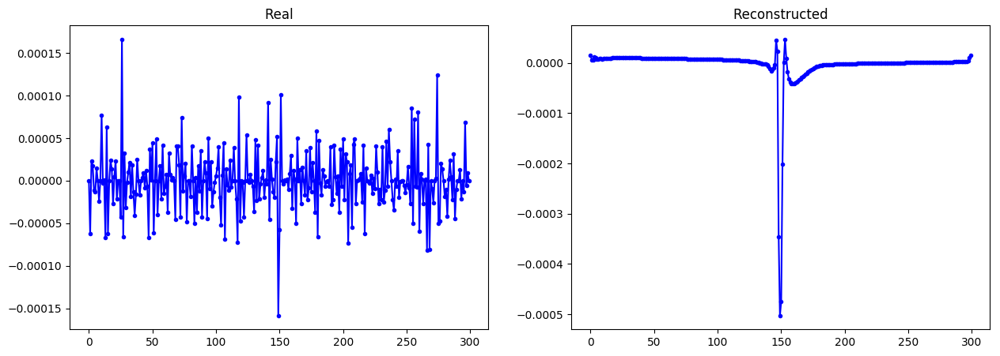

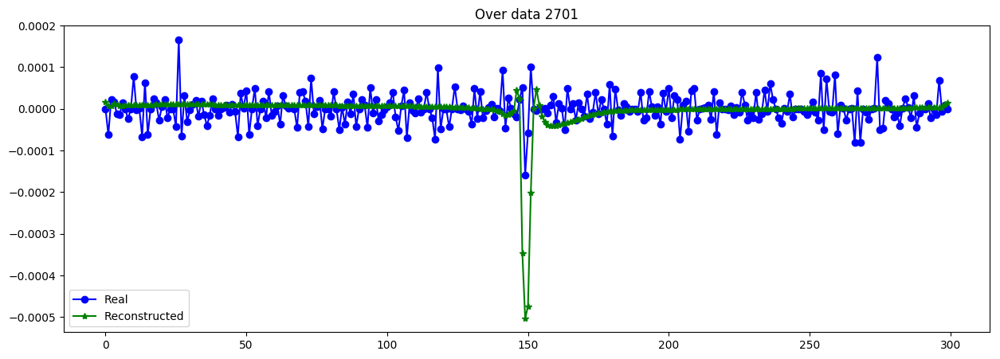

----------------------------------------------------------------
Real scale = 10048.952334
Pred scale = 482634.531250


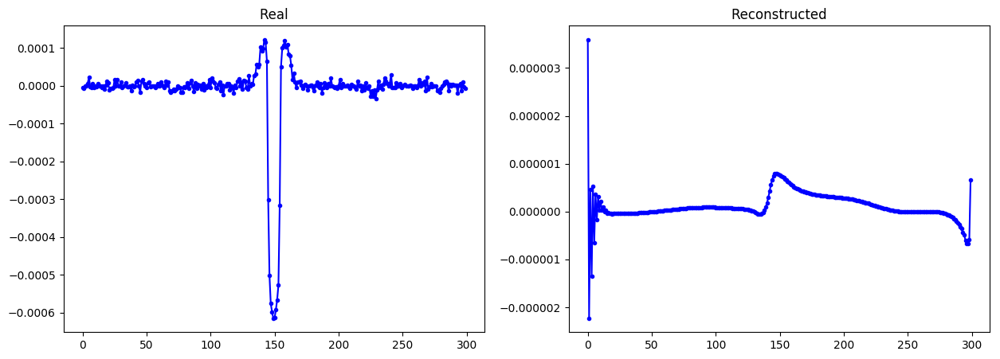

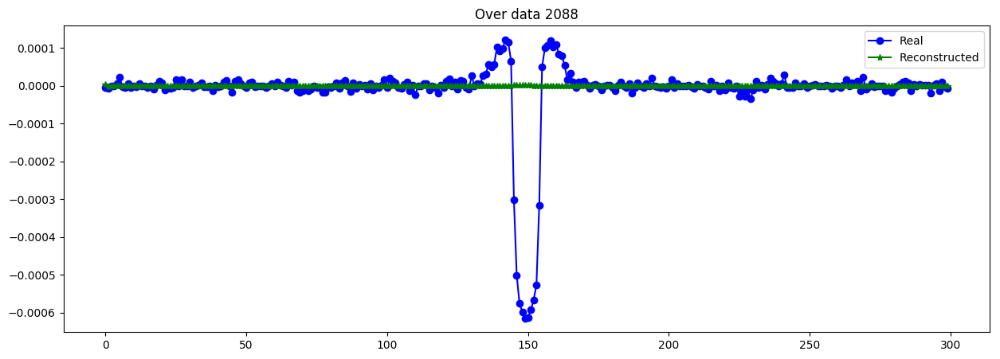

----------------------------------------------------------------
Real scale = 43352.048202
Pred scale = 14092.993164


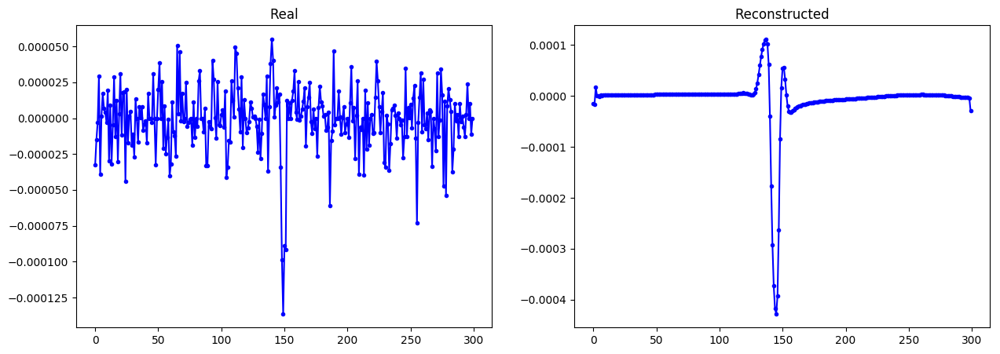

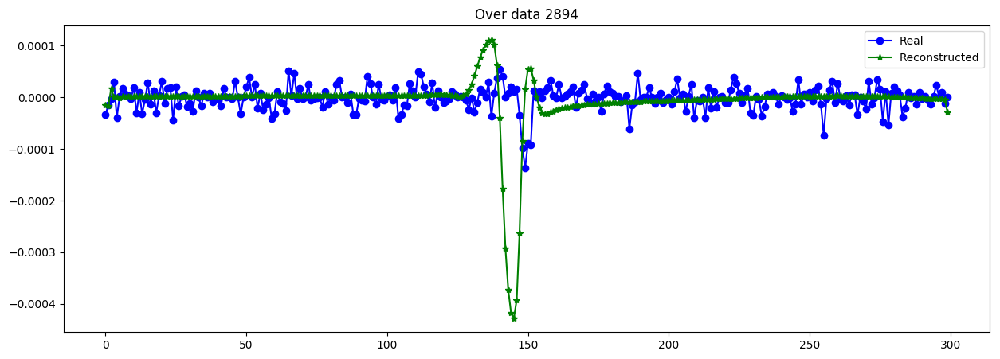

----------------------------------------------------------------


In [30]:
evaluate_reconst(X_data[:N_trans,:]*Sinv_data[:N_trans,None], X_data_CVAE*Sinv_data_hat[:N_trans,None])

evaluate_reconst(X_data[:N_trans,:]*Sinv_data[:N_trans,None], X_data_CVAE*Sinv_data[:N_trans,None])
print("MSE de escala escalado= ",mean_squared_error(Sinv_data[:N_trans],Sinv_data_hat)*(1/Sinv_std)**2)

plot_n_lc(X_data[:N_trans], X_data_CVAE, n= 15, s=[Sinv_data[:N_trans],Sinv_data_hat]) #as MA-1

----- EVALUANDO RECONSTRUCCION DE LA CURVA -----


/home/casapanshop/anaconda2/envs/py3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


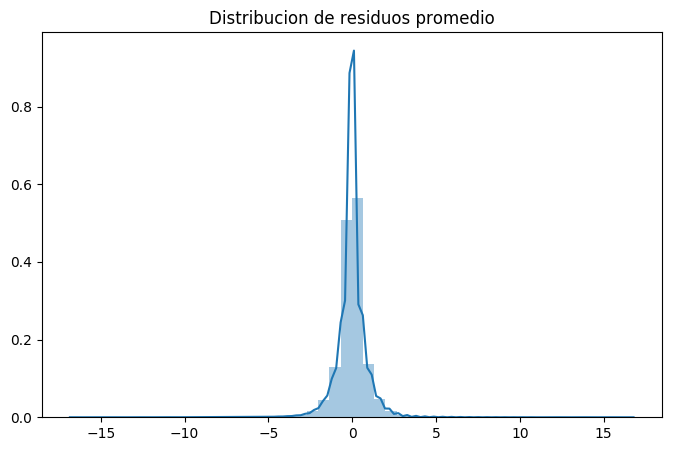

MSE      =  0.9173321150954626
RMSE (+-)=  0.9448783374773474
MAE  (+-)=  0.5593344233043257
--------- Smoothness ------------
AutoCorr lag-one =  0.7141963
Diff MEAN =  0.04232943
Diff STD =  0.20460504
--------- Smoothness ------------
----- EVALUANDO RECONSTRUCCION DE LA CURVA -----


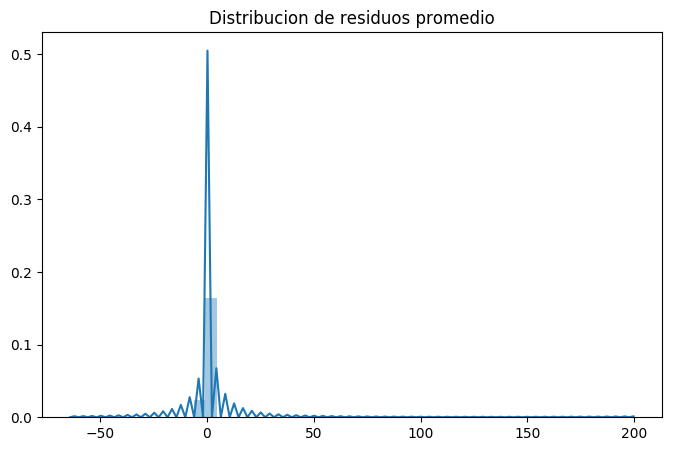

MSE      =  2.237332374671249
RMSE (+-)=  1.1045389587212067
MAE  (+-)=  0.6067760713563233
--------- Smoothness ------------
AutoCorr lag-one =  0.71419636217081
Diff MEAN =  0.053381425939878255
Diff STD =  0.2541161235303527
--------- Smoothness ------------
MSE de escala escalado=  0.8948951090317405
Real scale = 134068.231723
Pred scale = 113406.468750


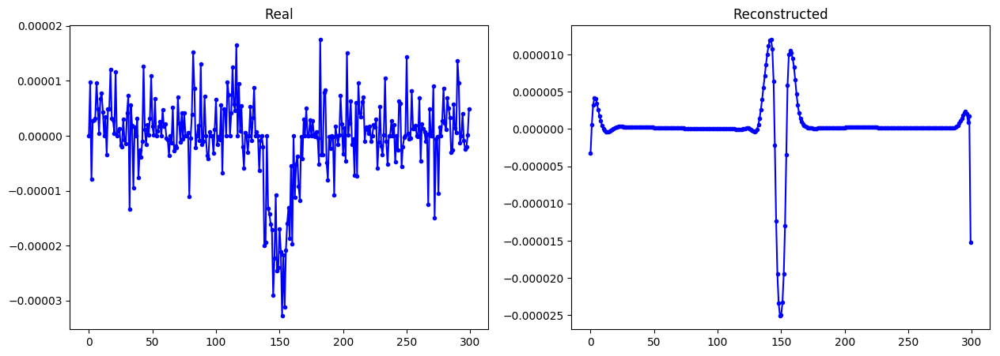

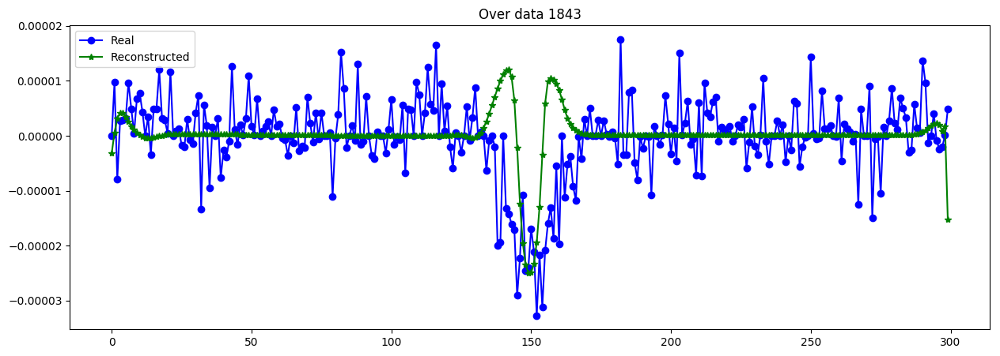

----------------------------------------------------------------
Real scale = 968.377305
Pred scale = 3162.969482


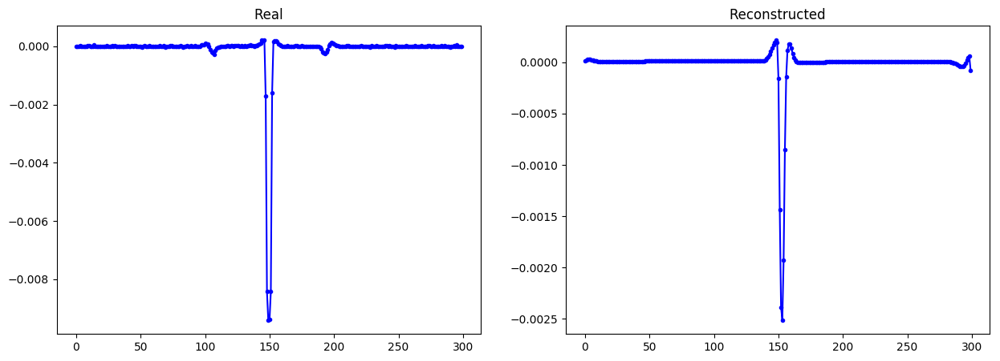

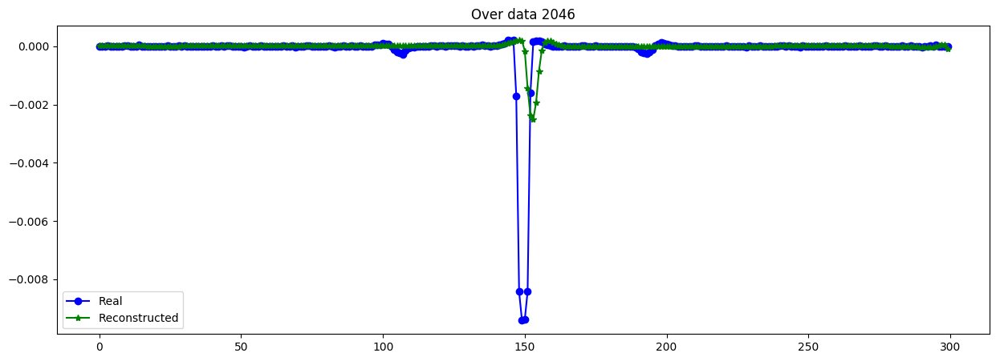

----------------------------------------------------------------
Real scale = 15306.009368
Pred scale = 13609.329102


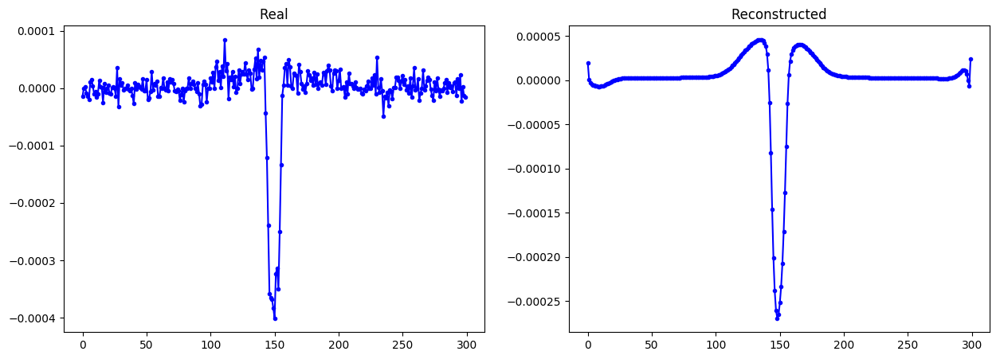

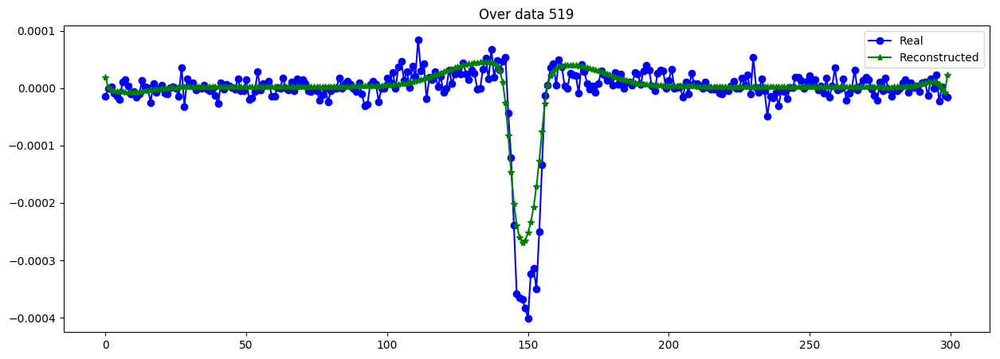

----------------------------------------------------------------
Real scale = 6044.207275
Pred scale = 9525.192383


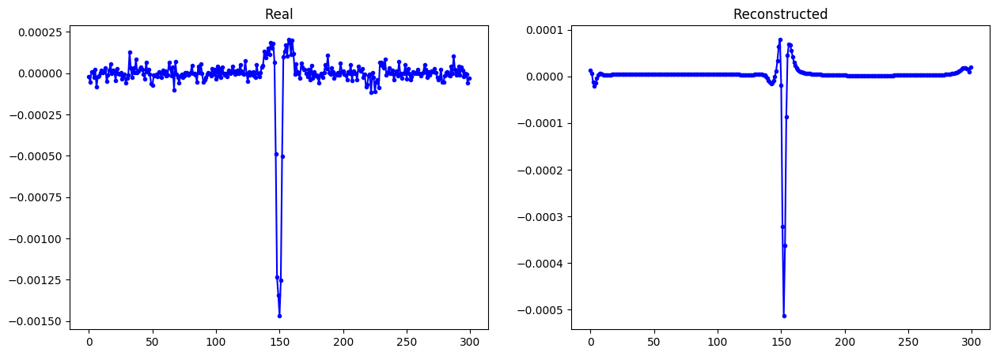

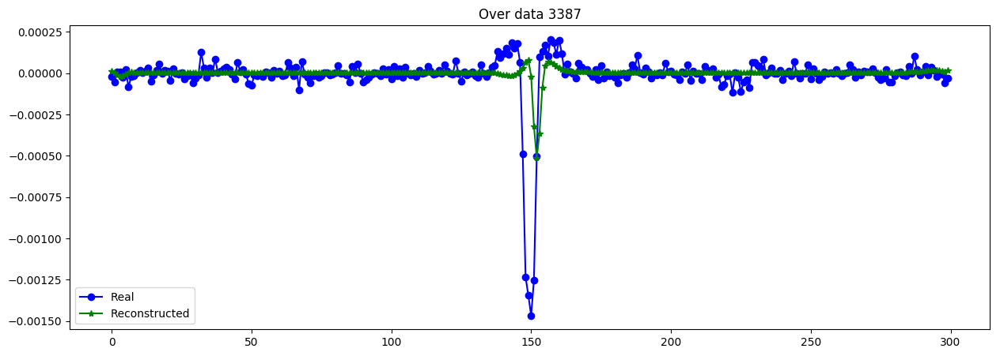

----------------------------------------------------------------
Real scale = 25815.640193
Pred scale = 50456.179688


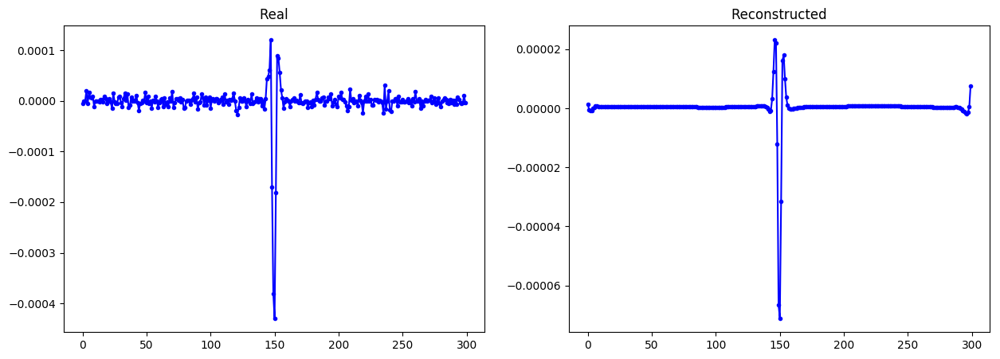

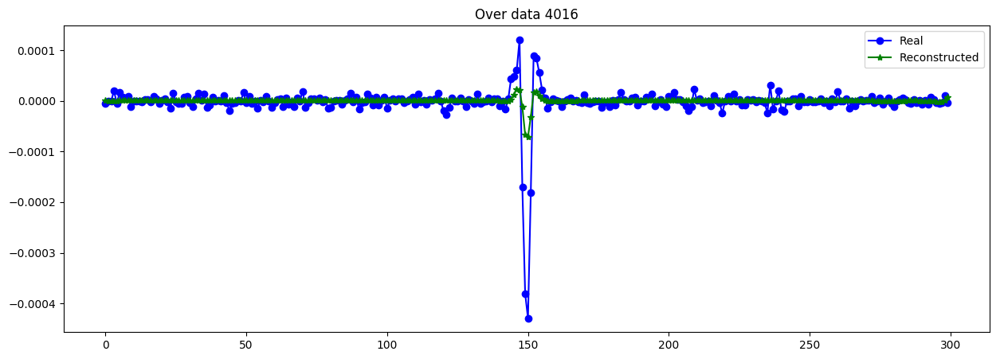

----------------------------------------------------------------
Real scale = 48805.394523
Pred scale = 157593.578125


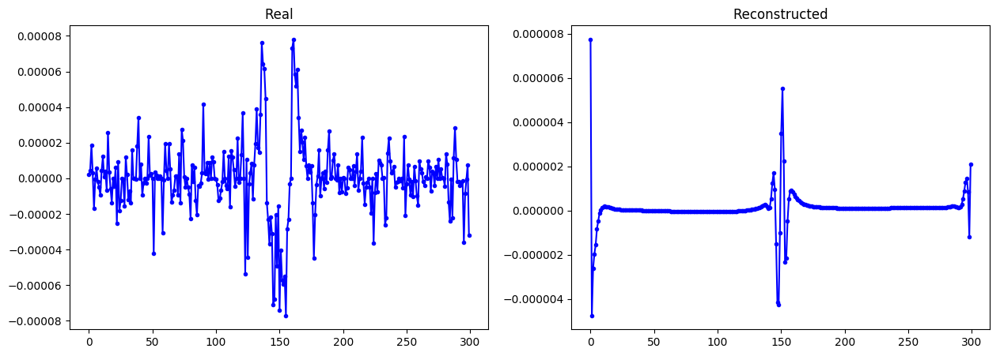

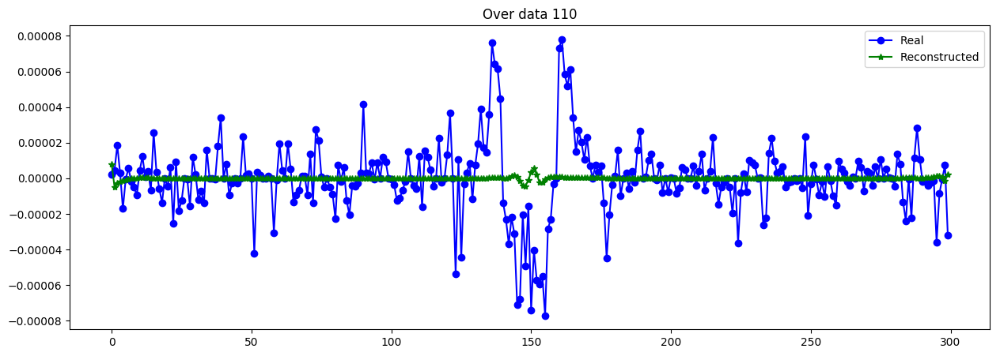

----------------------------------------------------------------
Real scale = 88817.716276
Pred scale = 164581.390625


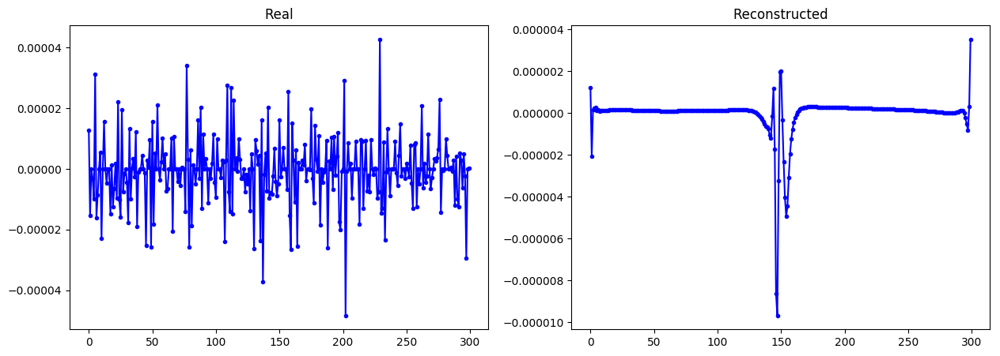

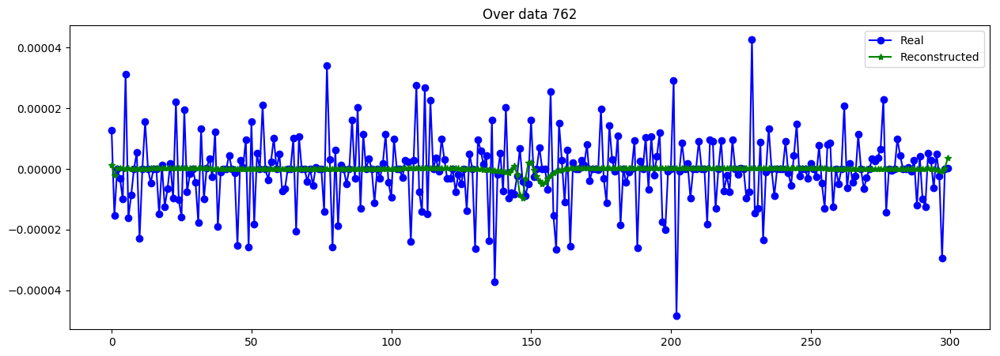

----------------------------------------------------------------
Real scale = 45997.834949
Pred scale = 17784.513672


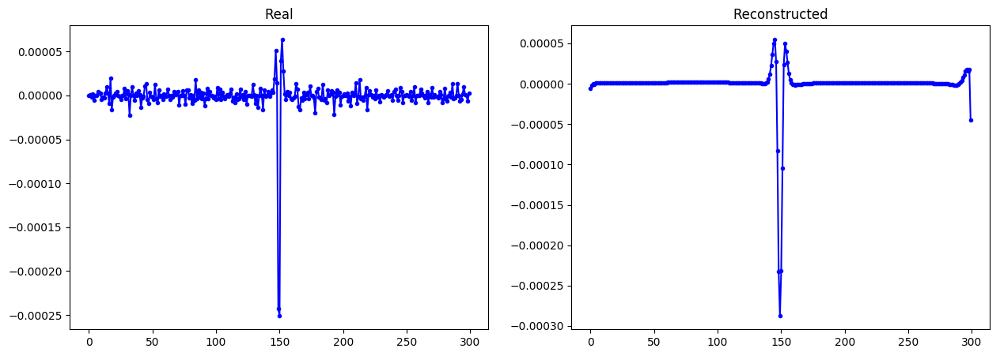

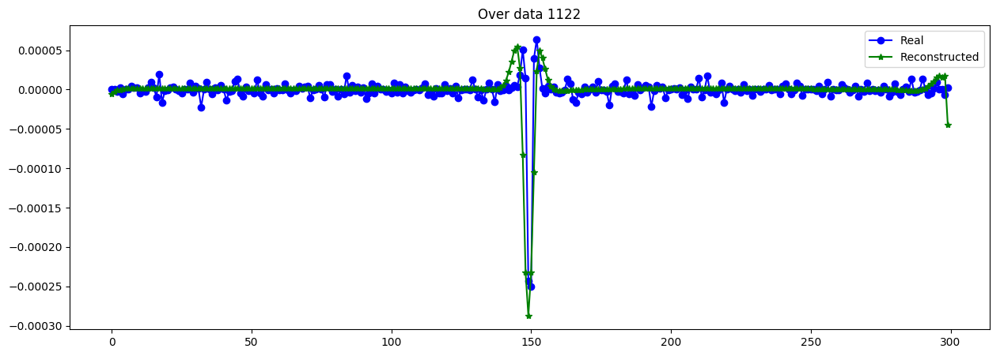

----------------------------------------------------------------
Real scale = 62255.394896
Pred scale = 54302.902344


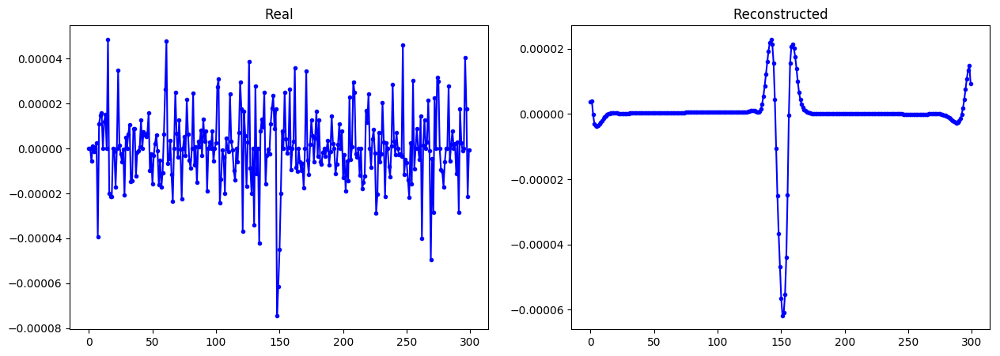

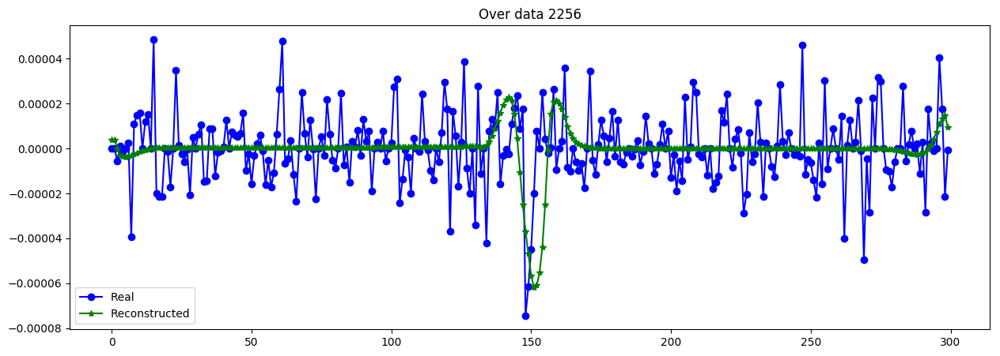

----------------------------------------------------------------
Real scale = 6460.867690
Pred scale = 32632.136719


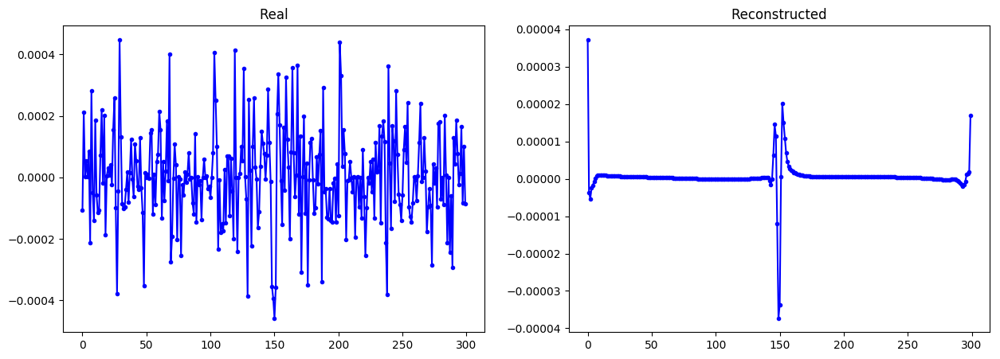

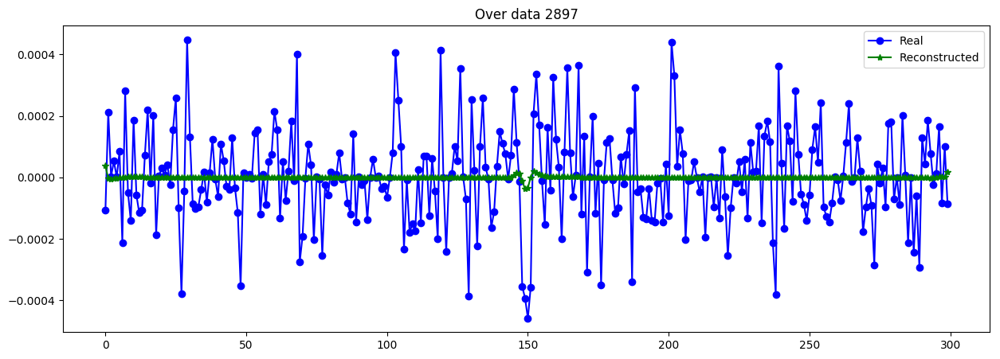

----------------------------------------------------------------
Real scale = 58978.360880
Pred scale = 46496.472656


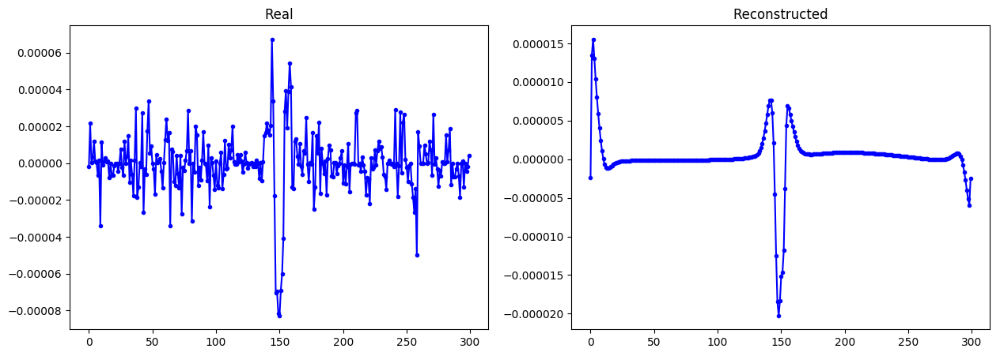

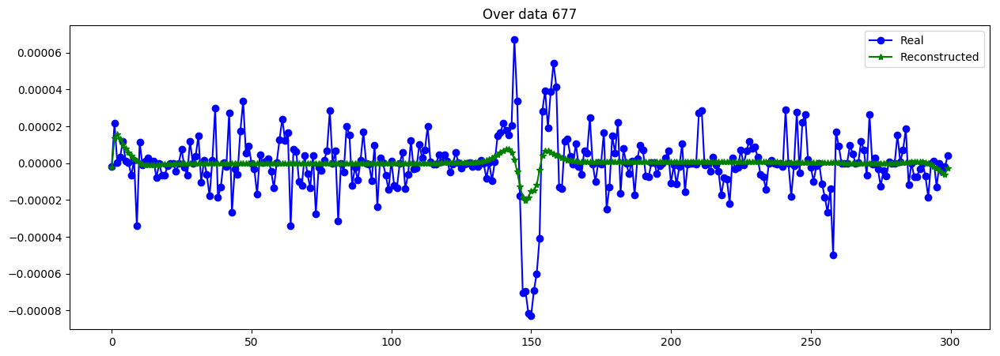

----------------------------------------------------------------
Real scale = 30001.862310
Pred scale = 76413.148438


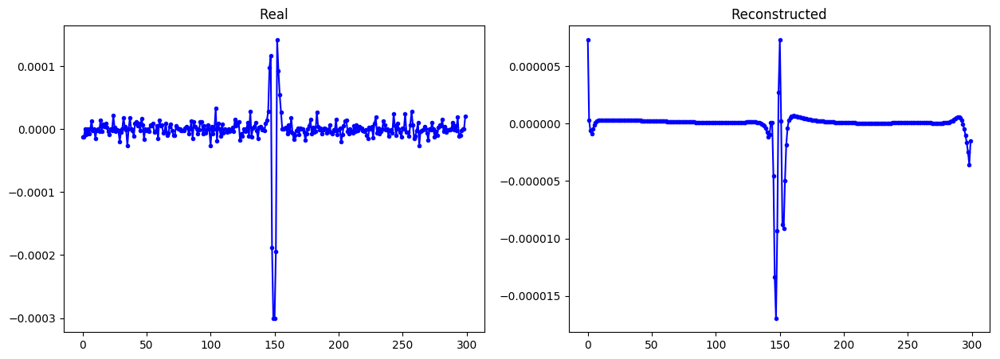

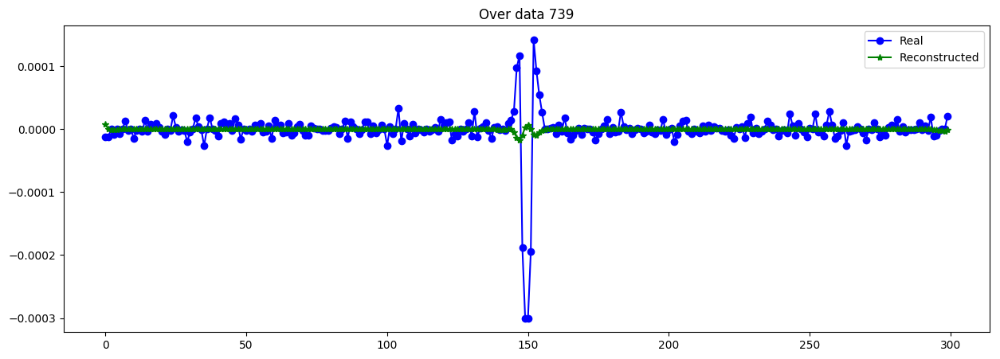

----------------------------------------------------------------
Real scale = 26867.779276
Pred scale = 32250.904297


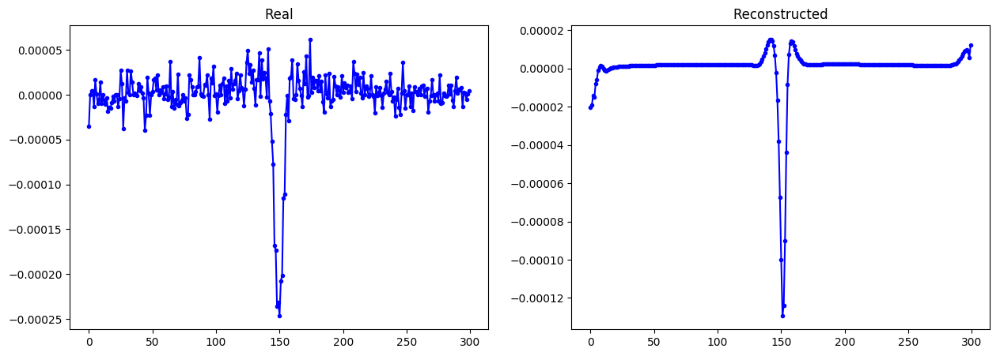

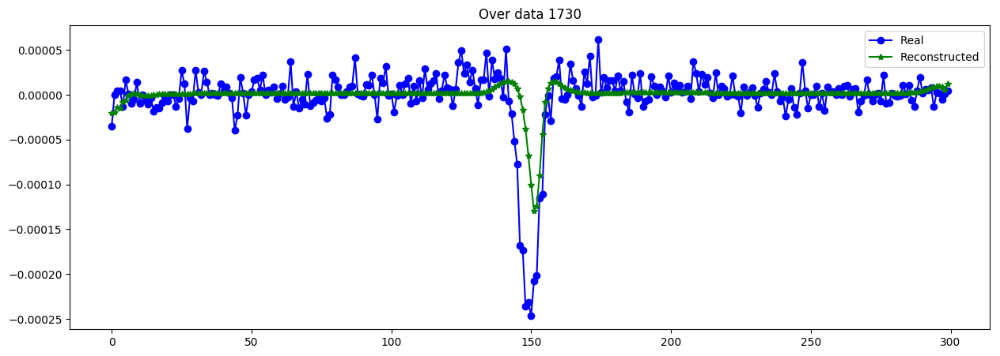

----------------------------------------------------------------
Real scale = 64368.928502
Pred scale = 88639.109375


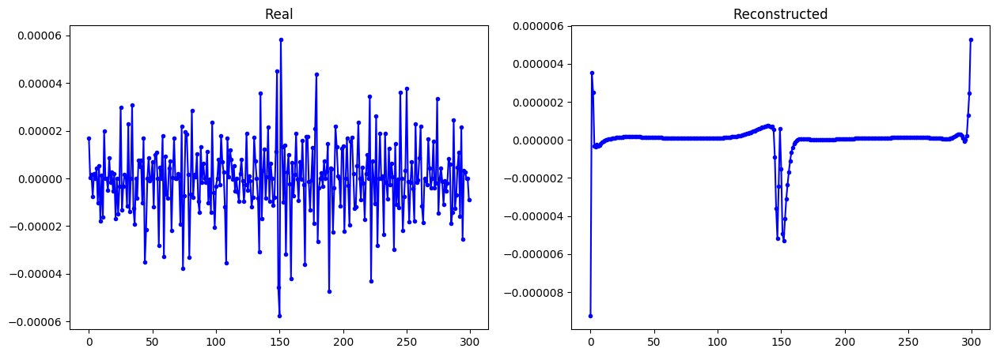

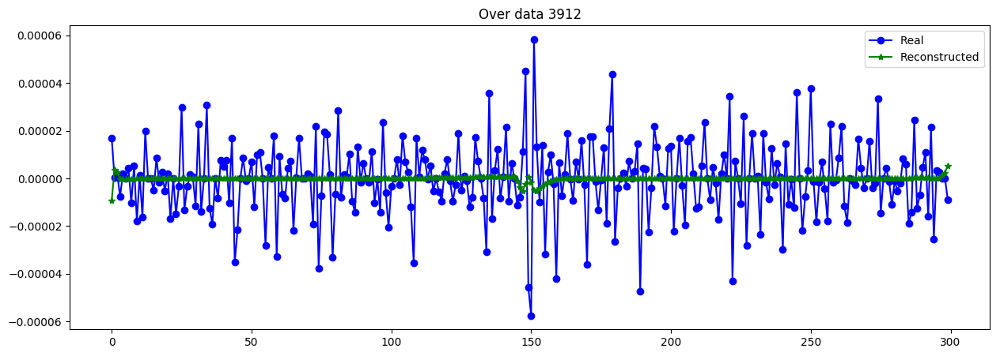

----------------------------------------------------------------
Real scale = 11588.331000
Pred scale = 28779.000000


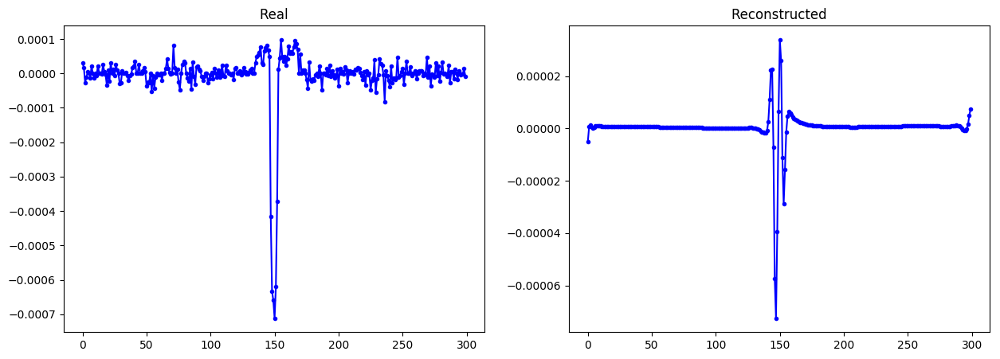

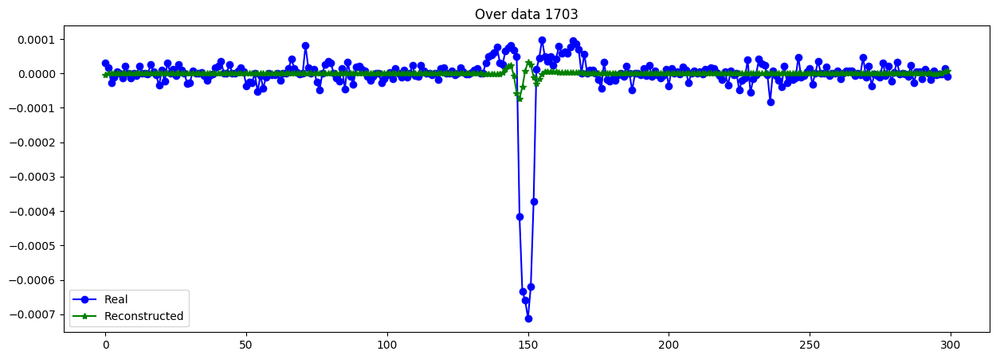

----------------------------------------------------------------


In [23]:
evaluate_reconst(X_data[:N_trans,:]*Sinv_data[:N_trans,None], X_data_CVAE*Sinv_data_hat[:N_trans,None])

evaluate_reconst(X_data[:N_trans,:]*Sinv_data[:N_trans,None], X_data_CVAE*Sinv_data[:N_trans,None])
print("MSE de escala escalado= ",mean_squared_error(Sinv_data[:N_trans],Sinv_data_hat)*(1/Sinv_std)**2)

plot_n_lc(X_data[:N_trans], X_data_CVAE, n= 15, s=[Sinv_data[:N_trans],Sinv_data_hat]) #as MA-4

----- EVALUANDO RECONSTRUCCION DE LA CURVA -----


/home/casapanshop/anaconda2/envs/py3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


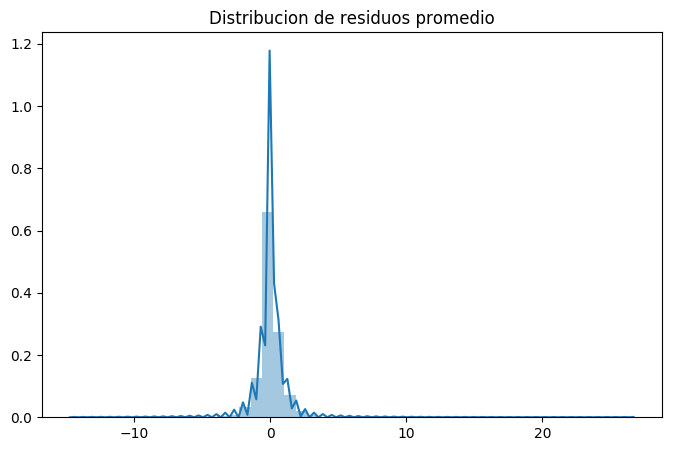

MSE      =  0.8796103116711402
RMSE (+-)=  0.9130729468231391
MAE  (+-)=  0.5528490254191792
--------- Smoothness ------------
AutoCorr lag-one =  0.70130575
Diff MEAN =  0.0659714
Diff STD =  0.34525266
--------- Smoothness ------------
----- EVALUANDO RECONSTRUCCION DE LA CURVA -----


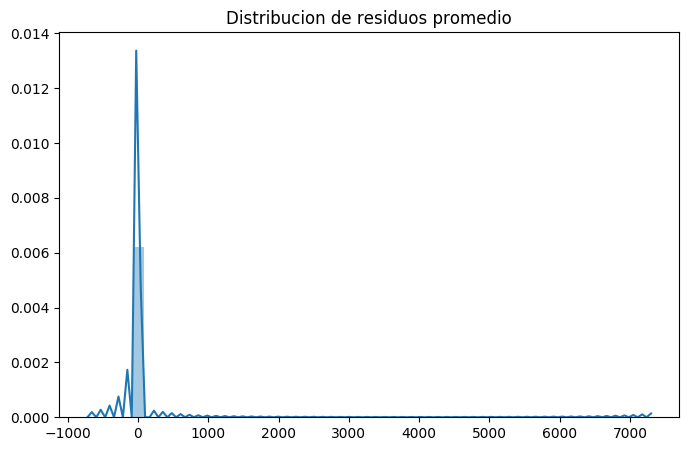

MSE      =  833.0675682424927
RMSE (+-)=  8.532281949716616
MAE  (+-)=  2.322427812434493
--------- Smoothness ------------
AutoCorr lag-one =  0.7013057498000189
Diff MEAN =  0.8236712520853903
Diff STD =  4.410318264138866
--------- Smoothness ------------
MSE de escala escalado=  6.627199553646824
Real scale = 81106.372968
Pred scale = 10867.914062


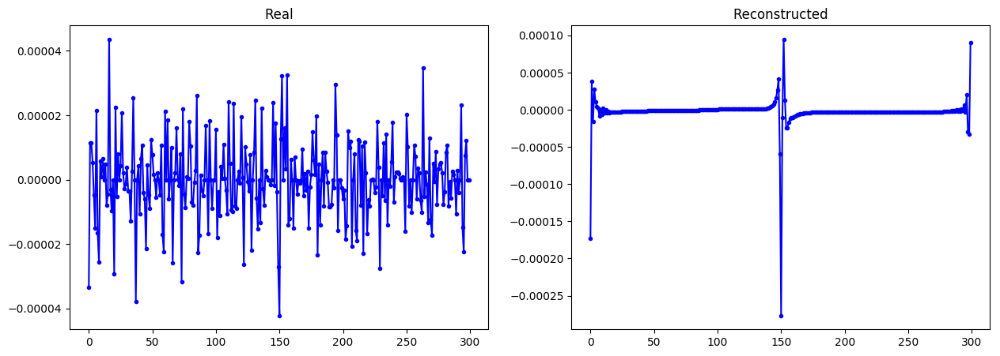

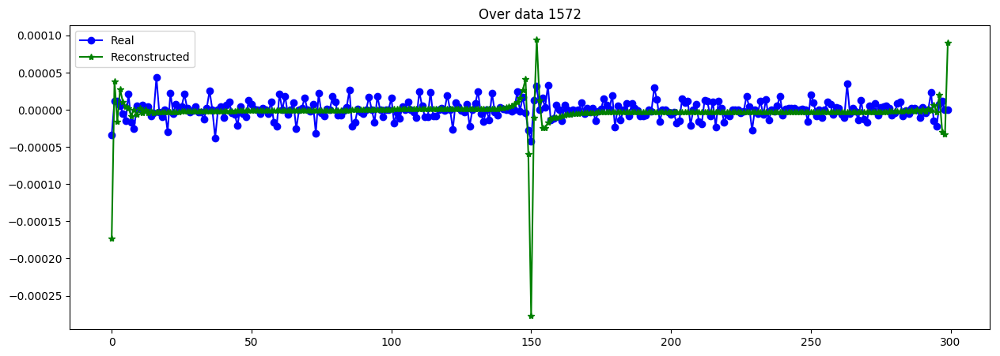

----------------------------------------------------------------
Real scale = 9223.377142
Pred scale = 318106.625000


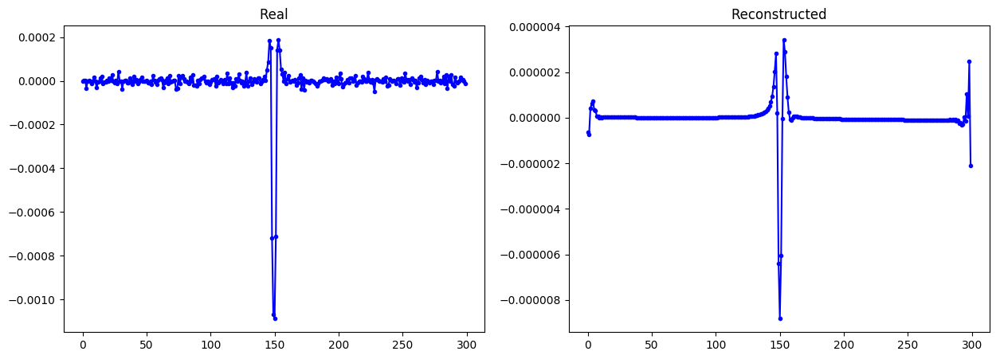

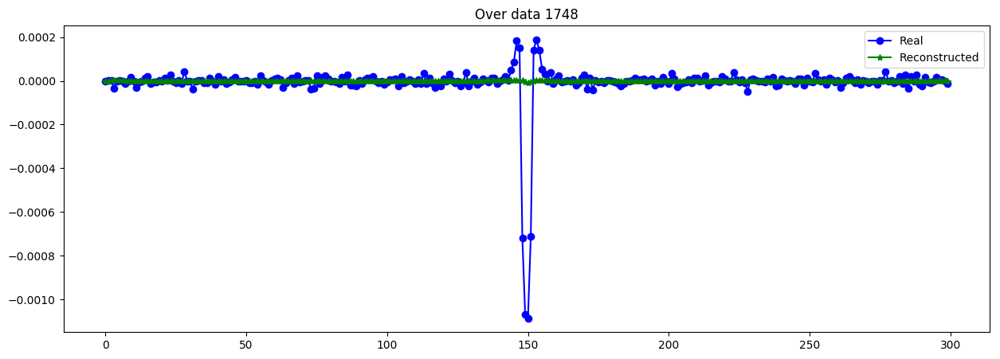

----------------------------------------------------------------
Real scale = 34135.335006
Pred scale = 38188.937500


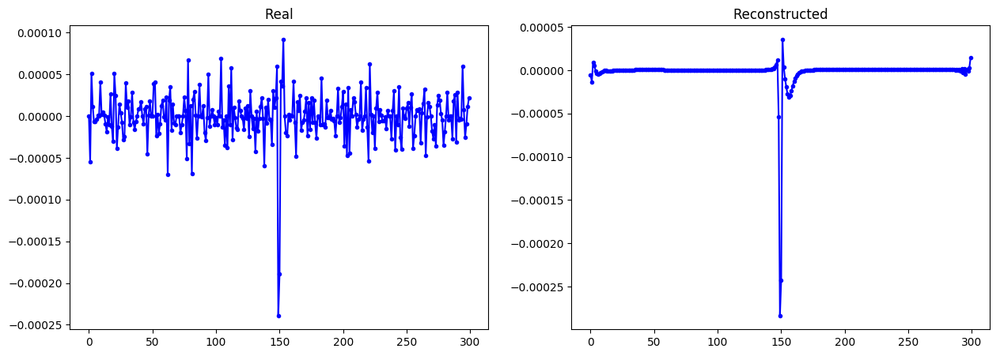

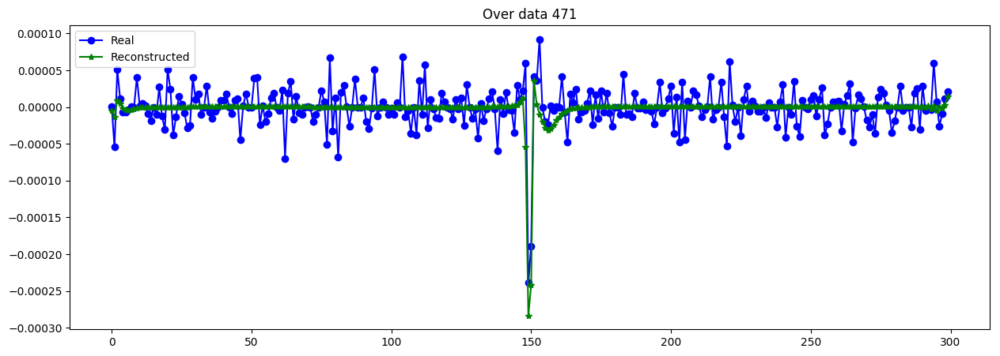

----------------------------------------------------------------
Real scale = 934.036125
Pred scale = 15905.563477


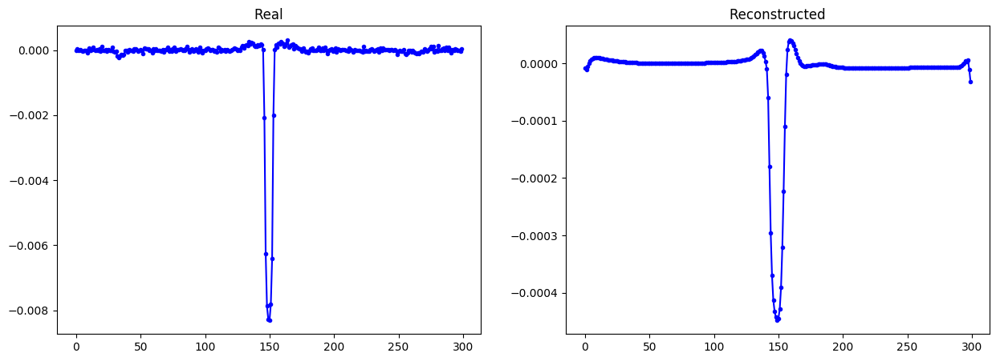

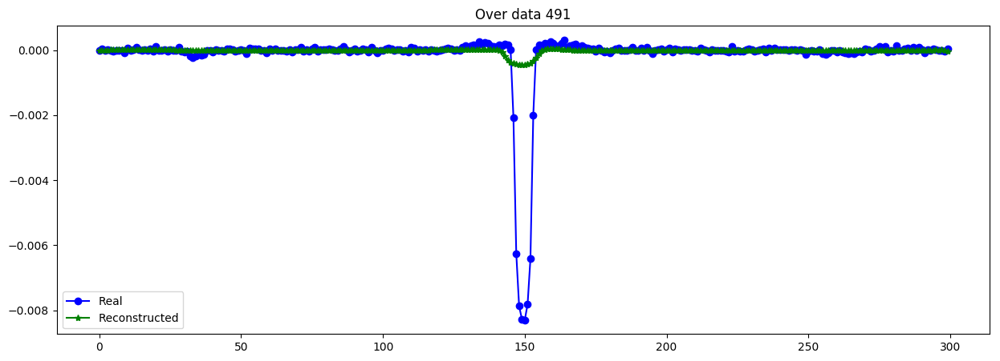

----------------------------------------------------------------
Real scale = 11300.697039
Pred scale = 13426.117188


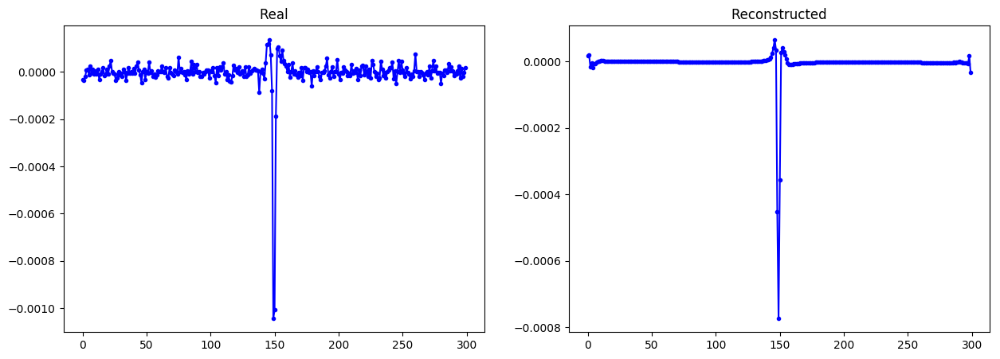

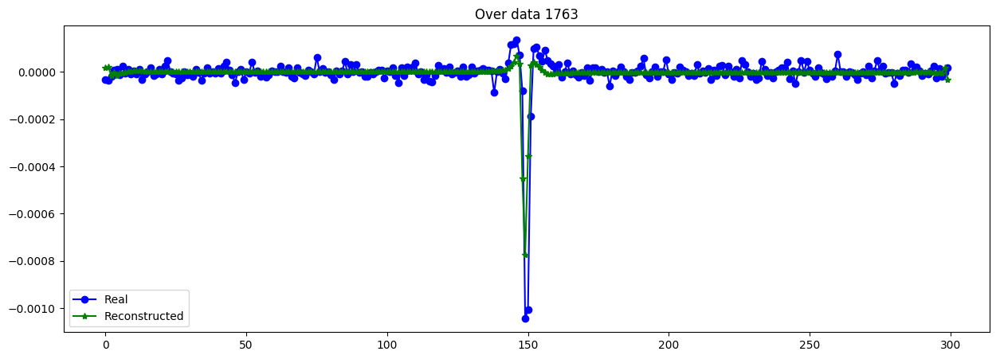

----------------------------------------------------------------
Real scale = 20648.686524
Pred scale = 294133.406250


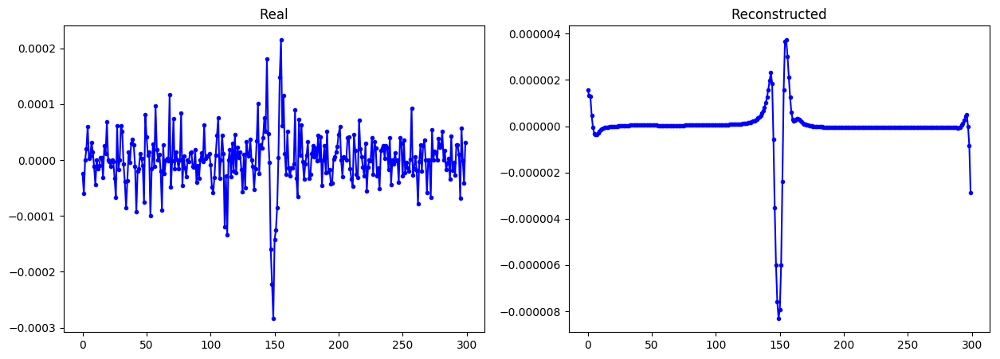

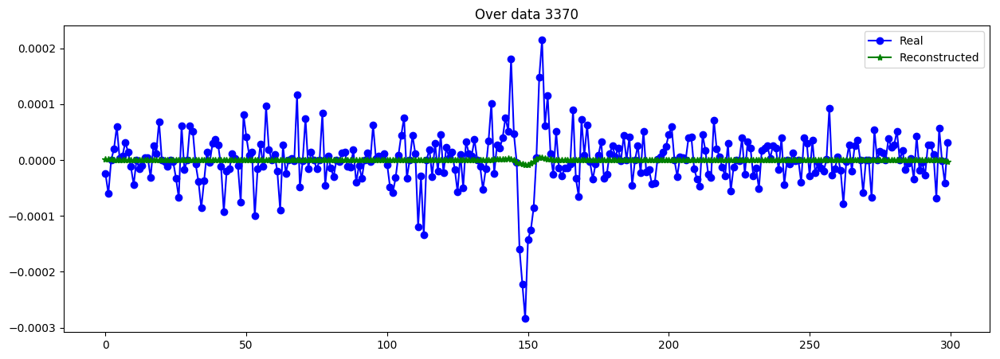

----------------------------------------------------------------
Real scale = 178412.755864
Pred scale = 4018.631104


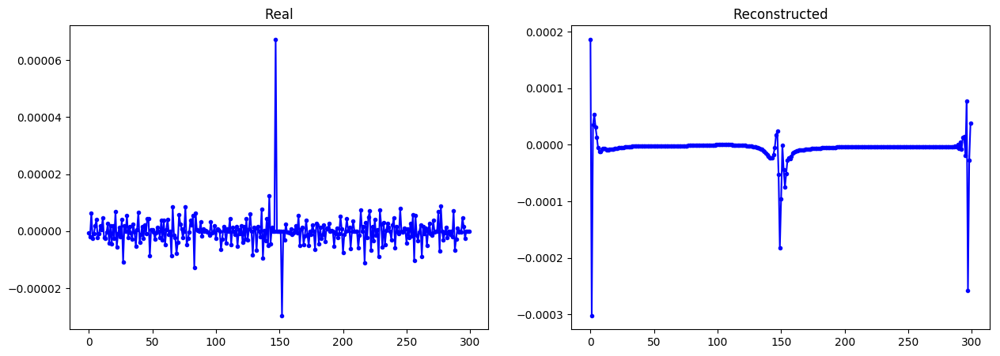

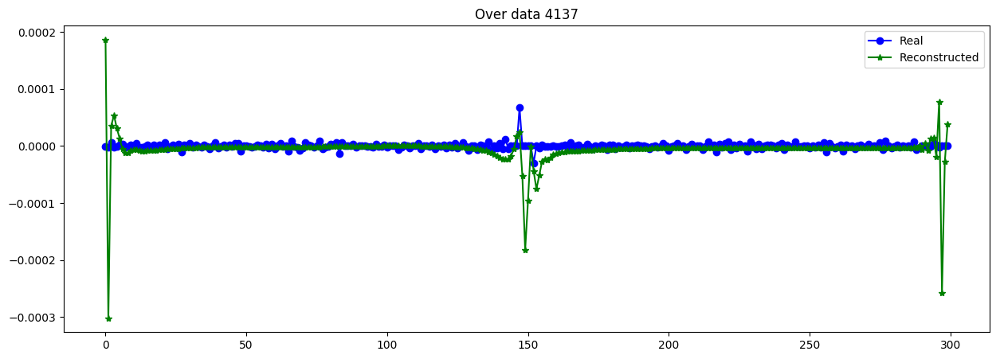

----------------------------------------------------------------
Real scale = 39048.904878
Pred scale = 28913.251953


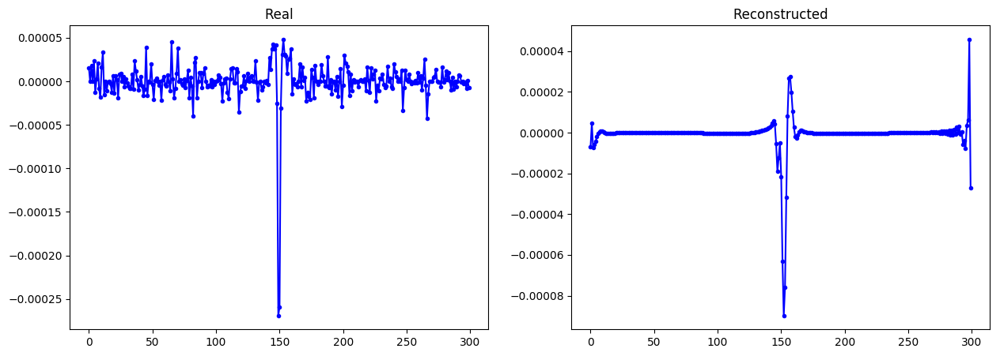

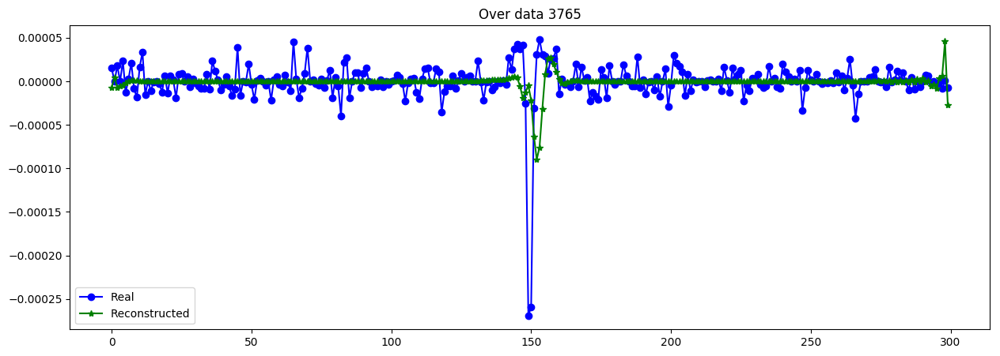

----------------------------------------------------------------
Real scale = 39736.989844
Pred scale = 14008.460938


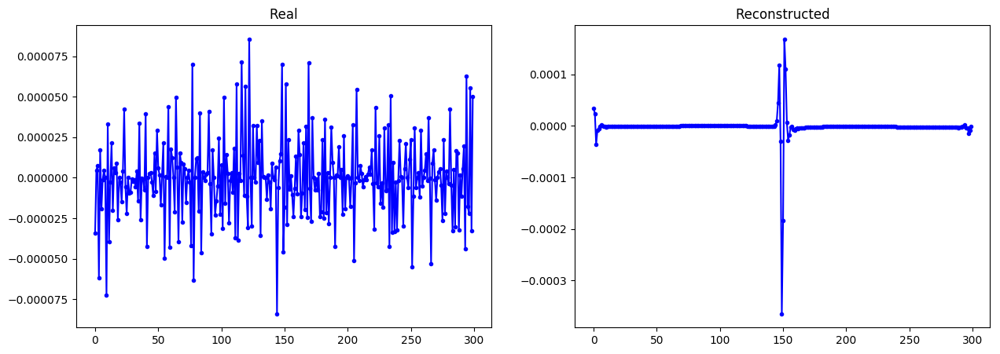

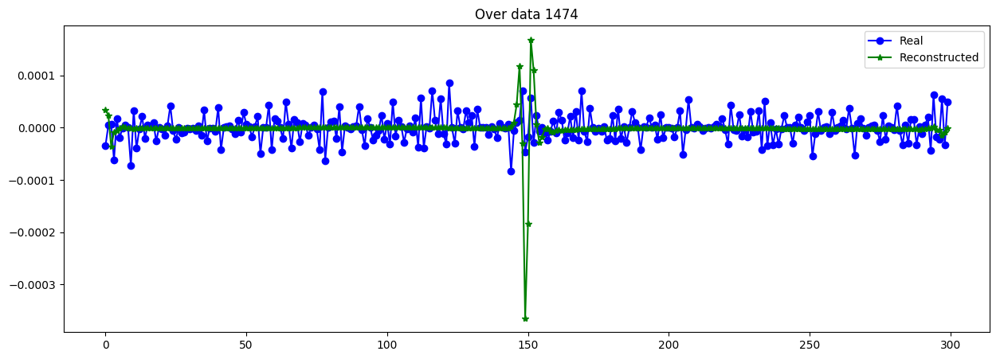

----------------------------------------------------------------
Real scale = 25509.593708
Pred scale = 348601.718750


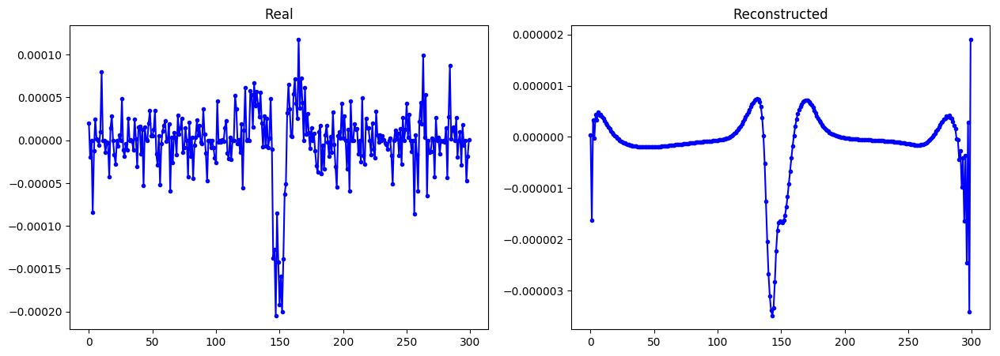

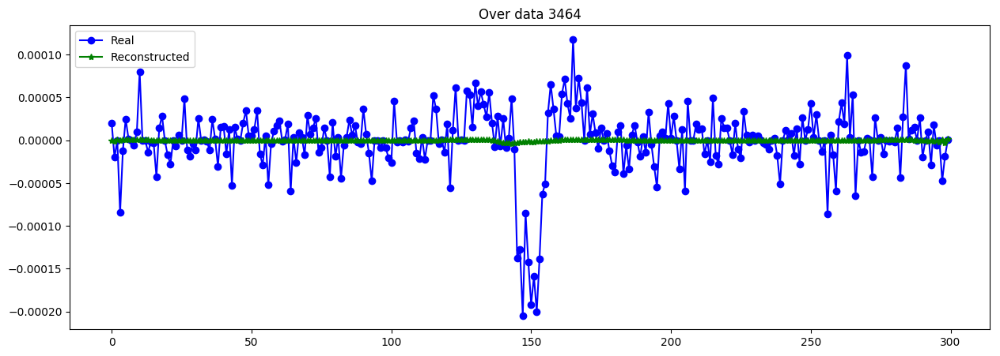

----------------------------------------------------------------
Real scale = 9458.065739
Pred scale = 114049.414062


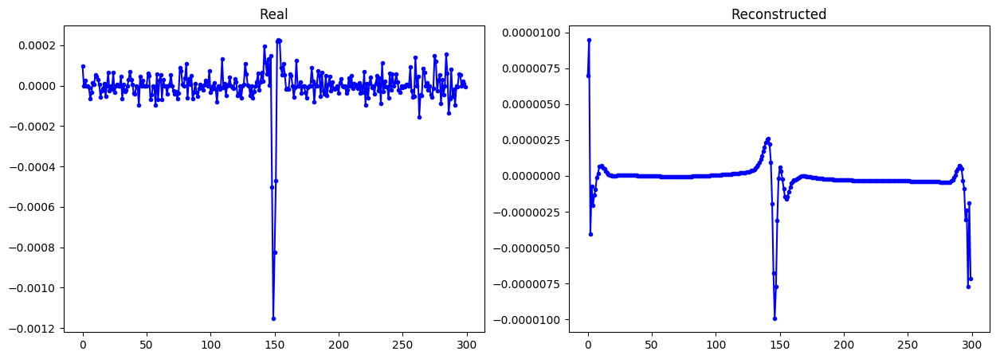

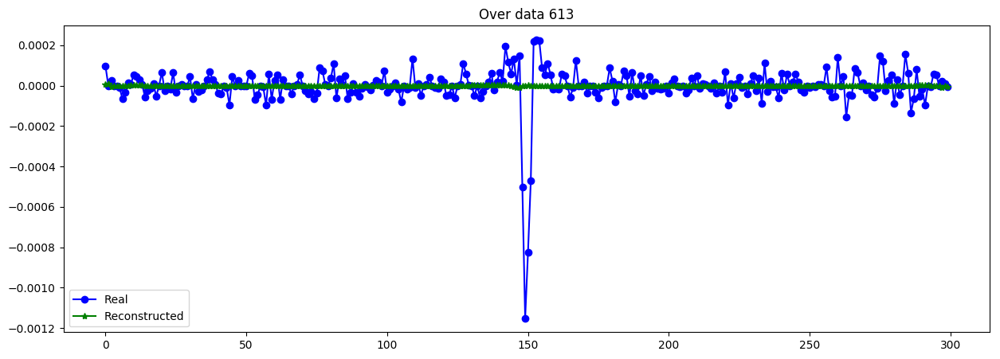

----------------------------------------------------------------
Real scale = 21720.297448
Pred scale = 24306.316406


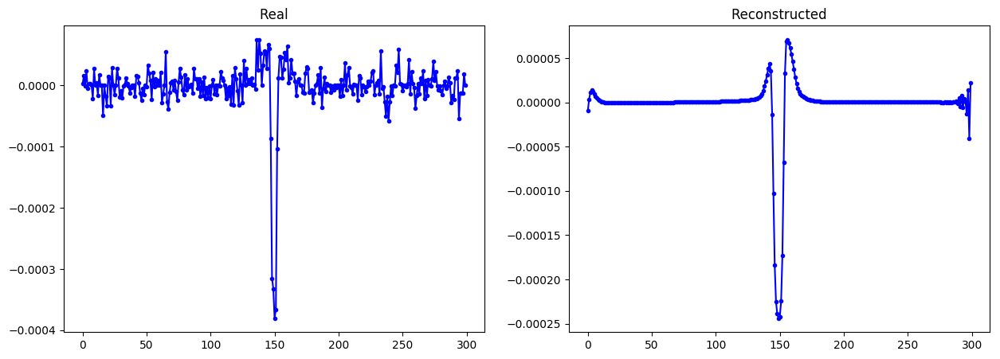

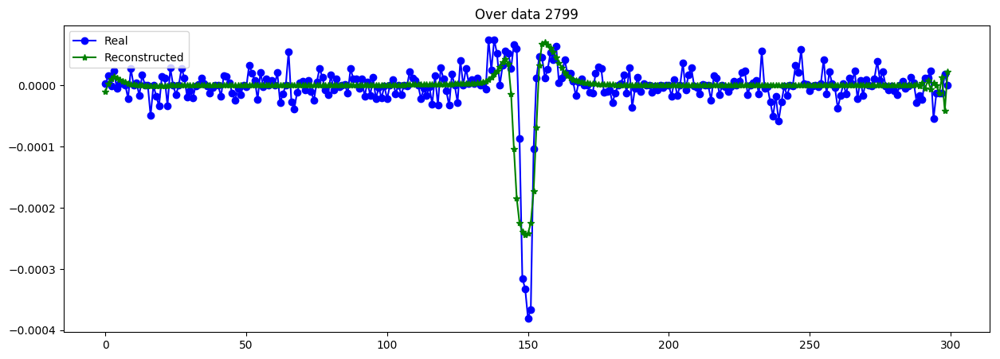

----------------------------------------------------------------
Real scale = 397231.171549
Pred scale = 9218.674805


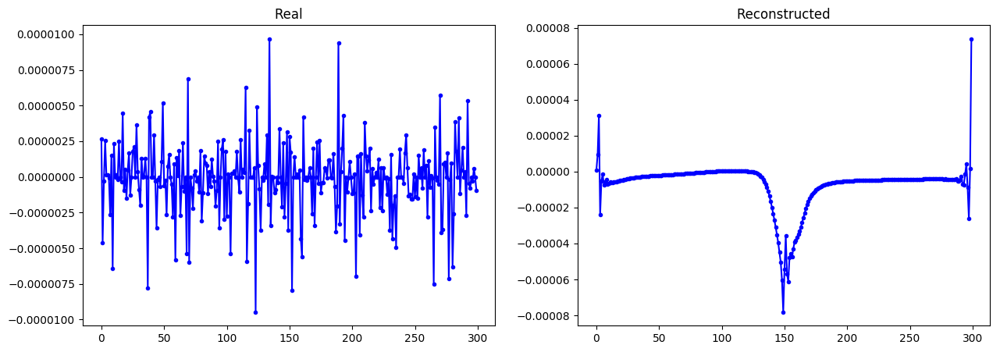

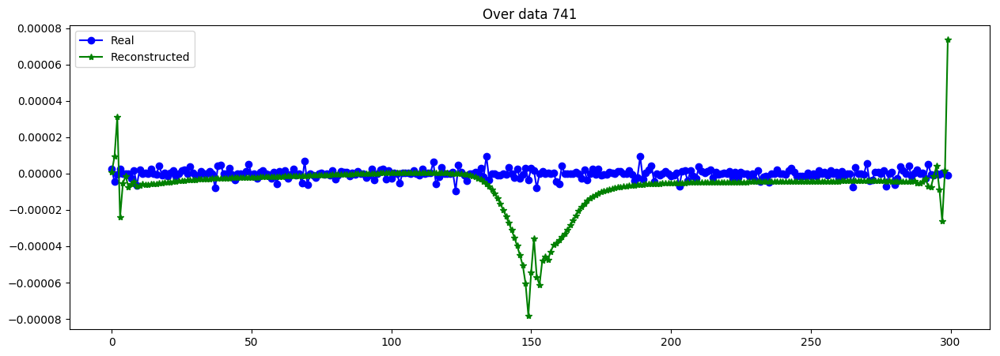

----------------------------------------------------------------
Real scale = 19546.284930
Pred scale = 83619.695312


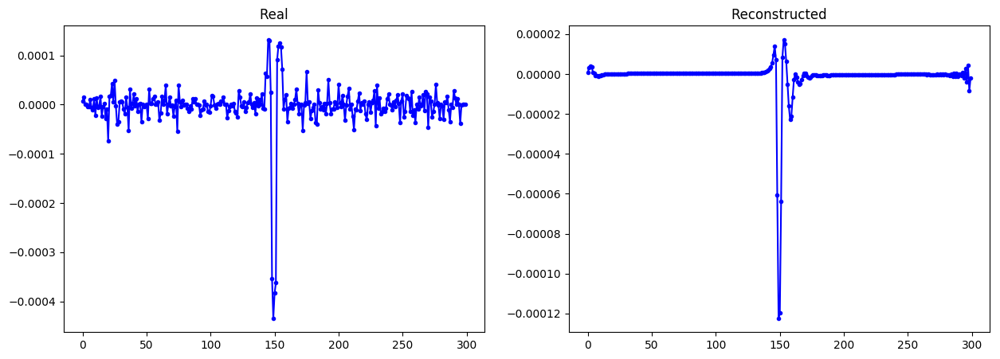

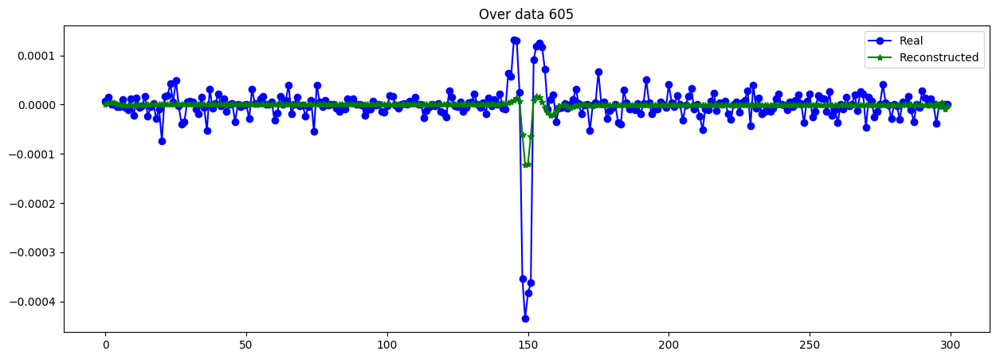

----------------------------------------------------------------
Real scale = 25444.174584
Pred scale = 16185.743164


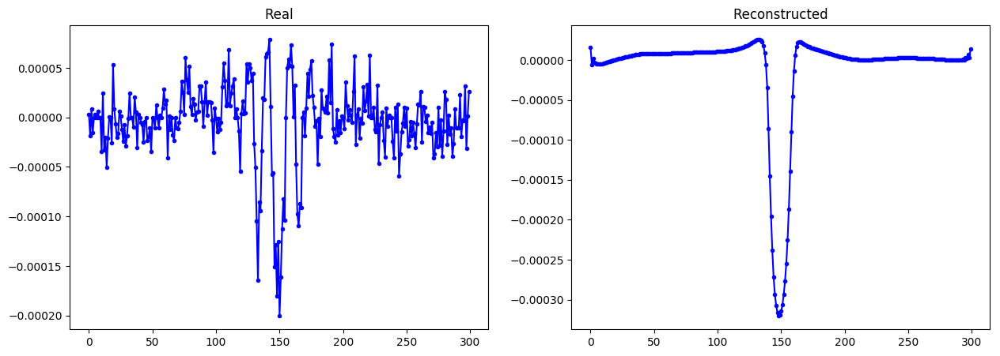

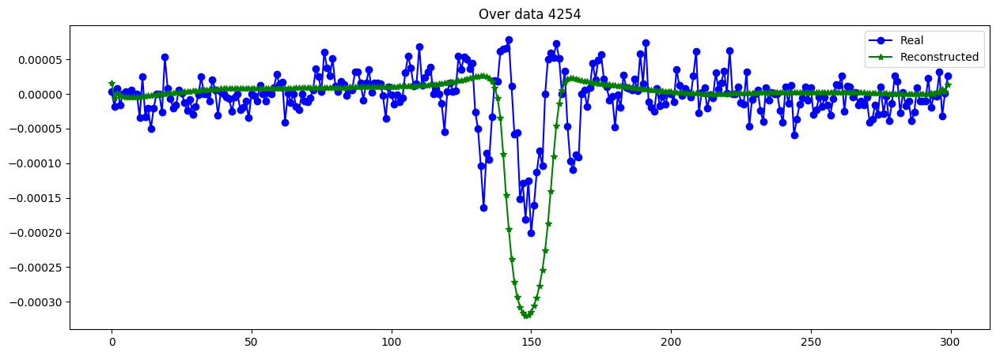

----------------------------------------------------------------


In [34]:
evaluate_reconst(X_data[:N_trans,:]*Sinv_data[:N_trans,None], X_data_CVAE*Sinv_data_hat[:N_trans,None])

evaluate_reconst(X_data[:N_trans,:]*Sinv_data[:N_trans,None], X_data_CVAE*Sinv_data[:N_trans,None])
print("MSE de escala escalado= ",mean_squared_error(Sinv_data[:N_trans],Sinv_data_hat)*(1/Sinv_std)**2)

plot_n_lc(X_data[:N_trans], X_data_CVAE, n= 15, s=[Sinv_data[:N_trans],Sinv_data_hat]) #as MA-5

,Period,T0,r/R,a/R,Inclination,Impact Parameter,Limb Darkening Coeff1,Limb Darkening Coeff2
0,8.529122,4.264561,0.017,16.44,2.11,0.606,0.469,0.224


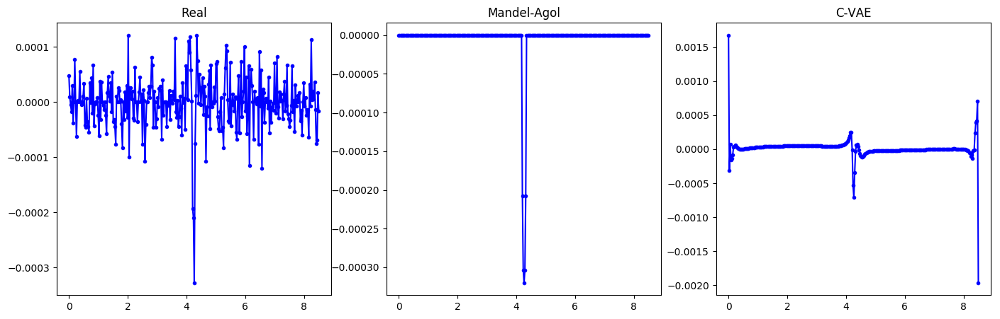

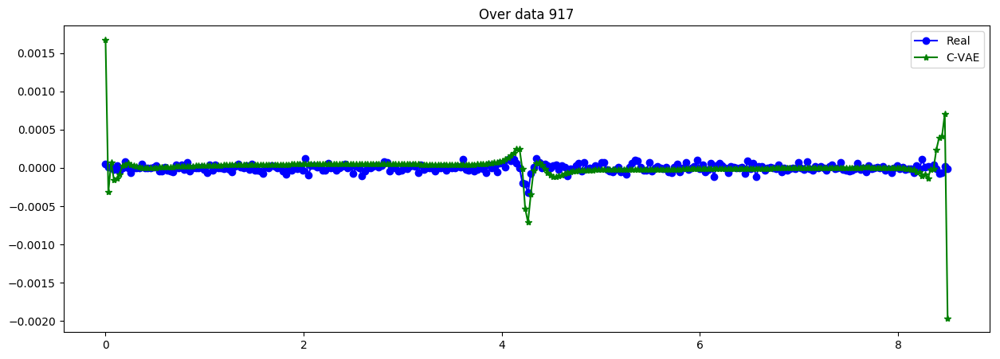

----------------------------------------------------------------


,Period,T0,r/R,a/R,Inclination,Impact Parameter,Limb Darkening Coeff1,Limb Darkening Coeff2
0,5.244916,2.622458,0.005,4.849,0.22,0.019,0.373,0.279


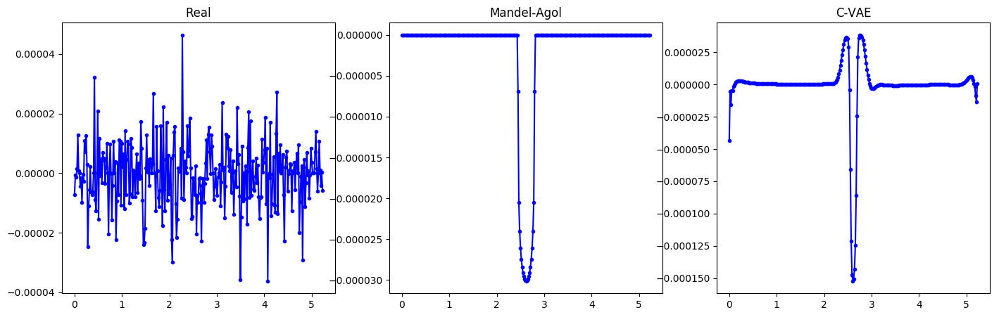

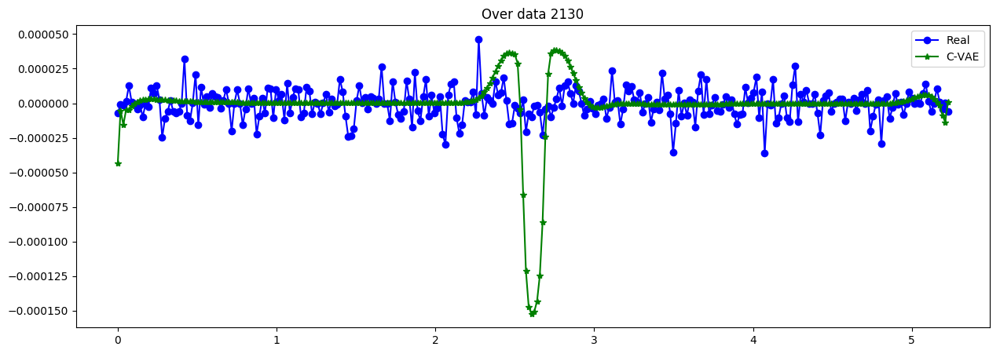

----------------------------------------------------------------


,Period,T0,r/R,a/R,Inclination,Impact Parameter,Limb Darkening Coeff1,Limb Darkening Coeff2
0,5.296556,2.648278,0.011,9.7,2.19,0.37,0.329,0.302


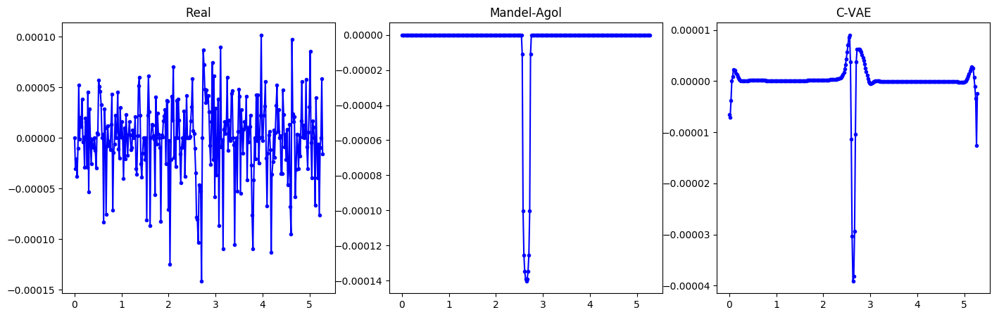

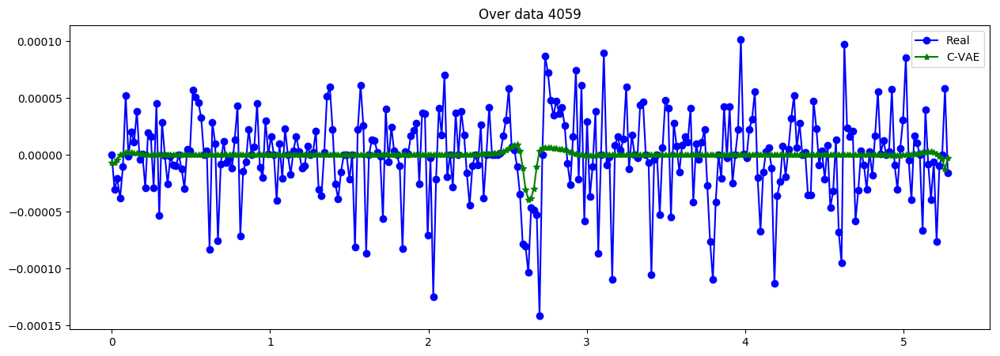

----------------------------------------------------------------


,Period,T0,r/R,a/R,Inclination,Impact Parameter,Limb Darkening Coeff1,Limb Darkening Coeff2
0,13.787263,6.893631,0.01,7.65,6.91,0.921,0.421,0.257


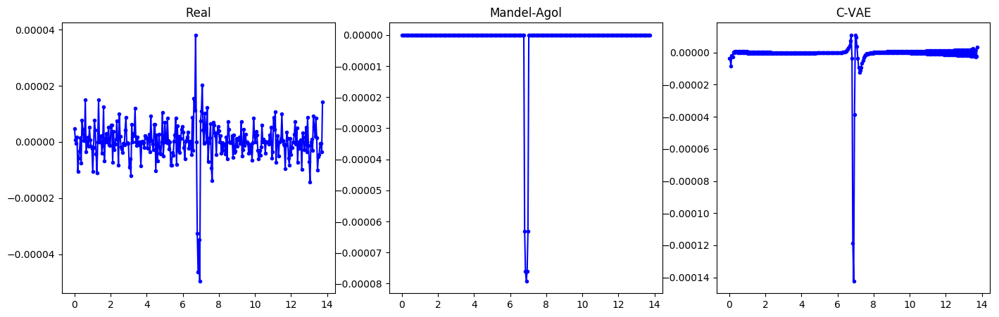

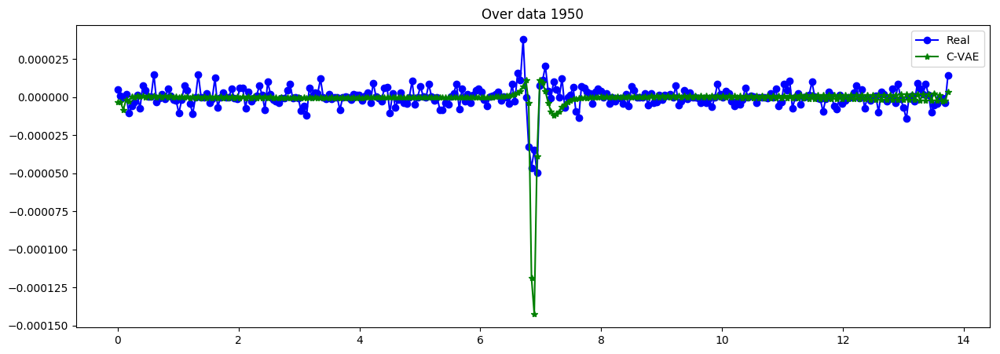

----------------------------------------------------------------


,Period,T0,r/R,a/R,Inclination,Impact Parameter,Limb Darkening Coeff1,Limb Darkening Coeff2
0,1.039047,0.519523,0.004,4.736,1.16,0.096,0.393,0.268


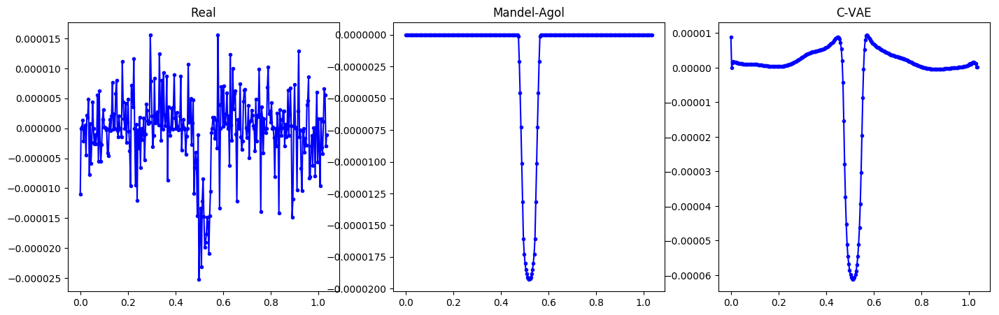

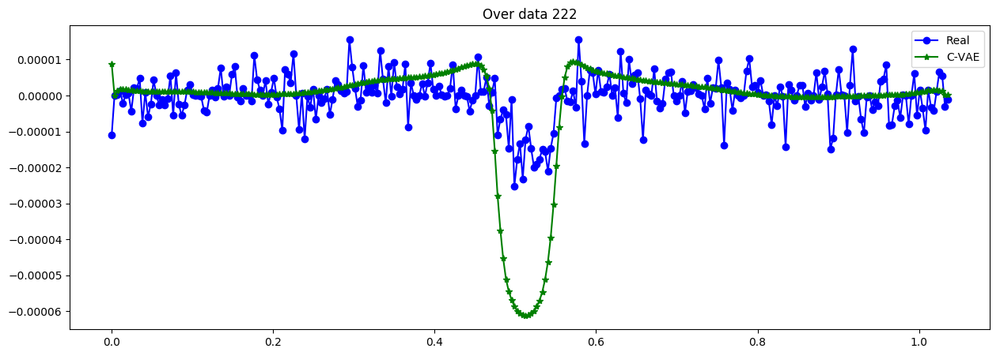

----------------------------------------------------------------


,Period,T0,r/R,a/R,Inclination,Impact Parameter,Limb Darkening Coeff1,Limb Darkening Coeff2
0,6.647545,3.323772,0.016,25.6,0.53,0.235,0.366,0.284


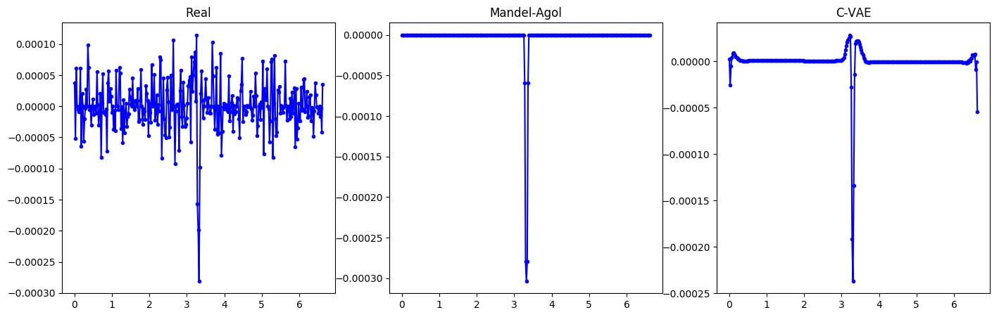

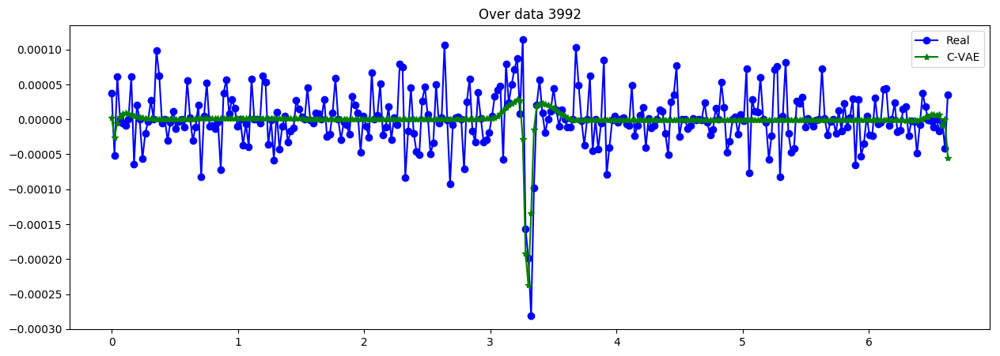

----------------------------------------------------------------


,Period,T0,r/R,a/R,Inclination,Impact Parameter,Limb Darkening Coeff1,Limb Darkening Coeff2
0,4.583521,2.29176,0.056,13.672,0.19,0.045,0.393,0.268


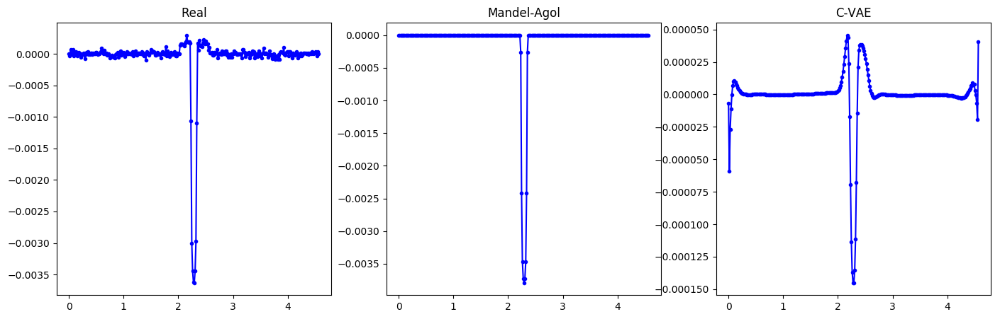

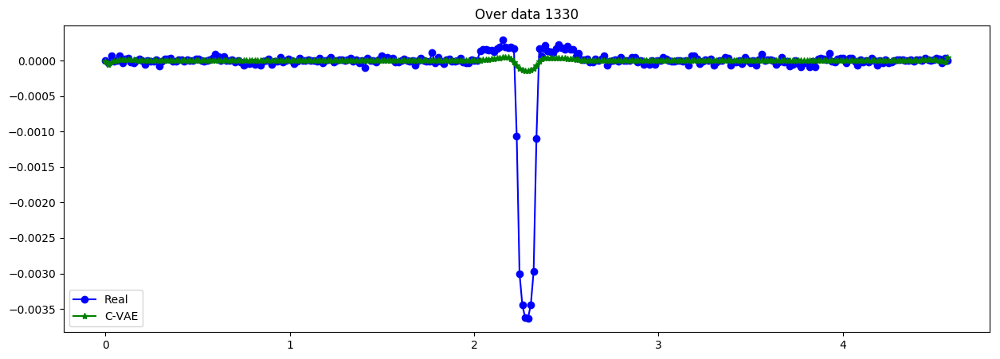

----------------------------------------------------------------


,Period,T0,r/R,a/R,Inclination,Impact Parameter,Limb Darkening Coeff1,Limb Darkening Coeff2
0,12.460565,6.230282,0.011,24.65,0.03,0.015,0.46,0.229


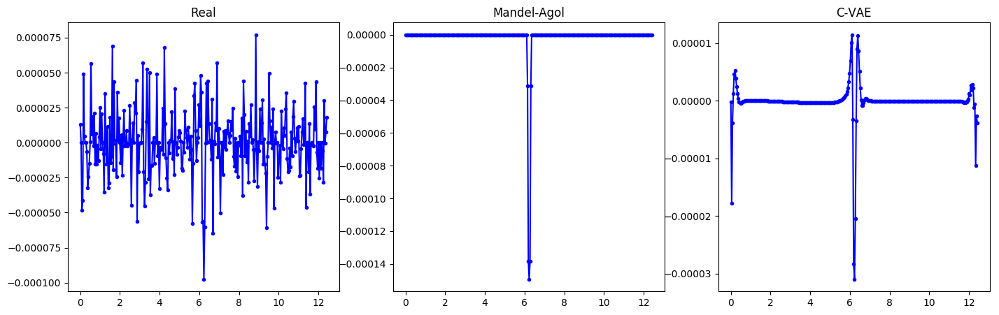

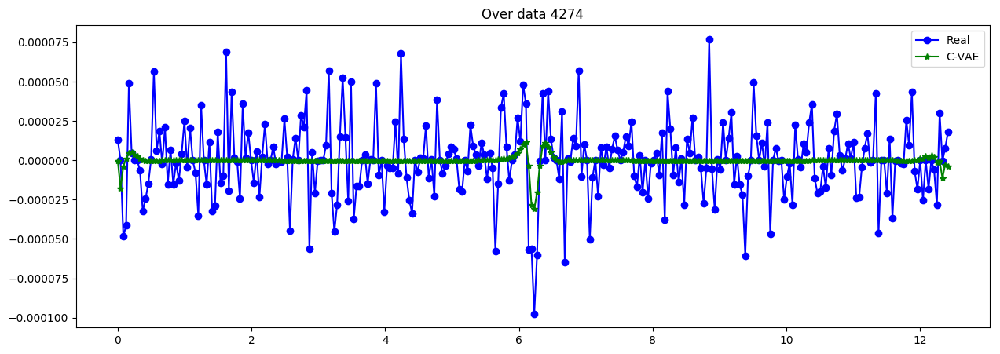

----------------------------------------------------------------


,Period,T0,r/R,a/R,Inclination,Impact Parameter,Limb Darkening Coeff1,Limb Darkening Coeff2
0,20.925408,10.462704,0.01,23.32,0.49,0.201,0.41,0.26


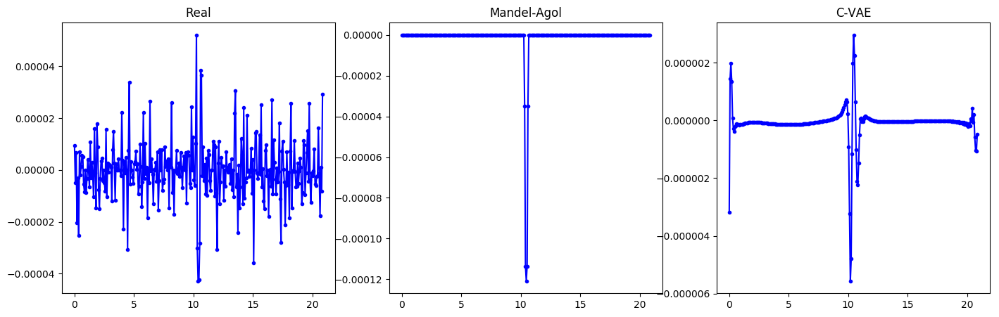

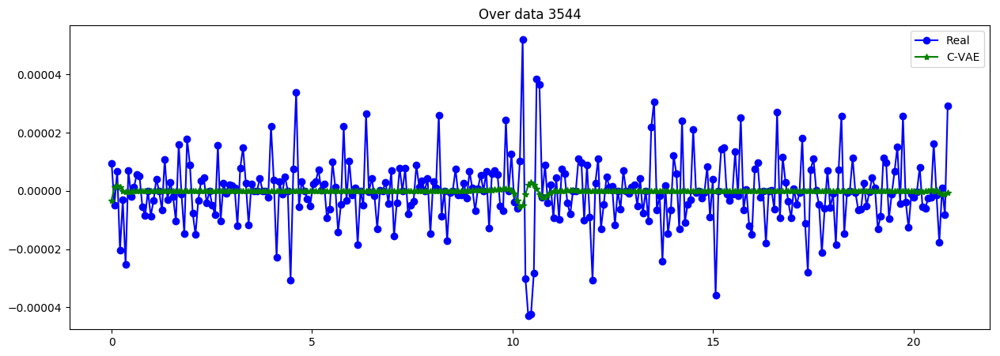

----------------------------------------------------------------


,Period,T0,r/R,a/R,Inclination,Impact Parameter,Limb Darkening Coeff1,Limb Darkening Coeff2
0,7.717907,3.858953,0.016,32.37,0.2,0.112,0.277,0.401


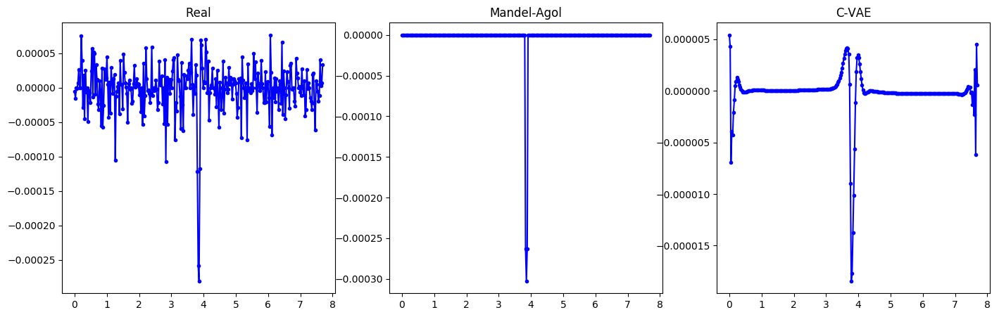

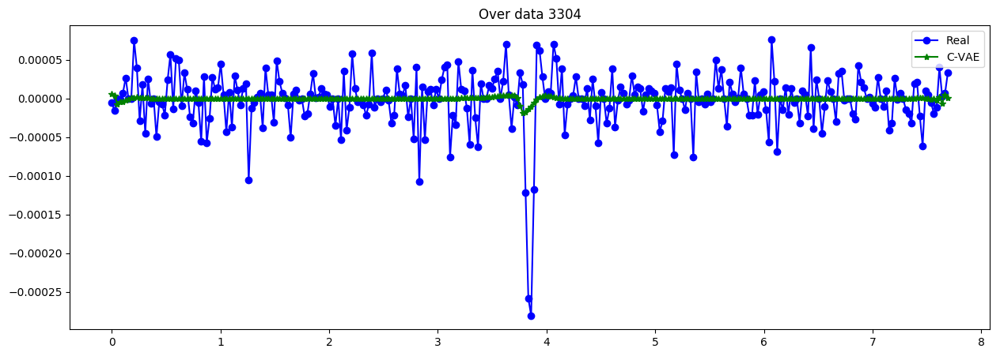

----------------------------------------------------------------


,Period,T0,r/R,a/R,Inclination,Impact Parameter,Limb Darkening Coeff1,Limb Darkening Coeff2
0,4.606906,2.303453,0.011,8.37,1.39,0.203,0.421,0.252


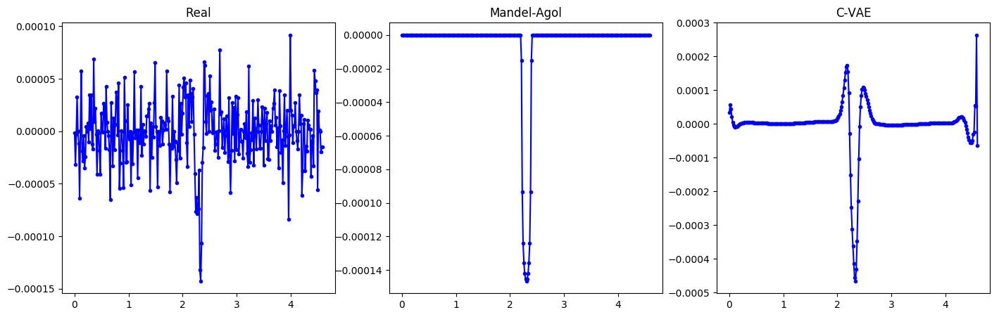

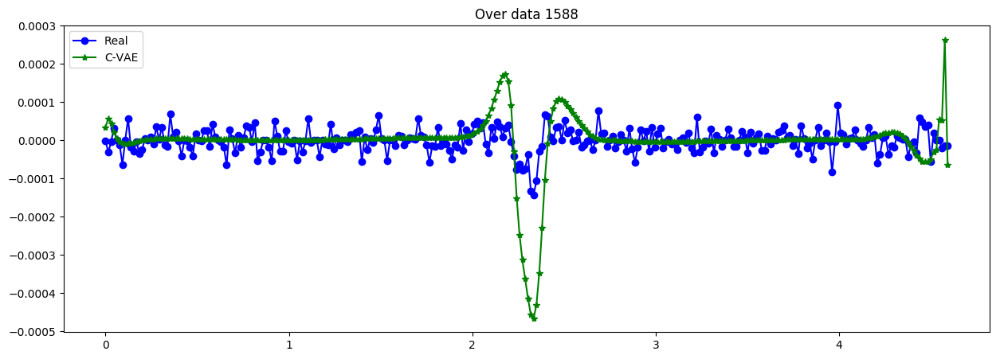

----------------------------------------------------------------


,Period,T0,r/R,a/R,Inclination,Impact Parameter,Limb Darkening Coeff1,Limb Darkening Coeff2
0,20.067925,10.033962,0.023,16.73,2.91,0.849,0.345,0.292


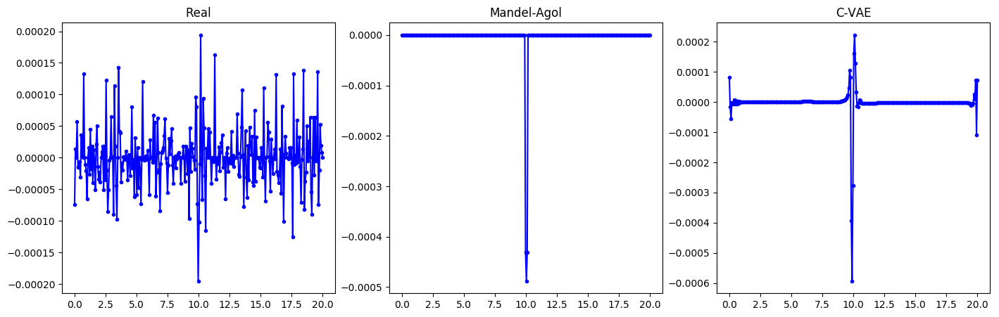

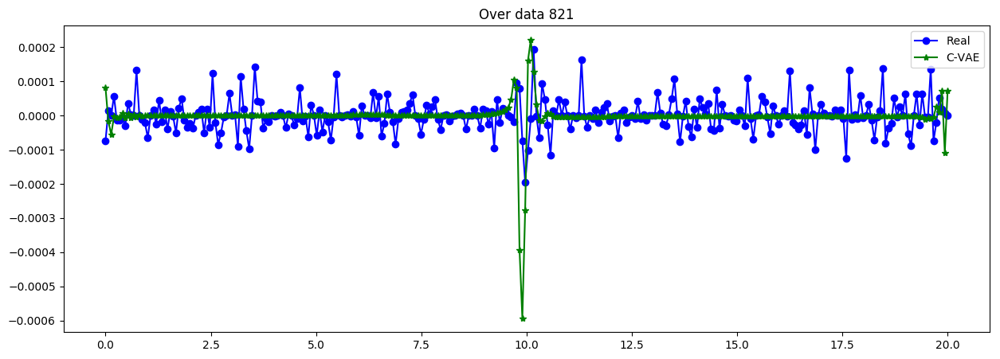

----------------------------------------------------------------


,Period,T0,r/R,a/R,Inclination,Impact Parameter,Limb Darkening Coeff1,Limb Darkening Coeff2
0,12.125806,6.062903,0.019,17.59,2.62,0.805,0.455,0.233


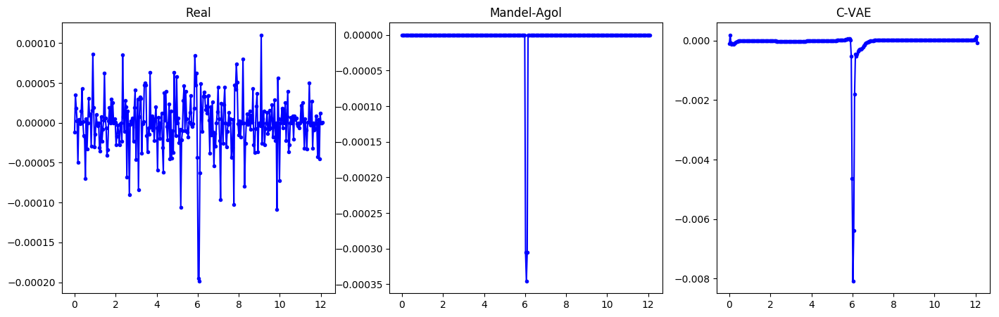

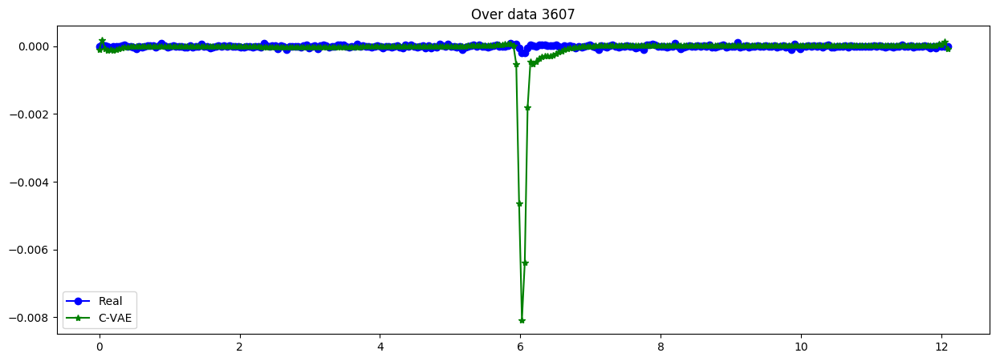

----------------------------------------------------------------


,Period,T0,r/R,a/R,Inclination,Impact Parameter,Limb Darkening Coeff1,Limb Darkening Coeff2
0,1.208529,0.604264,0.012,7.02,0.32,0.039,0.345,0.292


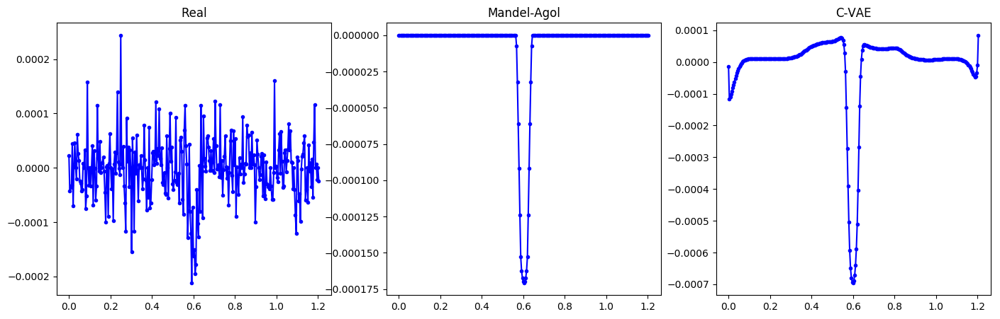

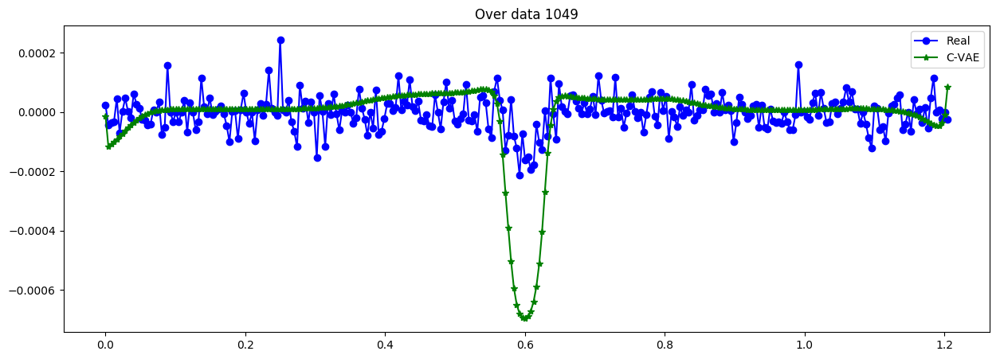

----------------------------------------------------------------


,Period,T0,r/R,a/R,Inclination,Impact Parameter,Limb Darkening Coeff1,Limb Darkening Coeff2
0,144.551628,72.275814,0.035,35.5,1.43,0.887,0.434,0.243


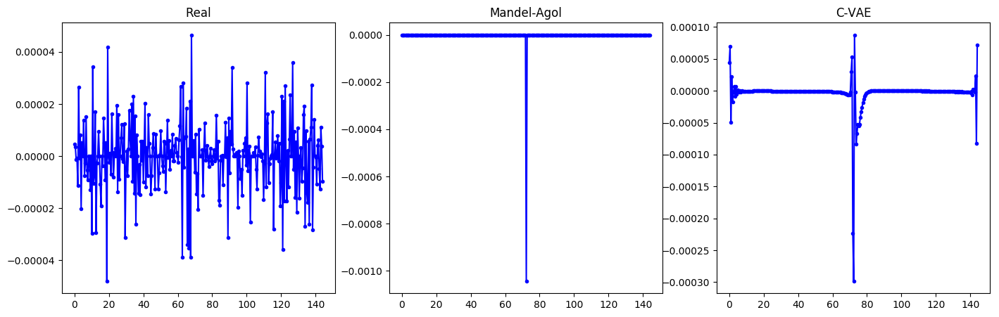

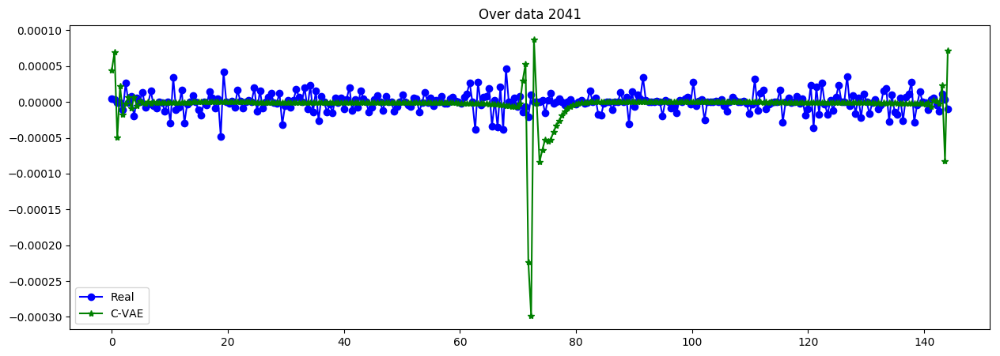

----------------------------------------------------------------


,Period,T0,r/R,a/R,Inclination,Impact Parameter,Limb Darkening Coeff1,Limb Darkening Coeff2
0,17.136941,8.56847,0.017,20.762,0.08,0.03,0.324,0.303


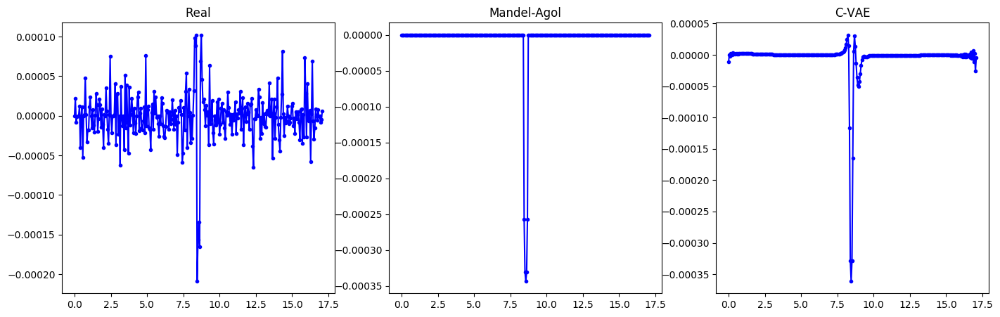

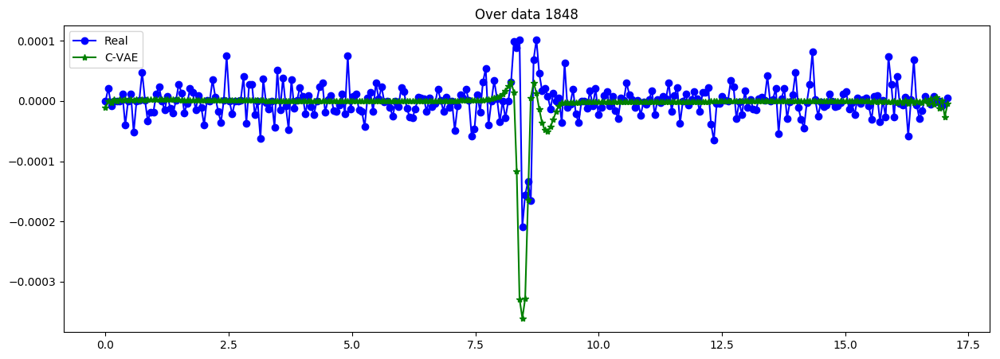

----------------------------------------------------------------


,Period,T0,r/R,a/R,Inclination,Impact Parameter,Limb Darkening Coeff1,Limb Darkening Coeff2
0,3.247549,1.623774,0.013,9.54,1.86,0.31,0.428,0.251


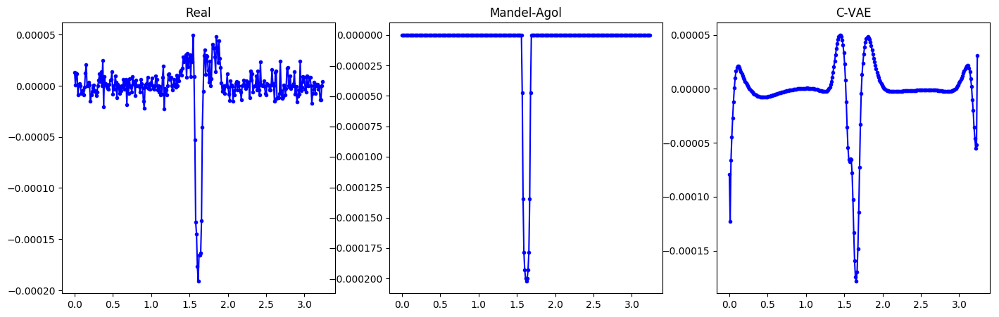

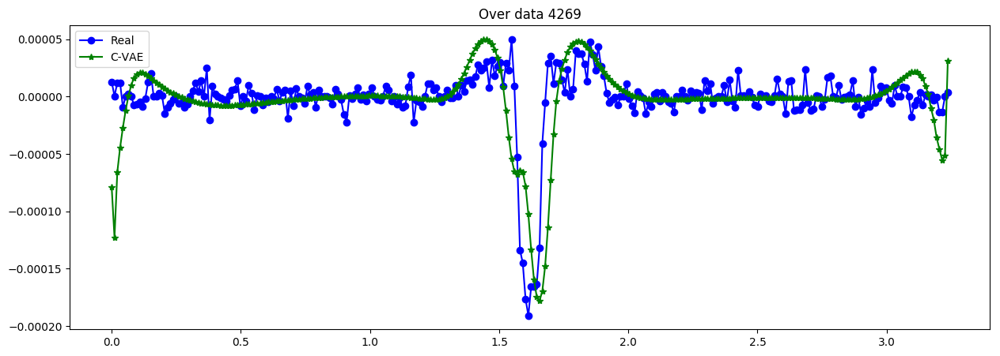

----------------------------------------------------------------


,Period,T0,r/R,a/R,Inclination,Impact Parameter,Limb Darkening Coeff1,Limb Darkening Coeff2
0,9.360597,4.680299,0.016,13.92,3.31,0.802,0.386,0.271


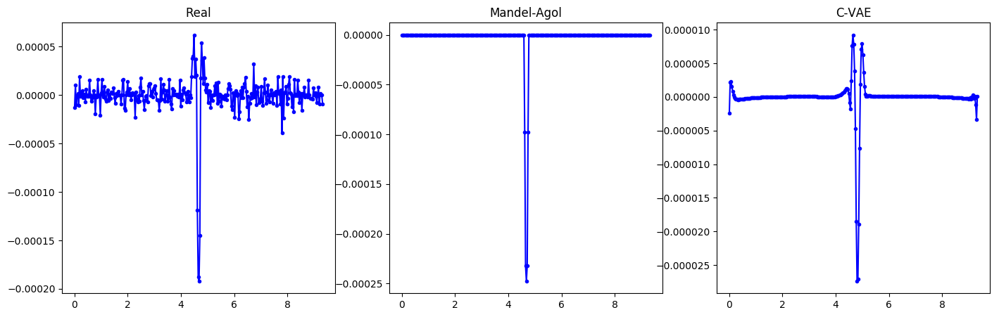

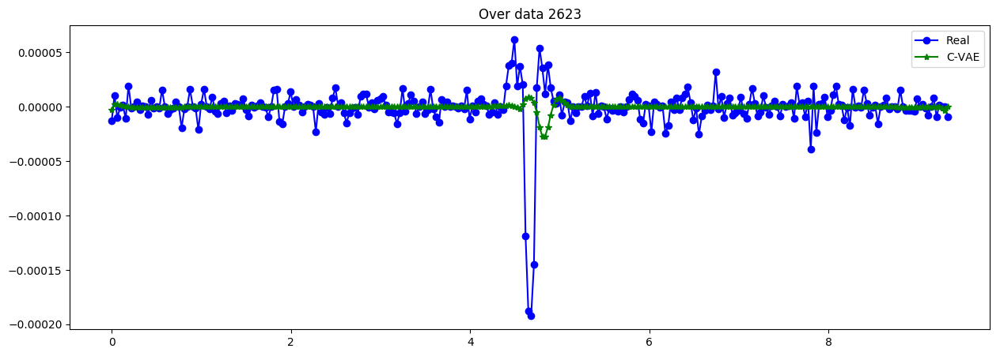

----------------------------------------------------------------


,Period,T0,r/R,a/R,Inclination,Impact Parameter,Limb Darkening Coeff1,Limb Darkening Coeff2
0,17.423936,8.711968,0.031,12.22,4.35,0.927,0.345,0.292


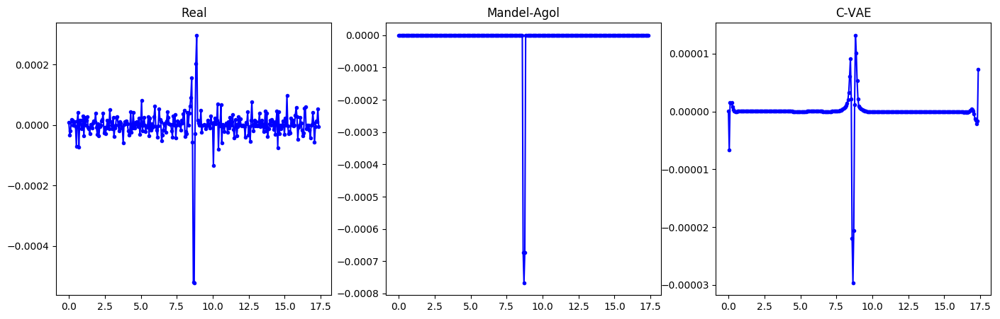

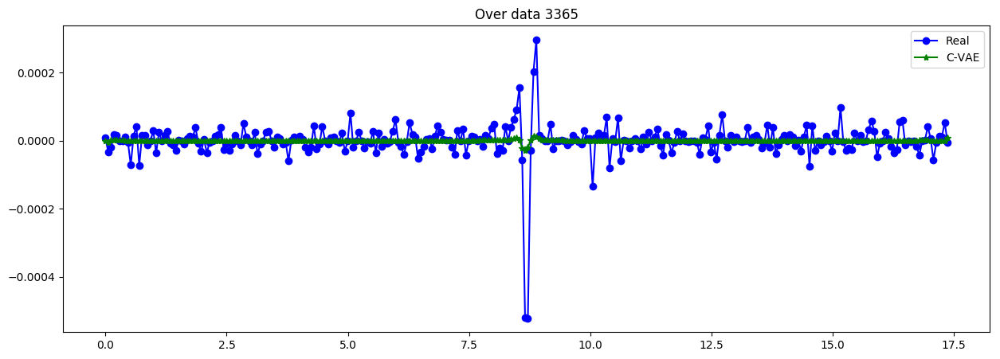

----------------------------------------------------------------


,Period,T0,r/R,a/R,Inclination,Impact Parameter,Limb Darkening Coeff1,Limb Darkening Coeff2
0,3.578781,1.78939,0.096,10.287,0.44,0.079,0.469,0.224


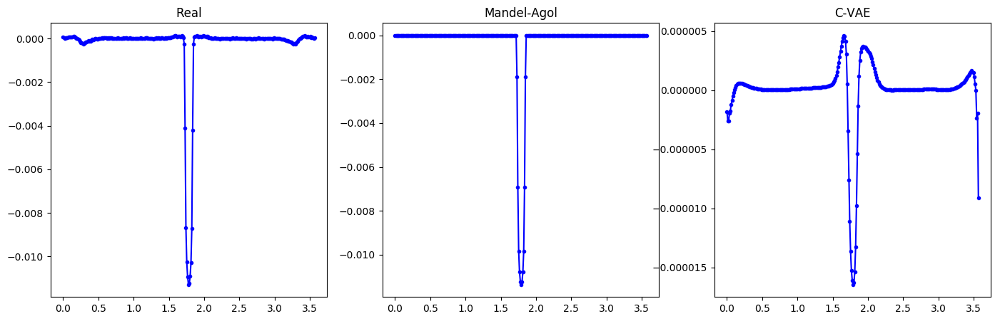

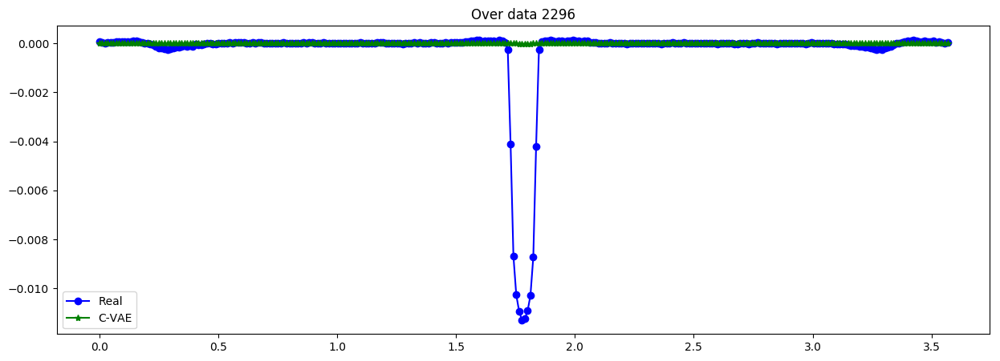

----------------------------------------------------------------


In [54]:
## generate random
n = 20

for _ in range(n):
    n_sampled = np.random.randint(0, N_trans)
    
    time_i = np.cumsum(X_data_t[n_sampled,:,0])

    f, (ax1, ax2, ax3) = plt.subplots(1, 3, sharex=True,figsize= (17,5))
    ax1.plot(time_i, X_data[n_sampled], 'b.-')
    ax1.set_title("Real")
    
    #Simular MA
    sim_dat = {v: df_meta_transit.iloc[n_sampled][v] for v in MA_sim_names if v != "Inclination" and v!= "T0"} #get metadata
    sim_dat["T0"] = time_i[int(np.round(len(time_i)/2))] #trabajando con folds global ...
    sim_dat["Inclination"] = df_meta_transit.iloc[n_sampled]["Comp_I"]
    x_MA = simulate_MA(time_i, sim_dat)-1
    
    ax2.plot(time_i, x_MA, 'b.-')
    ax2.set_title("Mandel-Agol")
    
    #Simular con C_VAE
    z_sampled = np.random.normal(0, 1, size=(1,latent_dim))
    Dtime_i = transform_delta(time_i)[None,:,None]
    #meta_T = Ystd_transit[n_sampled][None,:]
    meta_T = Y_transit[n_sampled][None,:]
    x_CVAE = generator.predict([Dtime_i, z_sampled, meta_T] )
    
    ax3.plot(time_i, x_CVAE[0], 'b.-')
    ax3.set_title("C-VAE")
    plt.show()   

    plt.figure(figsize=(15,5))
    plt.plot(time_i, X_data[n_sampled], 'bo-', label="Real")
    plt.plot(time_i, x_CVAE[0], 'g*-', label="C-VAE")
    plt.title("Over data "+str(n_sampled))
    plt.legend()
    plt.show()
    print("----------------------------------------------------------------")